## **Library Imports**

In [ ]:
import pandas as pd
import numpy as np
import math
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import log_loss, classification_report, accuracy_score, precision_score, recall_score, f1_score, multilabel_confusion_matrix, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import OneHotEncoder

from bs4 import BeautifulSoup
from html import unescape

from collections import Counter, defaultdict

from matplotlib import pyplot as plt
import seaborn as sns
from itertools import cycle

import time
import inspect
from os import path
import sys  
if 'contractions' not in sys.modules:
  !{sys.executable} -m pip install contractions

import contractions

import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.corpus import stopwords, wordnet
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk import pos_tag


import torch
import torch.nn as nn





[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## **Data Preprocessing and Statistics**

Functions for neccessary **text cleaning** including URL and HTML removal, contraction normalization, lowercasing and further noisy input elimination (such as emojis, symbols etc...). An extra preprocessing stage (such as stopword removal, length filtering, lemmatization etc...) can also be applied

In [ ]:
def removeHTML(text):
  soup = BeautifulSoup(text)
  soup = BeautifulSoup(unescape(soup.get_text()), 'lxml')
  return soup.get_text()

def fixContractions(tweet):
  expanded_words = []    
  for word in tweet.split():
    expanded_words.append(contractions.fix(word).lower())
  return expanded_words

def get_pos(tag):
  if tag.startswith('J'):
    return wordnet.ADJ
  elif tag.startswith('V'):
    return wordnet.VERB
  elif tag.startswith('R'):
    return wordnet.ADV
  else:
    return wordnet.NOUN

def normalization(tweet, lemmatizer):
  tagged_tweet = pos_tag(tweet.split())
  clean_tweet = ' '.join([lemmatizer.lemmatize(word, get_pos(tag)) for word, tag in tagged_tweet])
  return clean_tweet

def extra_preprocessing(df, column):
  lemmatizer = WordNetLemmatizer()
  #stemmer = PorterStemmer()
  stop_words = set(stopwords.words('english'))
  # Some words that might be useful for sentiment recognition
  special_word_set = set(['no', 'we', 'i', 'you', 'not'])
  # Lemmatization
  df[column] = df[column].apply(lambda tweet: normalization(tweet, lemmatizer))
  # Stopword removal and length filtering
  df[column] = df[column].apply(lambda tweet: ' '.join([w for w in tweet.split() if (len(w) > 2 and w not in stop_words) or w in special_word_set]))

# All the neccessary cleaning for the data
def preprocessing(df, column, simple_preprocessing = True):
  # Lowercasing all characters in order to treat all words in a same way
  df[column] = df[column].str.lower()
  # Removal of tweet mentions (names appeared in mentions are not so important)
  #df['tweet'] = df['tweet'].str.replace(r'@\S+', '')
  # Retweet removal
  df[column] = df[column].str.replace(r'\s+rt|^rt', '')
  # URL and HTML tag cleaning (some links dont make any sense and are not so important)
  df[column] = df[column].str.replace(r'http\S+|www.\S+', '')
  df[column] = df[column].apply(removeHTML)
  # Contraction fixing
  df[column] = df[column].apply(lambda tweet: ' '.join(fixContractions(tweet)))
  # Non letter character removal
  df[column] = df[column].str.replace(r'-|–|\[|\]|_', '').str.replace(r'[^a-zA-z]+', ' ')
  # Whitespace removal
  df[column] = df[column].str.replace(r'\s+', ' ')
  if not simple_preprocessing:
    extra_preprocessing(df, column)
  # Empty tweet removal
  df = df[df[column] != '']

**Dataset loading** and **preprocessing** using the above fuctions 

In [ ]:
#LOAD TEST SET AS ./vaccine_validation_set.csv OR GIVE THE RIGHT PATH

# Reading the two csv files with pandas
training_set = pd.read_csv('./vaccine_train_set.csv', encoding = 'utf-8')
validation_set = pd.read_csv('./vaccine_validation_set.csv', encoding = 'utf-8')
print('\nBefore cleaning:')
print(training_set.head(10))
print(validation_set.head(10))


preprocessing(training_set, 'tweet', simple_preprocessing = False)
preprocessing(validation_set, 'tweet', simple_preprocessing = False)

print('\nAfter cleaning:')
print(training_set.head(10))
print(validation_set.head(10))


Before cleaning:
   Unnamed: 0                                              tweet  label
0           0  Sip N Shop Come thru right now #Marjais #Popul...      0
1           1  I don't know about you but My family and I wil...      1
2           2  @MSignorile Immunizations should be mandatory....      2
3           3  President Obama spoke in favor of vaccination ...      0
4           4  "@myfoxla: Arizona monitoring hundreds for mea...      0
5           5  Why did I get my whooping cough vaccine the sa...      2
6           6  Prosecutor Ken Ervin: I want to know how reckl...      0
7           7  "@UberFacts: On average, people who complain l...      0
8           8  The legacy of @JennyMcCarthy will be she took ...      2
9           9  “@UberFacts: On average, people who complain l...      0
   Unnamed: 0                                              tweet  label
0           0  @user They had a massive surge in with covid d...      1
1           1  Required vaccines for school: P

Visualization of the results extracted from the **statistical analysis** for the tweets

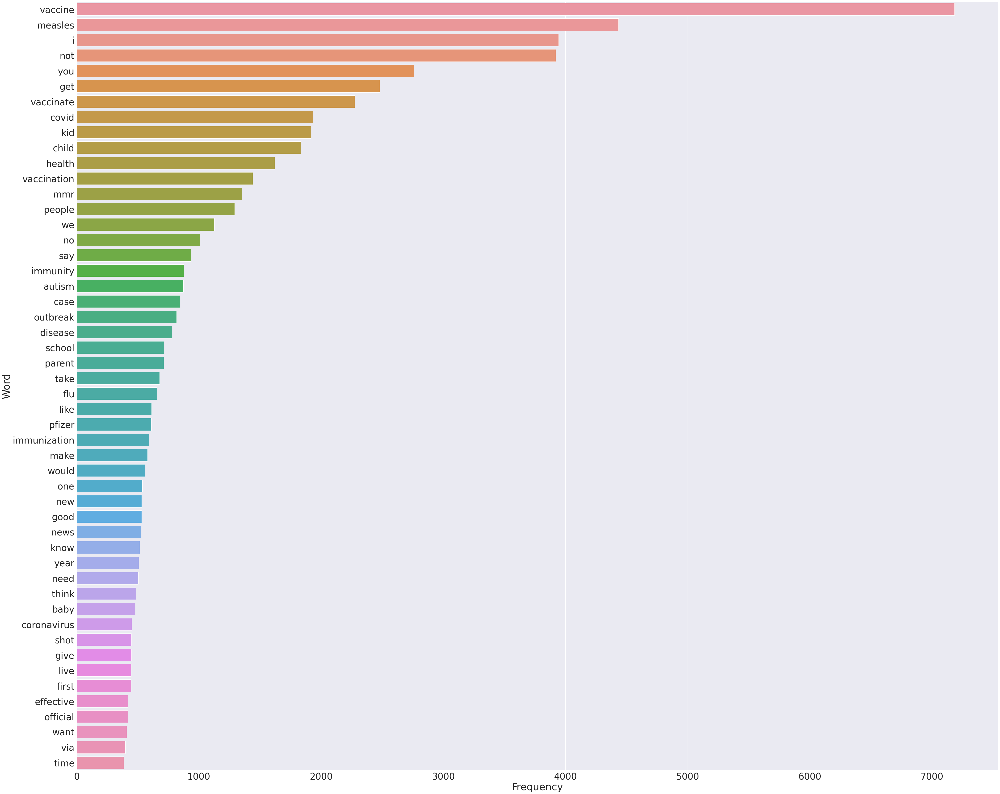

Training set size is 15976
Neutral tweets are 46.68252378567852%
Antivax tweets are 12.975713570355532%
Provax tweets are 40.34176264396595%


In [ ]:
# Visualization of the most common words (for better insights)
def tweetStatistics(tweets):
  all_words = []
  for tweet in tweets:
    for word in tweet.split():
      all_words.append(word)
  # Using pandas to merge the word column and the frequency column for seaborn barplot
  word_freq = pd.DataFrame(Counter(all_words).items(), columns = ['Word','Frequency']).sort_values(by = 'Frequency', ascending = False)
  figure = plt.figure()
  figure.set_figwidth(70)
  figure.set_figheight(60)
  sns.set(font_scale = 3.5)
  bar = sns.barplot(x = 'Frequency', y = 'Word', data = word_freq.head(50))
  plt.show()
  sns.set(font_scale = 1)

tweetStatistics(training_set['tweet'].tolist())
training_size = len(training_set['tweet'].tolist())
print('Training set size is %d' % training_size)
stats = training_set.groupby(['label']).count()
for stat, name in zip(stats['tweet'].tolist(), ['Neutral', 'Antivax', 'Provax']):
  print(name + ' tweets are ' + str(stat/training_size*100) + '%')


## **Training a Feed Forward Neural Net**

Useful functions for  **perfomance visualization**. These functions are used for plotting **confusion matrices**, **learning curves** (loss vs epochs)  and **roc curves**

In [ ]:
def plotConfusionMatrix(matrix, title, ax, targets = None):
    sns.heatmap(matrix, annot = True, cmap = 'Blues', fmt = "d", ax = ax)
    ax.set_title(title + '\n');
    if targets is None:
      ax.xaxis.set_ticklabels(['False', 'True'])
      ax.yaxis.set_ticklabels(['False', 'True'])
    else:
      ax.xaxis.set_ticklabels(targets)
      ax.yaxis.set_ticklabels(targets)
    ax.tick_params(axis = 'both', which = 'major', labelsize = 10, labelbottom = False, bottom = False, top = False, labeltop = True)

def plotConfusionMatrices(targets, class_confusion_matrices, glob_confusion_matrix = None):
    if glob_confusion_matrix is not None:
      fig, axes = plt.subplots(1, len(targets) + 1)
    else:
      fig, axes = plt.subplots(1, len(targets))

    fig.set_figheight(4)
    fig.set_figwidth(20)
    i = 0
    for matrix, target in zip(class_confusion_matrices, targets):
      plotConfusionMatrix(matrix, 'Confusion Matrix for ' + target, axes[i])
      i += 1
      print()

    if glob_confusion_matrix is not None:
      plotConfusionMatrix(glob_confusion_matrix, 'Global Confusion Matrix', axes[-1], targets)
    
    plt.tight_layout()
    plt.show()


def plotLearningCurves(x_axis, y_axis, x_label, y_label, curve_ids, ax, x_best = None, y_best = None):
  if x_best is not None and y_best is not None:
    ax.annotate('Early Stopping Checkpoint ' + str(x_best), xy = (x_best, y_best), arrowprops = dict(facecolor = 'black', shrink = 0.05))
  for y, id in zip(y_axis, curve_ids):
    ax.plot(x_axis, y, label = id, linewidth = 4)
  ax.set_title('Learning Curves')
  ax.set_xlabel(x_label)
  ax.set_ylabel(y_label)
  ax.legend(loc = 'lower right')
 

def plotRocCurves(fpr, tpr, roc_auc, n_classes, lw = 2):
  plt.figure()
  plt.plot(
      fpr['micro'],
      tpr['micro'],
      label = 'micro-average ROC curve (area = {0:0.2f})'.format(roc_auc['micro']),
      color = 'deeppink',
      linestyle = ':',
      linewidth = 4,
  )

  plt.plot(
      fpr['macro'],
      tpr['macro'],
      label = 'macro-average ROC curve (area = {0:0.2f})'.format(roc_auc['macro']),
      color = 'navy',
      linestyle = ':',
      linewidth = 4,
  )

  colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
  for i, color in zip(range(n_classes), colors):
      plt.plot(
          fpr[i],
          tpr[i],
          color = color,
          lw = lw,
          label = 'ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]),
      )

  plt.plot([0, 1], [0, 1], 'k--', lw = lw)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver Operating Characteristic Curves')
  plt.legend(loc = 'lower right')
  plt.show()



Some **activation** and **loss** functions, **optimizers** and **scheldulers** that are going to be tested below. The  model is going to use either the **SELU**, or **ReLU** activation function (at hidden layers), either the **Cross Entropy** or **Hinge multinomial** loss function (the last one is an extension of the maximum margin objective function to work with multiclass classfication), either **Stohastic Gradient Decent** (or some variations like **Nesterov** and **Momentum**) or **Adadelta** or **Adam** optimizer and some scheldulers (in order to adjust the learning rate properly and help the training process to avoid big steps) like **Exponential** schelduler, **One Cycle** schelduler **Performance** schelduler etc...

In [ ]:
activation_functions = {
    'SELU': nn.SELU,
    'ReLU': nn.ReLU
}

loss_functions = {
    'CrossEntropy': nn.CrossEntropyLoss,
    'Hinge': nn.MultiMarginLoss
}

optimizers = {
    'SGD': lambda model_params, learning_rate, L2_reg: torch.optim.SGD(model_params, lr = learning_rate, weight_decay = L2_reg),
    'Momentum': lambda model_params, learning_rate, L2_reg: torch.optim.SGD(model_params, lr = learning_rate, momentum = 0.9, weight_decay = L2_reg), # Typical momentum value
    'Nesterov': lambda model_params, learning_rate, L2_reg: torch.optim.SGD(model_params, lr = learning_rate, momentum = 0.9, nesterov = True, weight_decay = L2_reg), # Typical momentum value
    'Adadelta': lambda model_params, learning_rate, L2_reg: torch.optim.Adadelta(model_params, lr = learning_rate, weight_decay = L2_reg),
    'Adam': lambda model_params, learning_rate, L2_reg: torch.optim.Adam(model_params, lr = learning_rate, weight_decay = L2_reg) 
}

# Popular learning rate scheldulers
scheldulers = {
  'Exponential': lambda optimizer, step: torch.optim.lr_scheduler.LambdaLR(optimizer, lambda epoch: 0.1 ** (epoch / step)), # Initial lr* 0.1^(t/step)
  'Power': lambda optimizer, step: torch.optim.lr_scheduler.LambdaLR(optimizer, lambda epoch: 1 / (1 + epoch / step)), # Initial lr/ (1 + t/step)
  'Piecewise': lambda optimizer, milestones:  torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones = milestones, gamma = 0.1), # lr for 1 <= epoch < m1, lr*0.1 for m1 <= epoch < m2 ...
  'Performance': lambda optimizer, patience : torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', patience = patience),
  'OneCycle': lambda optimizer, steps_per_epoch, epochs, max_lr : torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr = max_lr, anneal_strategy = 'linear', steps_per_epoch = steps_per_epoch, epochs = epochs)
}


This is the actual class of the **Feed Forward** neural network. This class has been extended with some extra functionalities in order to automate all the training and evaluation process as much as possible. Initialization requires only the layers with their number of neurons in order to connect them automatically and to do some **weight initialization** according to the given activation function of each layer preventing **vanishing/exploding gradients**. Also there are two functions for **training** but the one with the more options (stats, early stopping etc...) it is going to be used below. Furthermore, these functions support **learning rate schelduling** and they call in every epoch the **batch** training submethod to train all the batches. About the forward pass of the training it has been extended to do some **batch normalization** on the input if needed. Finally, there is one method for making predictions for any given unseen input

In [ ]:
class NeuralNet(nn.Module):
    def __init__(self, layers, D_in, batch_norm_input = False):
        super().__init__()

        # Layers are stored in a ModuleList in order to be found by the optimizer
        self.layers = nn.ModuleList([])
        # All activation functions for each layer
        self.activations = []

        # Batch normalization layer
        self.batch_norm = nn.BatchNorm1d(D_in, affine = False) if batch_norm_input else None
        
        for i in range(len(layers)):
          if i == 0: # The input for the first layer is always a training instance
            self.layers.append(nn.Linear(D_in, layers[0]['neurons']))
          else: # Every intermediate layer as well as the output layer is fed with the output of their previous one
            self.layers.append(nn.Linear(layers[i - 1]['neurons'], layers[i]['neurons']))
          self.activations.append(layers[i]['activation_fun'])
        
        if self.activations[-1] is None: # If softmax is missing at the output layer model is going to use it only for making probability predictions
          self.softmax = nn.LogSoftmax(dim = 1)
          
        # Popular weight initializations for each type of activation function
        weight_init = {
            'ReLU': torch.nn.init.kaiming_uniform_, # HE initialization should be applied to the linear layer
            'SELU': None, # LeCun initialization should be applied but it is the default for the linear layer
            'Softmax': torch.nn.init.xavier_uniform_, # Glorot initialization should be applied to the linear layer
            'LogSoftmax': torch.nn.init.xavier_uniform_ # Glorot initialization should be applied to the linear layer
        }

        for layer, activation_fun in zip(self.layers, self.activations):
          # Initialization of the weights for each layer according to their activation functions in order to avoid vanishing/exploding gradients
          if activation_fun is not None and weight_init[type(activation_fun).__name__] is not None:
            weight_init[type(activation_fun).__name__](layer.weight)
        
    def forward(self, X):
        out = None
        for layer, activation_fun in zip(self.layers, self.activations):
          if out is None: # This is the first time so the initial input will be given to the current layer
            if self.batch_norm is not None: # Input normalization using batch normalization
              X = self.batch_norm(X)
            out = layer(X)
          else: # The previous output will be given as input to the current layer
            out = layer(out)
          if activation_fun is not None: # If an activation function exists it is applied to the output of the same layer
            out = activation_fun(out)
      
        return out
    
    def batchTrain(self, batch_loader, optimizer, loss_fun, schelduler = None):
      total_loss = 0.0
      correct_preds = 0.0
      total = 0.0
      f1_scores = 0.0

      for x_batch, y_batch in batch_loader:
        y_pred = self(x_batch)

        loss = loss_fun(y_pred, y_batch)
        total_loss += loss.item()
        
        # Gradients are restored to zero
        optimizer.zero_grad()
        # Backpropagation starting from the loss calculated in this epoch
        loss.backward()
        # Model's weights update based on the gradients calculated during backprop
        optimizer.step()

        # Some scheldulers can make steps inside the batches such as OneCycle schelduler
        if schelduler is not None:
          schelduler.step()
          #print(schelduler.state_dict())

        # Batch accuracy score calculation
        if self.activations[-1] is None:
          y_pred = self.softmax(y_pred)
        
        # Gathering information for calculating accuracy score
        correct_preds += torch.max(y_pred, 1)[1].eq(y_batch).sum().item()
        total += len(y_batch)

        # F1 score of the batch
        f1_scores += f1_score(y_batch.detach().numpy(), torch.max(y_pred, 1)[1].detach().numpy(), average = 'weighted')

      return [correct_preds / total, total_loss / len(batch_loader), f1_scores / len(batch_loader)] # Accuracy, Loss, F1 score (an average approximation)
    
    def batchEval(self, batch_loader, loss_fun):
          total_loss = 0.0
          correct_preds = 0.0
          total = 0.0
          f1_scores = 0.0

          with torch.no_grad():
            for x_batch, y_batch in batch_loader:
              y_pred = self(x_batch)
                
              loss = loss_fun(y_pred, y_batch)
              total_loss += loss.item() 
              
              # Batch accuracy score calculation
              if self.activations[-1] is None:
                y_pred = self.softmax(y_pred)
          
              correct_preds += torch.max(y_pred, 1)[1].eq(y_batch).sum().item()
              total += len(y_batch)

              # F1 score of the batch
              f1_scores += f1_score(y_batch.detach().numpy(), torch.max(y_pred, 1)[1].detach().numpy(), average = 'weighted')
          
          return [correct_preds / total, total_loss / len(batch_loader), f1_scores / len(batch_loader)]
        
    def trainNN(self, training_set, optimizer, loss_fun, lr_schelduler = None, epochs = 100, batch_size = 64):
      # Switching to training mode
      self.train()

      # Training batches
      dataset = torch.utils.data.TensorDataset(training_set[0], training_set[1])
      batch_loader = torch.utils.data.DataLoader(dataset, batch_size = batch_size, shuffle = True)
      
      # Creating the right schelduling function
      if lr_schelduler is not None:
        if lr_schelduler['name'] != 'Performance':
          schelduler = lr_schelduler['schelduler']
        else:
          raise Exception('Performance schelduling cannot be applied')

      for epoch in range(1, epochs + 1):
        if lr_schelduler is not None and not lr_schelduler['epoch_step']:  # For OneCycle schelduler for example is better to make steps inside the batches
          acc_score, loss_score, f1 = self.batchTrain(batch_loader, optimizer, loss_fun, schelduler)
        else:
          acc_score, loss_score, f1 = self.batchTrain(batch_loader, optimizer, loss_fun)
    
        # Learning rate modification for the next epoch
        if lr_schelduler is not None and lr_schelduler['epoch_step']:
          schelduler.step()
          #print(schelduler.state_dict())
        
        print(f'Epoch {epoch:3}: Accuracy = {acc_score:.5f}, Loss = {loss_score:.5f} , F1 score = {f1:.5f}')

    def trainNNWithOptions(self, training_set, optimizer, loss_fun, validation_set = None, lr_schelduler = None, epochs = 100, batch_size = 64, stats = False, early_stopping_params = None):
      if validation_set is not None and (stats != False or early_stopping_params is not None or (lr_schelduler is not None and lr_schelduler['name'] == 'Performance')): 
        valid_losses = []
        valid_acc_scores = []
        valid_f1_scores = []
        train_losses = []
        train_acc_scores = []
        train_f1_scores = []
        best_score = float('inf')
        best_iter = 1
        counter = 0
        epoch = 1

        # Training batches
        dataset = torch.utils.data.TensorDataset(training_set[0], training_set[1])
        training_batch_loader = torch.utils.data.DataLoader(dataset, batch_size = batch_size, shuffle = True)

        # Validation batches
        dataset = torch.utils.data.TensorDataset(validation_set[0], validation_set[1])
        validation_batch_loader = torch.utils.data.DataLoader(dataset, batch_size = batch_size)

        # Creating the right schelduling function
        if lr_schelduler is not None:
          schelduler = lr_schelduler['schelduler']
        
        for epoch in range(1, epochs + 1): 
          # Switching to training mode
          self.train()
          # Batch training and calculation of the average training batch scores (accuracy score, loss, f1 score)
          if lr_schelduler is not None and not lr_schelduler['epoch_step']:  # For OneCycle schelduler for example is better to make steps inside the batches
            train_acc_score, train_loss, train_f1_score = self.batchTrain(training_batch_loader, optimizer, loss_fun, schelduler)
          else:
            train_acc_score, train_loss, train_f1_score = self.batchTrain(training_batch_loader, optimizer, loss_fun)

          train_acc_scores.append(train_acc_score)
          train_losses.append(train_loss)
          train_f1_scores.append(train_f1_score)

          # Switching to evaluation mode
          self.eval()
          # Calculation of validation batch scores
          valid_acc_score, valid_loss, valid_f1_score =  self.batchEval(validation_batch_loader, loss_fun)

          valid_acc_scores.append(valid_acc_score)
          valid_losses.append(valid_loss)
          valid_f1_scores.append(valid_f1_score)

          if valid_loss < best_score:
            best_score = valid_loss
            best_iter = epoch
            counter = 0
          else: 
            counter += 1

          # If validation set starts increasing by reaching a small patience then maybe the model starts to overfit. So model training has to stop as soon as possible
          if early_stopping_params is not None and counter == early_stopping_params['patience']:
            break
          
          # Learning rate modification for the next epoch
          if lr_schelduler is not None:
            if lr_schelduler['name'] == 'Performance': # Validation loss must be passed to the performance schelduler
              schelduler.step(valid_loss)
            elif lr_schelduler['epoch_step']:
              schelduler.step()
            #print(schelduler.state_dict())
        
        if stats:
          # Score tracing of epochs   
          print(f'Training accuracy scores: {train_acc_scores}')
          print(f'Validation accuracy scores: {valid_acc_scores}')
          print(f'Training f1 scores: {train_f1_scores}')
          print(f'Validation f1 scores: {valid_f1_scores}')
          print(f'Training losses: {train_losses}')
          print(f'Validation losses: {valid_losses}')
          # Learning curve plots
          fig, axes = plt.subplots(1, 2)
          fig.set_figheight(5)
          fig.set_figwidth(25)
          plotLearningCurves(list(range(1, epoch + 1)), [valid_acc_scores, train_acc_scores], 'Number of Iterations', 'Accuracy', ['validation', 'training'], axes[0])
          plotLearningCurves(list(range(1, epoch + 1)), [valid_losses, train_losses], 'Number of Iterations', 'Loss', ['validation', 'training'], axes[1], best_iter, best_score)
          plt.show()
          
          return [train_acc_scores, valid_acc_scores, train_f1_scores, valid_f1_scores, train_losses, valid_losses]
          
      elif validation_set is None and (stats != False or early_stopping_params is not None or (lr_schelduler is not None and lr_schelduler['name'] == 'Performance')): 
        raise Exception('Validation set must not be None in order to calculate stats or to do early stopping or to do performance schelduling')
      else: 
        self.trainNN(training_set, optimizer, loss_fun, lr_schelduler, epochs, batch_size)
    
    def predict(self, X, proba = False):
      # Switching to evaluation mode
      self.eval()
      with torch.no_grad():
          if self.activations[-1] is not None:
            y_pred = self(X)
          else: # Model computes the scores of each class so softmax function must be applied
            y_pred = self.softmax(self(X))

          if proba:  # Probabilities are returned
            return y_pred
          else: # Class estimations are returned
            return torch.max(y_pred, 1)[1]


Functions for **model training** using a custom made **grid search** and **model evaluation** (including all score measurements as well as the creation of confusion matrices for all classes together and for each class as well and also the creation of the roc curves in such a way that the sklearn library recommends)

In [ ]:
# Implemented in such a way that sklearn recommends to create ROC curves
def rocCurves(y_test, y_pred, targets):
  fpr = {}
  tpr = {}
  roc_auc = {}
  n_classes = len(targets)

  # Actual labels must be one-hot encoded
  encoder = OneHotEncoder(sparse = False, dtype = int)
  y_test = encoder.fit_transform(y_test.reshape(len(y_test), 1))

  for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

  # Micro-average ROC curve and ROC area
  fpr['micro'], tpr['micro'], _ = roc_curve(y_test.ravel(), y_pred.ravel())
  roc_auc['micro'] = auc(fpr['micro'], tpr['micro'])
  
  # False positive rates aggregation
  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

  # All ROC curves are interpolated
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(n_classes):
      mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
  mean_tpr /= n_classes

  fpr['macro'] = all_fpr
  tpr['macro'] = mean_tpr
  roc_auc['macro'] = auc(fpr['macro'], tpr['macro'])
  
  plotRocCurves(fpr, tpr, roc_auc, n_classes)

def modelEvaluation(clf, test_set, targets, cm_plot = False, roc_plot = False):
  y_pred = clf.predict(test_set[0])
  # All metrics in one
  report = classification_report(test_set[1].detach().numpy(), y_pred.detach().numpy(), target_names = targets , digits = 5, output_dict = True)
  print(pd.DataFrame(report).transpose().drop(['support'], axis = 1).drop(['accuracy'], axis = 0).to_string())
  print(f'Accuracy: {report["accuracy"]:.5f} \n' )
  if cm_plot:
    class_confusion_matrices = multilabel_confusion_matrix(test_set[1], y_pred, labels = [i for i in range(len(targets))])
    glob_confusion_matrix = confusion_matrix(test_set[1], y_pred, labels = [i for i in range(len(targets))])
    plotConfusionMatrices(targets, class_confusion_matrices, glob_confusion_matrix)
  if roc_plot:
    # Roc curves need the probabilities of each class
    y_pred = clf.predict(test_set[0], proba = True)
    rocCurves(test_set[1], y_pred, targets)  
  return report

def customGridSearch(param_grid, training_set, validation_set):
  i = 1
  best_score = 0
  best_grid = None
  for num_neuron_list in param_grid['neurons']:
    for activation_name in param_grid['activation_functions']:
      for optimizer_name in param_grid['optimizers']:
        for loss_name in param_grid['loss_functions']:
          for learning_rate in param_grid['learning_rates']:
            # Layer construction
            layers = []
            activation_function = activation_functions[activation_name]()
            for num_neurons in num_neuron_list:
              layers.append({'neurons': num_neurons, 'activation_fun': activation_function})
            # Output layer construction
            if loss_name == 'CrossEntropy':
              layers.append({'neurons': len(param_grid['classes']), 'activation_fun': None})
            else:
              layers.append({'neurons': len(param_grid['classes']), 'activation_fun': nn.LogSoftmax(dim = 1)})

            model = NeuralNet(layers, training_set[0].shape[1], param_grid['input_normalization'])
            
            optimizer = optimizers[optimizer_name](model.parameters(), learning_rate['val'], param_grid['L2_reg'])
            loss_function = loss_functions[loss_name](reduction = 'sum')
            schelduler = None
            # Creation of the schelduler with some default values (e.g steps, etc..)
            if learning_rate['schelduler'] is not None and not optimizer_name.startswith('Ad'): # Adaptive optimizers already adjust the learning rate so they dont need a schelduler
              if learning_rate['schelduler'] == 'Exponential':
                schelduler = {'name':  'Exponential', 'schelduler': scheldulers['Exponential'](optimizer, 5), 'epoch_step': True}
              if learning_rate['schelduler'] == 'Power':
                schelduler = {'name':  'Power', 'schelduler': scheldulers['Power'](optimizer, 5), 'epoch_step': True}
              if learning_rate['schelduler'] == 'Piecewise':
                schelduler = {'name':  'Piecewise', 'schelduler': scheldulers['Piecewise'](optimizer, [0.2 * param_grid['epochs'], 0.5 * param_grid['epochs'], 0.8 * param_grid['epochs']]), 'epoch_step': True} 
              if learning_rate['schelduler'] == 'Performance':
                schelduler = {'name':  'Performance', 'schelduler': scheldulers['Performance'](optimizer, 4), 'epoch_step': True}
              if learning_rate['schelduler'] == 'OneCycle':
                schelduler = {'name':  'OneCycle', 'schelduler': scheldulers['OneCycle'](optimizer, math.ceil(training_set[0].shape[0] / param_grid['batch_size']), param_grid['epochs'], learning_rate['val'] * 100), 'epoch_step': False}
           
            curr_grid = f'Grid Search: {i}, Layers: {num_neuron_list}, Optimizer: {optimizer_name}, Activation: {activation_name}, Loss: {loss_name}, Learning Rate: {learning_rate["val"]}, Schelduler: {learning_rate["schelduler"] if schelduler is not None else None}'
            print(curr_grid)
            
            i += 1
            # Timekeeping the training process
            timestamp_start = time.time()
            train_acc_scores, valid_acc_scores, train_f1_scores, valid_f1_scores, train_losses, valid_losses = model.trainNNWithOptions(training_set, optimizer, loss_function, validation_set, schelduler, stats = True, batch_size = param_grid['batch_size'], epochs = param_grid['epochs'], early_stopping_params = {'patience': param_grid['early_stopping_patience']})
            timestamp_end = time.time()
            # Normalized L2 distance between training and validation loss
            plot_dist = np.linalg.norm(np.array(train_losses) - np.array(valid_losses)) / len(train_losses)
            # Model evaluation
            scores = modelEvaluation(model, validation_set, param_grid['classes'])
            print(f'Total time: {timestamp_end - timestamp_start:.2f} seconds')
            
            # The best model is the one with the highest accuracy and the least distance between learning curves (so the one with the biggest ratio is a good candidate)
            if(scores['accuracy'] / plot_dist > best_score and scores['accuracy'] >= param_grid['accuracy_threshold']):
              best_score = scores['accuracy'] / plot_dist
              best_grid = curr_grid

  print(f'Best grid is: {best_grid}' )



## **Training using GLoVe embeddings**

For this task the **Twitter** word vectors/embeddings from **GLoVe** will be given for training and then testing the performance of the neural network. Below these embeddings are downloaded and unziped locally to the colab



In [ ]:
if not path.exists('glove.twitter.27B.zip'):
  !wget https://nlp.stanford.edu/data/glove.twitter.27B.zip
  !unzip glove.twitter.27B.zip

--2021-12-18 13:26:18--  https://nlp.stanford.edu/data/glove.twitter.27B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.twitter.27B.zip [following]
--2021-12-18 13:26:19--  http://downloads.cs.stanford.edu/nlp/data/glove.twitter.27B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1520408563 (1.4G) [application/zip]
Saving to: ‘glove.twitter.27B.zip’

glove.twitter.27B.z 100%[===================>]   1.42G  5.06MB/s    in 4m 45s  

2021-12-18 13:31:04 (5.08 MB/s) - ‘glove.twitter.27B.zip’ saved [1520408563/1520408563]

Archive:  glove.twitter.27B.zip
  inflating: glove.twitter.27B.2

When the embeddings are stored locally, the vocabulary is created by parsing the whole embeddings file line by line and every single word is mapped to an index to a row of a matrix at which its vector is located. So when the vocabulary is created every text can be vectorized by concatenating (using the mean) all the word vectors for each word in that text.

In [ ]:
def buildGloveVocabulary(glove_file, emb_dims):
  f = open(glove_file, 'r')

  # All non presented words will have default index 0
  word_map = defaultdict(lambda: 0) 
  vocabulary = []
  
  for i, line in enumerate(f.readlines()):
    new_line = line.strip().split(' ')
    if len(new_line) == emb_dims:
      new_line.insert(0, '')
    # The line begins with the word
    word = new_line[0]
    # The rest of the line is the word vector
    word_vec = new_line[1 : ]
    # Word vector is added to the vocabulary
    vocabulary.append(word_vec)
    # The index of the current word in the vocabulary is stored (index 0 will be for the non presented words)
    word_map[word] = i + 1

  vocabulary = np.array(vocabulary, dtype = 'float64')
  # The zeros or the average (of all the existing vectors) vector for the non presented words is pushed at the beggining of the vocabulary
  #vocabulary = np.insert(vocabulary, 0, np.zeros(vocabulary.shape[1], dtype = 'float64'), 0)
  vocabulary = np.insert(vocabulary, 0, np.mean(vocabulary, axis = 0), 0)

  return [vocabulary, word_map]

def wordEmbeddingVectorization(word_embeddings_file, emb_dims, texts):
  if word_embeddings_file.startswith('glove'):
    dims = int(word_embeddings_file.split('.')[-2].replace('d', ''))
    if dims != emb_dims:
      raise Exception('Dimensions are not valid')

    all_texts = []
    vocabulary, word_map = buildGloveVocabulary(word_embeddings_file, emb_dims)

    for text in texts:
      word_indices = [word_map[word] for word in text.split(' ')]
      # A subarray with all word vectors for this text is extracted from the vocabulary 
      text_word_vectors = vocabulary[(word_indices)]
      # Mean aggregation is applied in order to have 1d vector for each text 
      all_texts.append(np.mean(text_word_vectors, axis = 0))
    
    return np.array(all_texts)

In [ ]:
training_tweets = training_set['tweet'].tolist()
validation_tweets = validation_set['tweet'].tolist()

# Represantation of training set according to GLoVe word vectors
glove_training_tweets = wordEmbeddingVectorization('glove.twitter.27B.100d.txt', 100, training_tweets)

# Represantation of validation set according to GLoVe word vectors
glove_validation_tweets = wordEmbeddingVectorization('glove.twitter.27B.100d.txt', 100, validation_tweets)

# New training and validation sets according to their vectorized versions as torch tensors
glove_training_set = [torch.from_numpy(glove_training_tweets).float(), torch.from_numpy(training_set['label'].to_numpy())]
glove_validation_set = [torch.from_numpy(glove_validation_tweets).float(), torch.from_numpy(validation_set['label'].to_numpy())]

## **Model Evaluation & Tuning Section**

### **Layer/Neuron architecture selection: Few Layers & Few Neurons vs Few Layers & Many Neurons vs Many Layers & Few Neurons vs Many Layers & Many Neurons**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6129819729594391, 0.6490360540811216, 0.657486229344016, 0.6638082123184778, 0.6666875312969455, 0.6695042563845769, 0.6716324486730095, 0.6660615923885829, 0.6705057586379569, 0.6698798197295944, 0.6721331997996995, 0.6716950425638458, 0.6714446670005008]
Validation accuracy scores: [0.6323400525854513, 0.6428571428571429, 0.6498685363716039, 0.6520595968448729, 0.6573181419807187, 0.661262050832603, 0.661262050832603, 0.6603856266432954, 0.663453111305872, 0.6678352322524101, 0.6621384750219106, 0.6577563540753725, 0.6625766871165644]
Training f1 scores: [0.5790407623268027, 0.6260104233985614, 0.6379897195905386, 0.6464264045396306, 0.6500406146780523, 0.6526750076540707, 0.6565008880258152, 0.6515036116549109, 0.6536903104590511, 0.6534163026397084, 0.6560308917443178, 0.6559360945115523, 0.65554483158159]
Validation f1 score

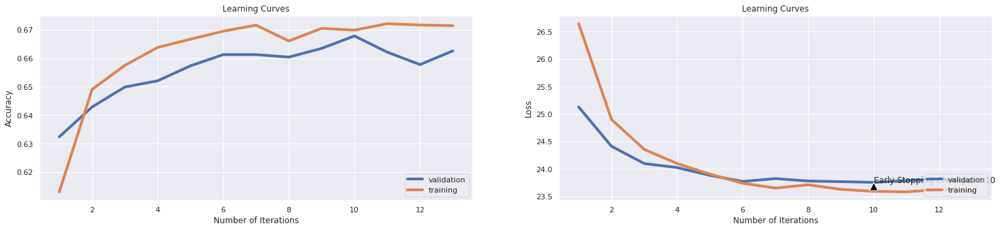

              precision    recall  f1-score
neutral        0.708696  0.765258  0.735892
antivax        0.550388  0.239865  0.334118
provax         0.624128  0.679696  0.650728
macro avg      0.627737  0.561606  0.573579
weighted avg   0.654030  0.662577  0.649406
Accuracy: 0.66258 

Total time: 13.76 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5221582373560341, 0.5949549323985979, 0.6126690035052579, 0.6233099649474211, 0.6291311967951928, 0.6310090135202804, 0.6392088132198297, 0.6438407611417125, 0.6440285428142213, 0.6504757135703555, 0.6515398097145718, 0.6519153730595894, 0.656484727090636, 0.6547320981472209, 0.6539809714571858, 0.6589258888332499, 0.66092889334001, 0.6594892338507762, 0.6629318978467702, 0.6630570856284427, 0.6650600901352028, 0.6643715573360041, 0.6624937406109164, 0.6700676014021032, 0.6695668502754131, 0.6681271907861792, 0.6691286930395594, 0.

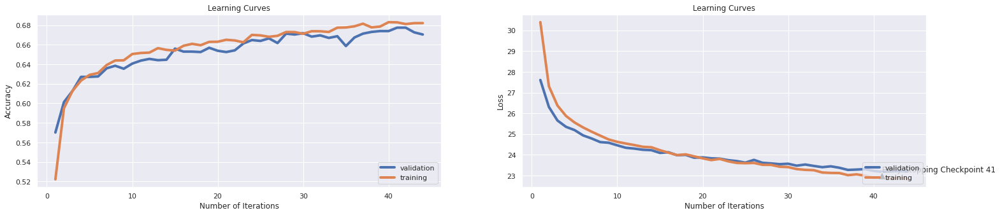

              precision    recall  f1-score
neutral        0.763944  0.720188  0.741421
antivax        0.476562  0.206081  0.287736
provax         0.610435  0.762215  0.677933
macro avg      0.616981  0.562828  0.569030
weighted avg   0.664712  0.670465  0.656950
Accuracy: 0.67046 

Total time: 53.32 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.47771657486229346, 0.5828117175763645, 0.6049699549323986, 0.6173009514271407, 0.6259389083625438, 0.6344516775162744, 0.6410240360540811, 0.6459689534301453, 0.6490360540811216, 0.6550450676014021, 0.6578617926890336, 0.6582373560340511, 0.6634952428642964, 0.6680020030045067, 0.6644341512268402, 0.6719454181271908, 0.6705057586379569, 0.6725087631447171, 0.6765147721582374, 0.6788307461191788, 0.6825863795693541, 0.6859038557836755, 0.6867801702553831, 0.6868427641462194, 0.688470205307962, 0.6921006509764647, 0.69134952428642

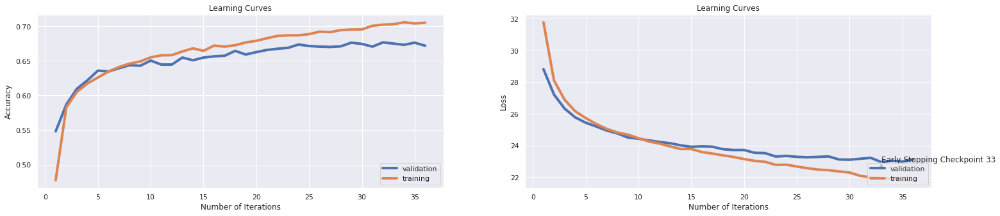

              precision    recall  f1-score
neutral        0.740602  0.739906  0.740254
antivax        0.528000  0.222973  0.313539
provax         0.621226  0.737242  0.674280
macro avg      0.629942  0.566707  0.576024
weighted avg   0.664846  0.671779  0.658278
Accuracy: 0.67178 

Total time: 37.63 seconds
Grid Search: 4, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6015898848272409, 0.6554832248372559, 0.677891837756635, 0.6903480220330496, 0.6985478217325989, 0.7043064596895343, 0.7065598397596394, 0.704243865798698, 0.710378067100651, 0.7126940410615924, 0.711880320480721, 0.709877315973961, 0.7093765648472709]
Validation accuracy scores: [0.6393514460999123, 0.6577563540753725, 0.661262050832603, 0.6822962313759859, 0.686678352322524, 0.6818580192813322, 0.6875547765118317, 0.6879929886064855, 0.6858019281332165, 0.6888694127957932, 0.6858019281332165, 0.6884312007011394, 0.69062226

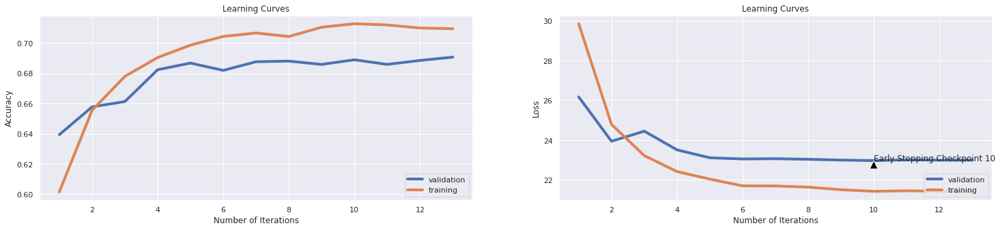

              precision    recall  f1-score
neutral        0.748846  0.761502  0.755121
antivax        0.575758  0.320946  0.412148
provax         0.647969  0.727470  0.685422
macro avg      0.657524  0.603306  0.617564
weighted avg   0.685681  0.690622  0.682504
Accuracy: 0.69062 

Total time: 16.10 seconds
Grid Search: 5, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6203054581872809, 0.6512894341512269, 0.6598022033049574, 0.6664997496244367, 0.6692538808212318, 0.6700050075112669, 0.6743865798698047, 0.6797696544817226, 0.67864296444667, 0.6819604406609915, 0.6876564847270906, 0.681835252879319, 0.6862168252378568, 0.6892839258888332, 0.6908487731597396, 0.6917876815222834, 0.6917876815222834, 0.6930395593390085, 0.6994867300951427, 0.6968577866800201, 0.6986104156234352, 0.6966700050075113, 0.7009263895843766, 0.6991111667501252, 0.702741612418628, 0.7049949924887331, 0.7034301452178268, 0.

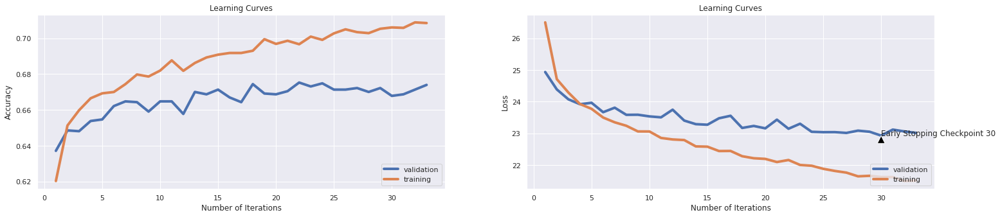

              precision    recall  f1-score
neutral        0.742537  0.747418  0.744970
antivax        0.513333  0.260135  0.345291
provax         0.627358  0.722041  0.671378
macro avg      0.627743  0.576531  0.587213
weighted avg   0.666322  0.673970  0.663426
Accuracy: 0.67397 

Total time: 40.09 seconds
Grid Search: 6, Layers: [675], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5973960941412119, 0.6440911367050576, 0.6546069103655483, 0.6585503254882323, 0.6691912869303956, 0.6678768152228343, 0.6741362043064597, 0.6792063094641962, 0.6800200300450676, 0.6841512268402604, 0.6849649474211317, 0.6886579869804708]
Validation accuracy scores: [0.6327782646801051, 0.647239263803681, 0.6463628396143734, 0.656441717791411, 0.6577563540753725, 0.663453111305872, 0.6630148992112183, 0.6621384750219106, 0.6744084136722174, 0.6665205959684487, 0.6643295354951797, 0.6673970201577564]
Training f1 scores: [0.561259

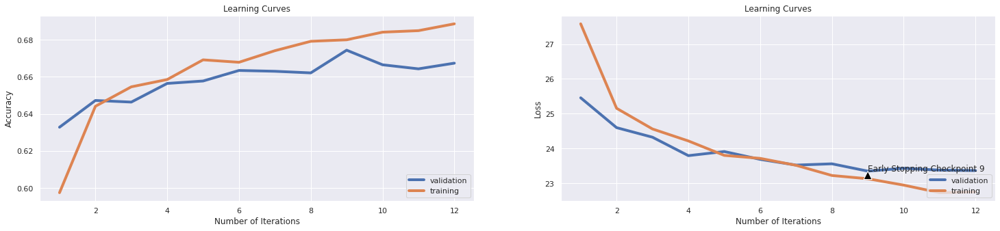

              precision    recall  f1-score
neutral        0.734331  0.737089  0.735708
antivax        0.514793  0.293919  0.374194
provax         0.623563  0.706840  0.662595
macro avg      0.624229  0.579283  0.590832
weighted avg   0.661149  0.667397  0.659308
Accuracy: 0.66740 

Total time: 15.74 seconds
Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6201802704056084, 0.6629318978467702, 0.6733850776164246, 0.6823985978968453, 0.6836504757135704, 0.6909113670505759, 0.6901602403605408, 0.693164747120681, 0.6904106159238859, 0.6953555332999499, 0.6921006509764647, 0.6933525287931898, 0.6941036554832248, 0.692914371557336, 0.6929769654481722, 0.693164747120681, 0.692914371557336, 0.6951677516274412, 0.6948547821732599, 0.6953555332999499]
Validation accuracy scores: [0.6546888694127958, 0.6647677475898335, 0.677475898334794, 0.6787905346187555, 0.6814198071866784, 0.68

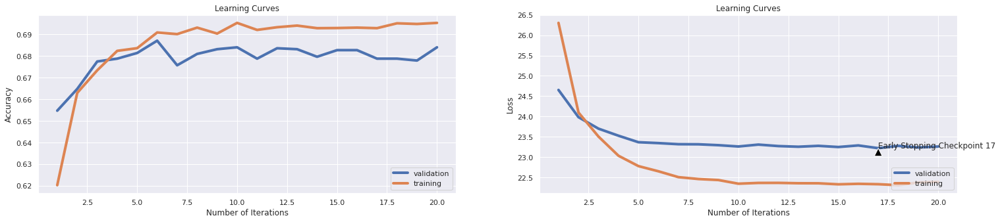

              precision    recall  f1-score
neutral        0.757835  0.749296  0.753541
antivax        0.540000  0.273649  0.363229
provax         0.632067  0.740499  0.682000
macro avg      0.643300  0.587815  0.599590
weighted avg   0.678820  0.684049  0.674040
Accuracy: 0.68405 

Total time: 23.06 seconds
Grid Search: 8, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5565222834251377, 0.610227841762644, 0.6236229344016024, 0.6285678517776665, 0.6373935903855784, 0.6388958437656485, 0.6447170756134202, 0.6481597396094141, 0.6529794692038057, 0.6534802203304958, 0.6562343515272909, 0.6595518277416125, 0.6618678017025539, 0.6653104656985478, 0.6649349023535303, 0.6627441161742614, 0.6676264396594892, 0.670255383074612, 0.6730721081622434, 0.674949924887331, 0.6778292438657987, 0.6779544316474712, 0.681334501752629, 0.6817100650976464, 0.6837130696044066, 0.6877816725087631, 0.6891587381071608

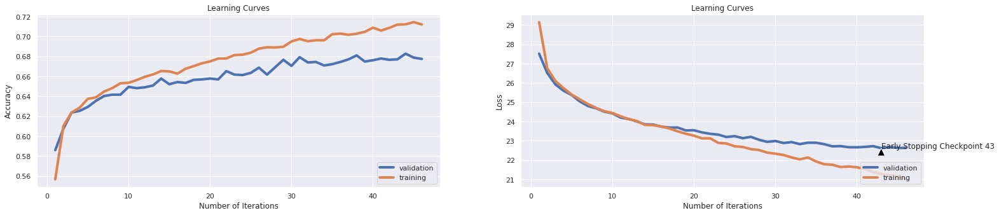

              precision    recall  f1-score
neutral        0.742750  0.745540  0.744142
antivax        0.546667  0.277027  0.367713
provax         0.630292  0.727470  0.675403
macro avg      0.639903  0.583346  0.595753
weighted avg   0.671929  0.677476  0.667573
Accuracy: 0.67748 

Total time: 52.04 seconds
Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5017526289434151, 0.5911992989484226, 0.6141086629944917, 0.6228718077115674, 0.6358913370055083, 0.645906359539309, 0.6507886830245369, 0.6564221331997997, 0.6591136705057586, 0.6703805708562844, 0.6718828242363545, 0.677891837756635, 0.6764521782674011, 0.6840260390585878, 0.6880946419629445, 0.6914121181772659, 0.692663995993991, 0.6946670005007511, 0.7002378567851778, 0.703242363545318, 0.7067476214321482, 0.7106284426639959, 0.7155107661492238, 0.7172633950926389, 0.7208312468703054, 0.721707561342013, 0.72302203304957

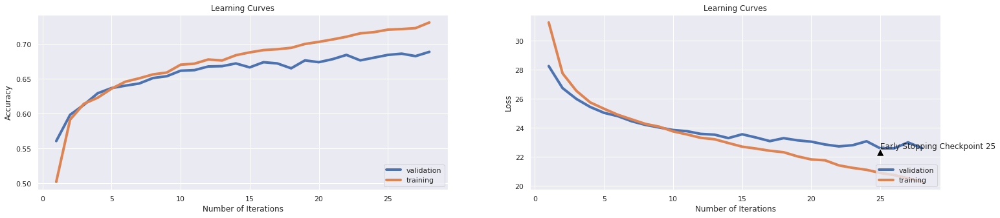

              precision    recall  f1-score
neutral        0.765152  0.758685  0.761905
antivax        0.542254  0.260135  0.351598
provax         0.633764  0.745928  0.685287
macro avg      0.647056  0.588250  0.599597
weighted avg   0.683212  0.688869  0.677761
Accuracy: 0.68887 

Total time: 34.17 seconds
Grid Search: 10, Layers: [660, 270], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6282548823234853, 0.6768277416124187, 0.6999874812218327, 0.7108162243365047, 0.7223335002503756, 0.7227090635953931, 0.7252128192288433, 0.7292814221331998, 0.7313470205307961]
Validation accuracy scores: [0.6638913234005258, 0.6687116564417178, 0.6761612620508326, 0.6761612620508326, 0.6752848378615249, 0.6748466257668712, 0.6765994741454864, 0.6748466257668712, 0.6748466257668712]
Training f1 scores: [0.6030751823517052, 0.6625225888626314, 0.6881111003635884, 0.7004346040489339, 0.7132958348916018, 0.71295750860635

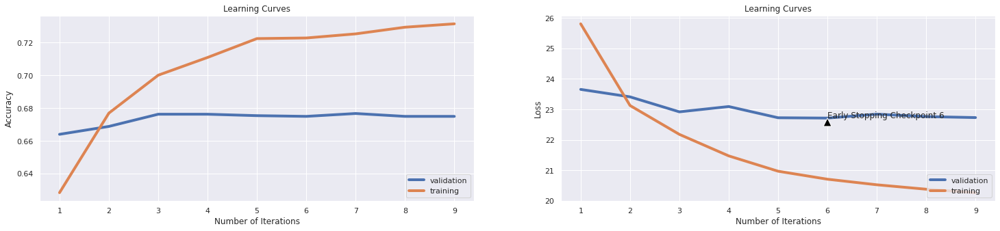

              precision    recall  f1-score
neutral        0.746212  0.739906  0.743046
antivax        0.542857  0.320946  0.403397
provax         0.625119  0.713355  0.666329
macro avg      0.638063  0.591402  0.604257
weighted avg   0.670962  0.674847  0.668027
Accuracy: 0.67485 

Total time: 17.39 seconds
Grid Search: 11, Layers: [660, 270], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5759263895843766, 0.6283800701051577, 0.6463445167751627, 0.6546695042563846, 0.6619303955933901, 0.6658112168252378, 0.6719454181271908, 0.6735728592889334, 0.6782674011016525, 0.6850901352028042, 0.684526790185278, 0.6934777165748623, 0.6934777165748623, 0.6977341011517276, 0.6981096644967452, 0.7034301452178268, 0.7054331497245869, 0.7082498748122183, 0.7121306960440661, 0.7151977966950426, 0.7167626439659489, 0.7136329494241362, 0.7218327491236856, 0.7259013520280421, 0.7267776664997496, 0.7284051076614922]
Validation ac

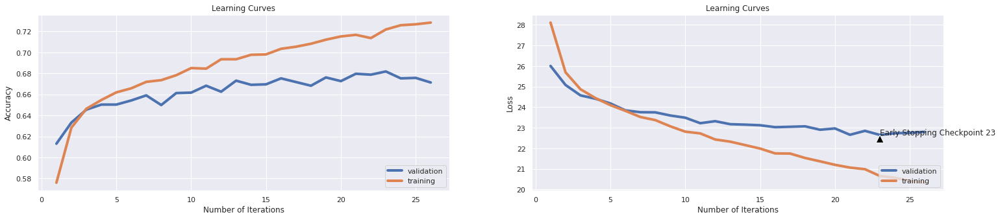

              precision    recall  f1-score
neutral        0.748532  0.718310  0.733110
antivax        0.486339  0.300676  0.371608
provax         0.629526  0.736156  0.678679
macro avg      0.621466  0.585047  0.594465
weighted avg   0.666493  0.671341  0.664251
Accuracy: 0.67134 

Total time: 49.39 seconds
Grid Search: 12, Layers: [660, 270], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5808087130696044, 0.629444166249374, 0.644904857285929, 0.6521031547320981, 0.6578617926890336, 0.6634952428642964, 0.677391086629945, 0.6790185277916875, 0.6840886329494241, 0.6922258387581373, 0.6937906860290436, 0.6991111667501252, 0.7058713069604406, 0.7059964947421131]
Validation accuracy scores: [0.6165644171779141, 0.6415425065731815, 0.6498685363716039, 0.6560035056967572, 0.654250657318142, 0.6546888694127958, 0.6599474145486416, 0.6647677475898335, 0.670464504820333, 0.6739702015775635, 0.6739702015775635, 0.672

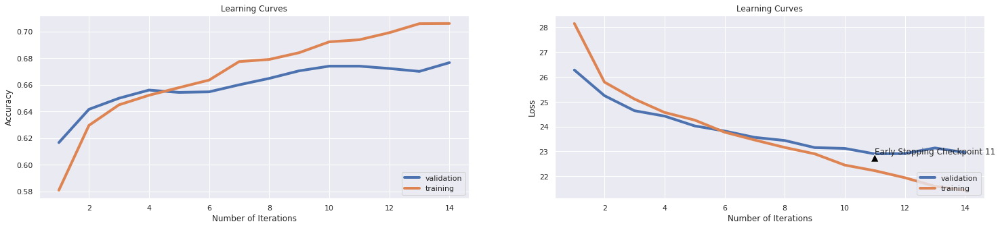

              precision    recall  f1-score
neutral        0.782471  0.695775  0.736581
antivax        0.530864  0.290541  0.375546
provax         0.611253  0.778502  0.684814
macro avg      0.641529  0.588272  0.598980
weighted avg   0.680733  0.676599  0.668858
Accuracy: 0.67660 

Total time: 29.33 seconds
Grid Search: 13, Layers: [230, 120, 50], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6113545317976965, 0.6563595393089634, 0.6743239859789685, 0.6848397596394592, 0.685778668002003, 0.693415122684026, 0.6938532799198798, 0.6953555332999499, 0.6964822233350025, 0.693164747120681]
Validation accuracy scores: [0.6275197195442594, 0.6520595968448729, 0.6503067484662577, 0.6638913234005258, 0.6551270815074496, 0.6590709903593339, 0.6660823838737949, 0.6603856266432954, 0.6621384750219106, 0.6621384750219106]
Training f1 scores: [0.5747214307960934, 0.6338358095743556, 0.6579060282380195, 0.6698875890684

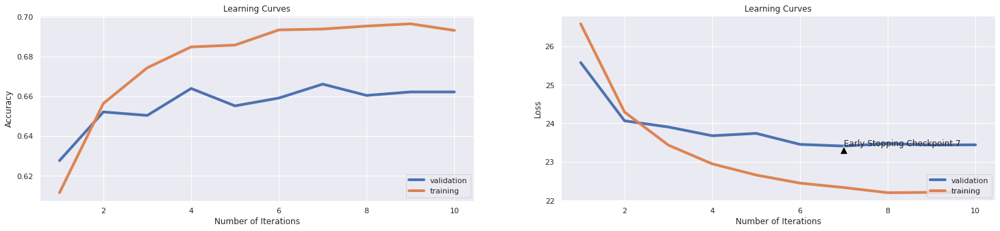

              precision    recall  f1-score
neutral        0.733146  0.735211  0.734177
antivax        0.497076  0.287162  0.364026
provax         0.616491  0.698154  0.654786
macro avg      0.615571  0.573509  0.584330
weighted avg   0.655444  0.662138  0.654123
Accuracy: 0.66214 

Total time: 12.70 seconds
Grid Search: 14, Layers: [230, 120, 50], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5399349023535303, 0.5945793690535803, 0.6145468202303456, 0.6233099649474211, 0.6369554331497246, 0.6412744116174262, 0.6478467701552328, 0.6529168753129695, 0.6549824737105658, 0.6609914872308462, 0.6654356534802204, 0.6688783174762143, 0.6729469203805708, 0.6713194792188283, 0.67864296444667, 0.6775788683024537, 0.6805207811717576, 0.6841512268402604, 0.685528292438658, 0.6859038557836755, 0.6862794191286931, 0.6887205808713069, 0.6923510265398097, 0.6962318477716575, 0.6975463194792189, 0.700550826239359, 0.7015523284

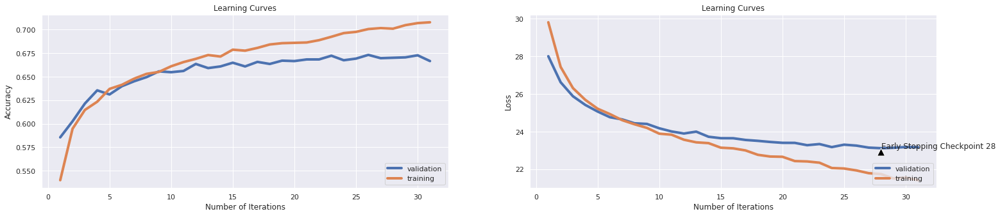

              precision    recall  f1-score
neutral        0.763654  0.722066  0.742278
antivax        0.470588  0.297297  0.364389
provax         0.610294  0.720955  0.661025
macro avg      0.614846  0.580106  0.589231
weighted avg   0.663745  0.666521  0.660469
Accuracy: 0.66652 

Total time: 38.44 seconds
Grid Search: 15, Layers: [230, 120, 50], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5279168753129695, 0.5960816224336505, 0.6138582874311467, 0.6246244366549825, 0.640272909364046, 0.6450926389584376, 0.6531672508763144, 0.6532298447671507, 0.665122684026039, 0.6693790686029043, 0.6743865798698047, 0.6769529293940911, 0.6826489734601903, 0.6853405107661492, 0.6949173760640961, 0.6972959439158738, 0.7006760140210315, 0.7056835252879319, 0.7108162243365047, 0.7167000500751126, 0.7164496745117677]
Validation accuracy scores: [0.5595968448729185, 0.5797546012269938, 0.6029798422436459, 0.6178790534618755

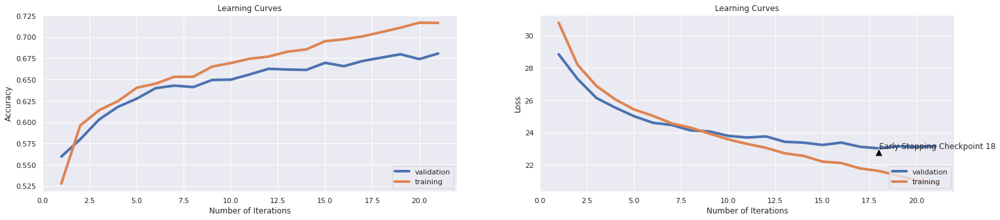

              precision    recall  f1-score
neutral        0.776089  0.719249  0.746589
antivax        0.497674  0.361486  0.418787
provax         0.629630  0.738328  0.679660
macro avg      0.634464  0.606354  0.615012
weighted avg   0.680866  0.680543  0.677057
Accuracy: 0.68054 

Total time: 27.71 seconds
Grid Search: 16, Layers: [690, 360, 150], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6293189784677016, 0.6764521782674011, 0.695605908863295, 0.7087506259389084, 0.7192038057085628, 0.723647971957937, 0.7294692038057086, 0.7315348022033049, 0.7347896845267902, 0.7372308462694042, 0.7366049073610416, 0.7363545317976965, 0.7374812218327491]
Validation accuracy scores: [0.6638913234005258, 0.6625766871165644, 0.6700262927256793, 0.6836108676599474, 0.6801051709027169, 0.6765994741454864, 0.677475898334794, 0.6744084136722174, 0.6805433829973707, 0.6805433829973707, 0.6801051709027169, 0.6831726555652

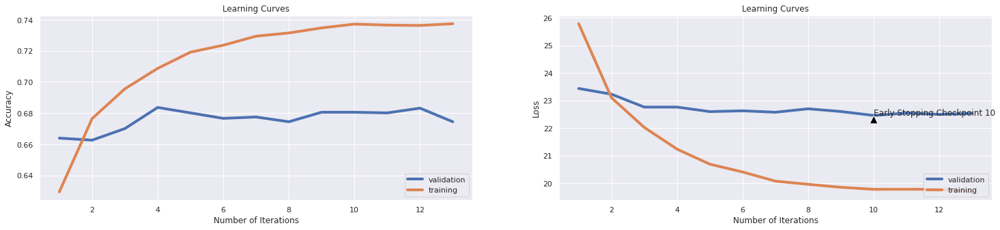

              precision    recall  f1-score
neutral        0.748571  0.738028  0.743262
antivax        0.556452  0.233108  0.328571
provax         0.617329  0.742671  0.674224
macro avg      0.640784  0.571269  0.582019
weighted avg   0.670683  0.674408  0.661609
Accuracy: 0.67441 

Total time: 32.89 seconds
Grid Search: 17, Layers: [690, 360, 150], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5818102153229845, 0.6337631447170756, 0.6509764646970456, 0.6626189283925888, 0.6645593390085127, 0.6689409113670506, 0.6778292438657987, 0.6821482223335003, 0.6872183274912369, 0.6875938908362543, 0.6913495242864296, 0.7030545818728092, 0.700300450676014, 0.7043064596895343, 0.710378067100651, 0.7126940410615924, 0.7156985478217326, 0.7198297446169254, 0.7197671507260891, 0.7278417626439659, 0.7313470205307961, 0.7310966449674512, 0.7403605408112168, 0.7467451176765147, 0.7442413620430646, 0.7479969954932398, 0.7511892

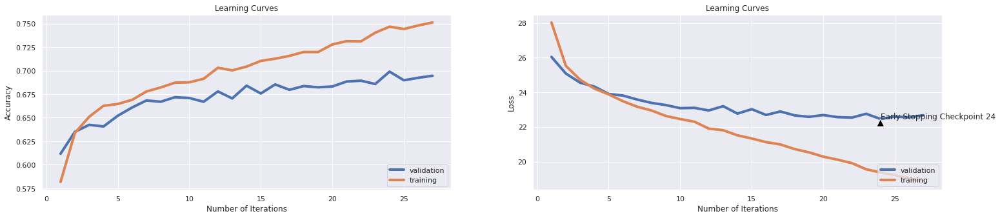

              precision    recall  f1-score
neutral        0.736075  0.806573  0.769713
antivax        0.520231  0.304054  0.383795
provax         0.675159  0.690554  0.682770
macro avg      0.643822  0.600394  0.612093
weighted avg   0.683493  0.694566  0.684566
Accuracy: 0.69457 

Total time: 63.39 seconds
Grid Search: 18, Layers: [690, 360, 150], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5524536805207811, 0.6187406109163746, 0.6402103154732098, 0.6559839759639459, 0.6628693039559339, 0.6703179769654481, 0.6832749123685529, 0.6879694541812719, 0.6925388082123185, 0.7009263895843766, 0.7088758137205808, 0.7171382073109664, 0.7229594391587381]
Validation accuracy scores: [0.5985977212971078, 0.6349693251533742, 0.6454864154250657, 0.6481156879929886, 0.6625766871165644, 0.6643295354951797, 0.6669588080631026, 0.6630148992112183, 0.6669588080631026, 0.6717791411042945, 0.6752848378615249, 0.6695880806310

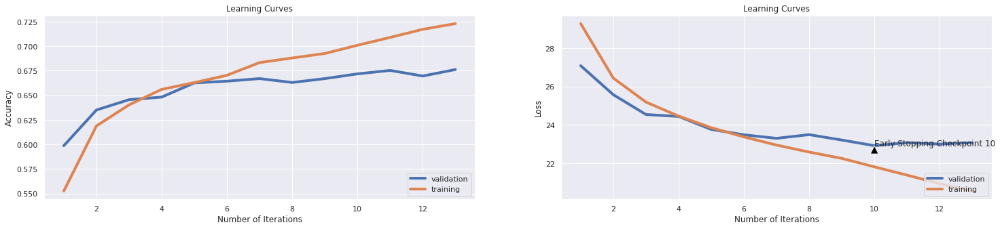

              precision    recall  f1-score
neutral        0.764067  0.726761  0.744947
antivax        0.502370  0.358108  0.418146
provax         0.626654  0.719870  0.670035
macro avg      0.631030  0.601579  0.611043
weighted avg   0.674663  0.676161  0.672324
Accuracy: 0.67616 

Total time: 34.80 seconds
Best grid is: Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential


In [ ]:
param_grid = {
  'neurons': [[75], [675], [220, 90], [660, 270], [230, 120, 50], [690, 360, 150]],
  'activation_functions': ['ReLU'],
  'optimizers': ['SGD'],
  'loss_functions': ['CrossEntropy'],
  'learning_rates': [{'val': 1e-3, 'schelduler' : 'Exponential'}, {'val': 1e-4, 'schelduler' : None}, {'val' : 5e-7, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 100,
  'early_stopping_patience': 3,
  'input_normalization' : True,
  'L2_reg': 1e-4,
  'accuracy_threshold': 0.68
}

customGridSearch(param_grid, glove_training_set, glove_validation_set)

### **Activation function evaluation: ReLU vs SELU**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6112919379068603, 0.6488482724086129, 0.6562343515272909, 0.6667501251877817, 0.6660615923885829, 0.6687531296945418, 0.6669379068602904, 0.6676890335503255, 0.6713194792188283, 0.6673760640961443, 0.6701927891837757, 0.6692538808212318, 0.6698798197295944, 0.6691912869303956]
Validation accuracy scores: [0.6437335670464505, 0.6481156879929886, 0.6581945661700263, 0.6507449605609115, 0.6595092024539877, 0.6595092024539877, 0.6546888694127958, 0.656441717791411, 0.6546888694127958, 0.661262050832603, 0.6560035056967572, 0.656441717791411, 0.6599474145486416, 0.6599474145486416]
Training f1 scores: [0.5807566849454889, 0.6263472135221365, 0.635666883724709, 0.6468162804612191, 0.6474721974354746, 0.6504877416716005, 0.6495242684018542, 0.6507867020049636, 0.6538576668922069, 0.6497205064686599, 0.6532859282950704, 0.652526853731679

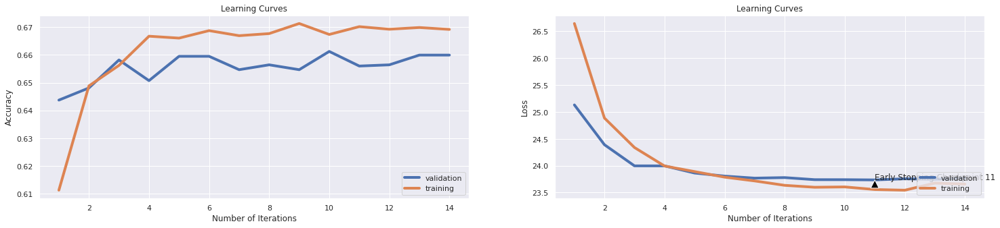

              precision    recall  f1-score
neutral        0.719283  0.753052  0.735780
antivax        0.511450  0.226351  0.313817
provax         0.614865  0.691640  0.650996
macro avg      0.615199  0.557014  0.566865
weighted avg   0.650182  0.659947  0.646829
Accuracy: 0.65995 

Total time: 14.77 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5488858287431146, 0.6089133700550826, 0.6233725588382574, 0.6304456685027542, 0.6349524286429644, 0.6376439659489234, 0.644904857285929, 0.6465948923385078, 0.650350525788683, 0.6494742113169755, 0.650851276915373, 0.6554832248372559, 0.6567976965448172, 0.661179268903355, 0.6634326489734602, 0.6646845267901853, 0.6633700550826239, 0.6662493740610916, 0.6643089634451678, 0.6698172258387581, 0.6692538808212318, 0.6701927891837757, 0.6678768152228343, 0.6728217325988983, 0.670756134201302, 0.6747621432148222, 0.6753254882323485, 0.67

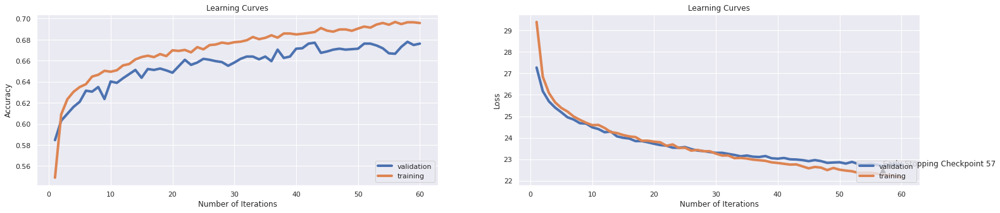

              precision    recall  f1-score
neutral        0.763600  0.724883  0.743738
antivax        0.532847  0.246622  0.337182
provax         0.615520  0.757872  0.679319
macro avg      0.637322  0.576459  0.586746
weighted avg   0.673905  0.676161  0.665004
Accuracy: 0.67616 

Total time: 60.02 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.47809213820731095, 0.5816224336504757, 0.6106034051076615, 0.6221206810215323, 0.6310090135202804, 0.6375813720580872, 0.6400851276915374, 0.6475338007010516, 0.650350525788683, 0.6559839759639459, 0.6589258888332499, 0.6659989984977466, 0.6640585878818227, 0.6647471206810215, 0.6703179769654481, 0.6713194792188283, 0.6741987981972959, 0.67864296444667, 0.6796444667000501, 0.6773284927391087, 0.684526790185278, 0.6876564847270906, 0.6857160741111668, 0.6905983975963946, 0.6914121181772659, 0.6937906860290436, 0.6922258387581373,

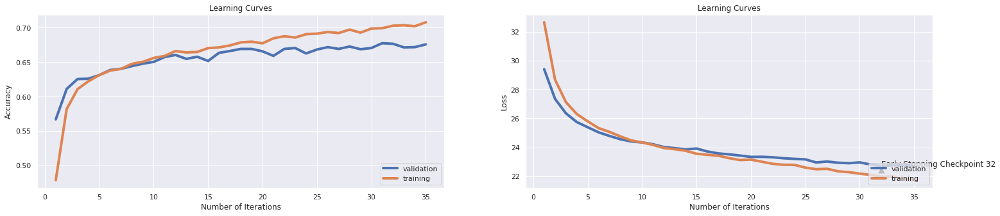

              precision    recall  f1-score
neutral        0.765641  0.723944  0.744208
antivax        0.511364  0.304054  0.381356
provax         0.619654  0.739414  0.674257
macro avg      0.632219  0.589137  0.599941
weighted avg   0.673739  0.675723  0.668911
Accuracy: 0.67572 

Total time: 36.98 seconds
Grid Search: 4, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6273785678517777, 0.6475963945918878, 0.6531046569854783, 0.6577366049073611, 0.6531046569854783, 0.6554206309464197, 0.6589258888332499, 0.660678517776665, 0.6592388582874311, 0.6612418627941913, 0.656484727090636, 0.6602403605408113, 0.6607411116675013, 0.6580495743615423, 0.6566099148723085, 0.6616800200300451, 0.6574236354531797, 0.6594266399599399, 0.6551076614922383, 0.6553580370555834, 0.6614922383575363, 0.6588632949424136, 0.6616174261392088]
Validation accuracy scores: [0.6498685363716039, 0.6489921121822962, 0.6481

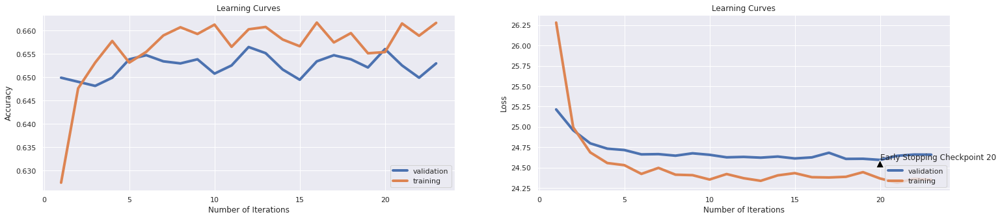

              precision    recall  f1-score
neutral        0.713891  0.728638  0.721190
antivax        0.540816  0.179054  0.269036
provax         0.602552  0.717698  0.655104
macro avg      0.619087  0.541797  0.548443
weighted avg   0.646506  0.652936  0.635869
Accuracy: 0.65294 

Total time: 23.53 seconds
Grid Search: 5, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5392463695543315, 0.6251877816725088, 0.6382073109664497, 0.6409614421632449, 0.6415247871807711, 0.646407110665999, 0.6465322984476715, 0.6486604907361042, 0.6521657486229344, 0.650851276915373, 0.6547946920380571, 0.6510390585878818, 0.6496619929894842, 0.653793189784677, 0.6509764646970456, 0.6534176264396595, 0.6545443164747121, 0.6516649974962444, 0.6553580370555834, 0.6541061592388583, 0.6555458187280921, 0.6555458187280921, 0.6580495743615423, 0.6577366049073611, 0.6577366049073611, 0.6568602904356535, 0.660177766649975, 0.6

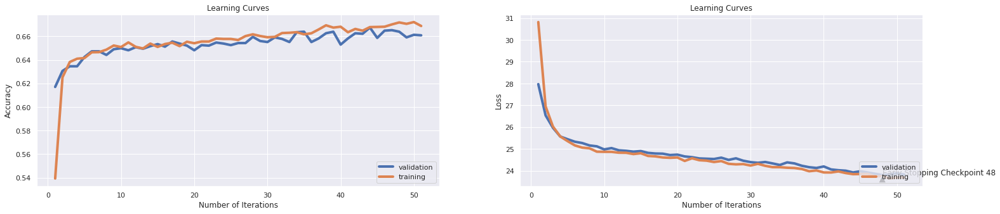

              precision    recall  f1-score
neutral        0.703325  0.774648  0.737265
antivax        0.528302  0.189189  0.278607
provax         0.625125  0.680782  0.651767
macro avg      0.618917  0.548206  0.555880
weighted avg   0.649061  0.660824  0.643266
Accuracy: 0.66082 

Total time: 51.11 seconds
Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4956184276414622, 0.6121056584877316, 0.6301952929394091, 0.6365172759138709, 0.6422759138708062, 0.6454682023034551, 0.6452804206309464, 0.6502253380070105, 0.6532298447671507, 0.6510390585878818, 0.654043565348022, 0.653793189784677, 0.6494116174261392, 0.6553580370555834, 0.6566099148723085, 0.6552328492739109, 0.653793189784677, 0.6556084126189284, 0.6602403605408113, 0.6614922383575363, 0.6598647971957937, 0.660678517776665, 0.6630570856284427, 0.6655608412618929, 0.6670630946419629]
Validation accuracy scores: [0.577563540

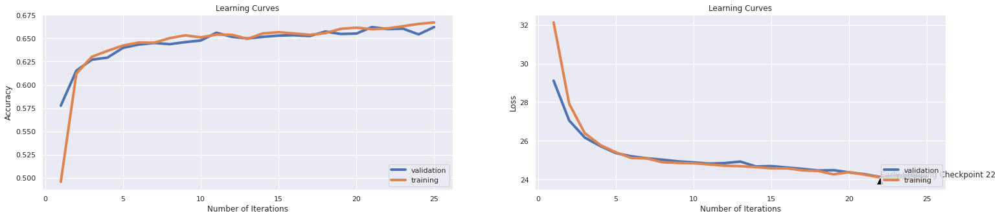

              precision    recall  f1-score
neutral        0.744947  0.726761  0.735741
antivax        0.551282  0.145270  0.229947
provax         0.595708  0.753529  0.665388
macro avg      0.630646  0.541853  0.543692
weighted avg   0.659595  0.662138  0.641740
Accuracy: 0.66214 

Total time: 26.55 seconds
Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6147346019028542, 0.6604907361041562, 0.6710691036554832, 0.6844641962944417, 0.6904106159238859, 0.6883450175262894, 0.6909739609414122, 0.6937280921382073, 0.6962318477716575, 0.6975463194792189, 0.6954807210816224, 0.6951051577366049, 0.6959814722083125, 0.6931021532298448, 0.696106659989985]
Validation accuracy scores: [0.6524978089395267, 0.6625766871165644, 0.6726555652936022, 0.6752848378615249, 0.6700262927256793, 0.677475898334794, 0.6739702015775635, 0.6726555652936022, 0.6722173531989483, 0.679666958808063, 0.

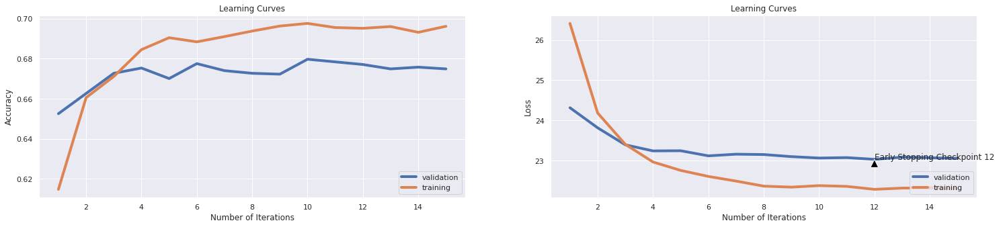

              precision    recall  f1-score
neutral        0.742115  0.751174  0.746617
antivax        0.531469  0.256757  0.346241
provax         0.625825  0.720955  0.670030
macro avg      0.633136  0.576295  0.587630
weighted avg   0.667858  0.674847  0.663774
Accuracy: 0.67485 

Total time: 17.58 seconds
Grid Search: 8, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.532235853780671, 0.6034677015523285, 0.6171131697546319, 0.632636454682023, 0.639271407110666, 0.6447796695042564, 0.6515398097145718, 0.653292438657987, 0.6571732598898348, 0.6603029544316474, 0.6651852779168753, 0.6682523785678518, 0.6693790686029043, 0.6704431647471207, 0.671256885327992, 0.6726339509263896, 0.6782048072108162, 0.6791437155733601, 0.6790185277916875, 0.6807711567351027, 0.6807711567351027, 0.6842138207310966, 0.6834626940410616, 0.6902854281422133, 0.6879068602904357, 0.6906609914872308, 0.6902854281422133,

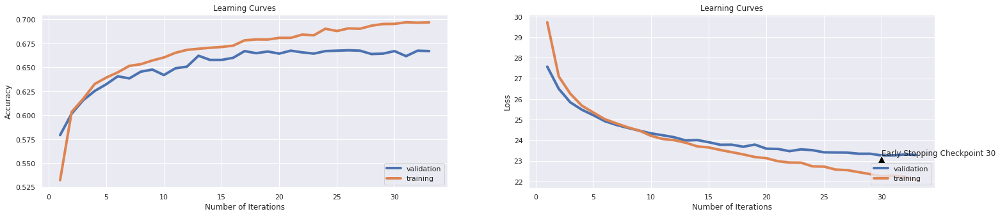

              precision    recall  f1-score
neutral        0.758383  0.722066  0.739779
antivax        0.485714  0.229730  0.311927
provax         0.607270  0.743757  0.668619
macro avg      0.617122  0.565184  0.573441
weighted avg   0.662026  0.666959  0.655562
Accuracy: 0.66696 

Total time: 38.19 seconds
Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5035052578868302, 0.589822233350025, 0.6133575363044567, 0.6298823234852279, 0.6408988482724086, 0.6500375563345018, 0.6570480721081623, 0.6638082123184778, 0.6654982473710566, 0.6725087631447171, 0.6765773660490736, 0.6797696544817226, 0.6831497245868803, 0.6868427641462194, 0.6891587381071608, 0.6907235853780671, 0.6977966950425638, 0.700050075112669, 0.7007386079118678, 0.7028042063094642, 0.7065598397596394, 0.7136955433149724, 0.7154481722583875, 0.7135077616424637, 0.7200175262894342, 0.7213945918878317, 0.72602653980

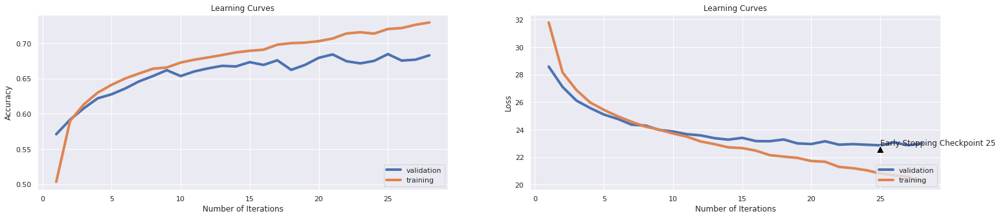

              precision    recall  f1-score
neutral        0.770363  0.737089  0.753359
antivax        0.511211  0.385135  0.439306
provax         0.633654  0.715527  0.672106
macro avg      0.638409  0.612584  0.621590
weighted avg   0.681573  0.682734  0.679830
Accuracy: 0.68273 

Total time: 33.86 seconds
Grid Search: 10, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6261892839258888, 0.646907861792689, 0.6541061592388583, 0.6547946920380571, 0.6619303955933901, 0.6614922383575363, 0.6650600901352028, 0.6638082123184778, 0.6653730595893841, 0.6623685528292439, 0.6590510766149223, 0.6620555833750625]
Validation accuracy scores: [0.6415425065731815, 0.6503067484662577, 0.6581945661700263, 0.6586327782646801, 0.6586327782646801, 0.6581945661700263, 0.6647677475898335, 0.6625766871165644, 0.6617002629272568, 0.6625766871165644, 0.663453111305872, 0.6581945661700263]
Training f1 scores: 

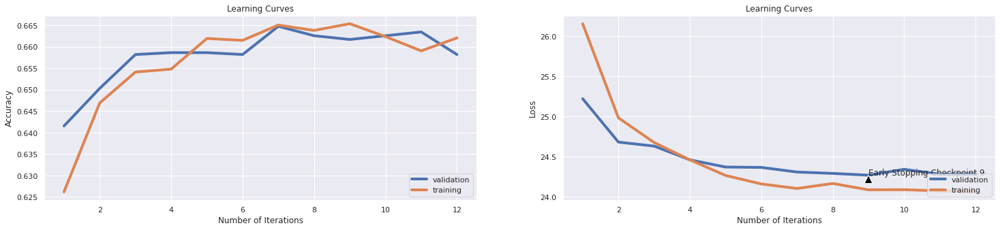

              precision    recall  f1-score
neutral        0.697225  0.778404  0.735581
antivax        0.585106  0.185811  0.282051
provax         0.618619  0.671010  0.643750
macro avg      0.633650  0.545075  0.553794
weighted avg   0.650957  0.658195  0.639691
Accuracy: 0.65819 

Total time: 14.37 seconds
Grid Search: 11, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5908863294942414, 0.6352653980971458, 0.6419629444166249, 0.6475963945918878, 0.6504131196795193, 0.6516649974962444, 0.6533550325488232, 0.6536680020030045, 0.6529794692038057, 0.6555458187280921, 0.6549824737105658, 0.6581747621432148, 0.6600525788683025, 0.6576740110165248, 0.6598022033049574, 0.6593014521782674, 0.6608662994491737, 0.6582373560340511, 0.6629318978467702, 0.6655608412618929, 0.6592388582874311, 0.6648723084626941, 0.6668127190786179, 0.667313470205308, 0.6680020030045067, 0.6691912869303956, 0.665936404606

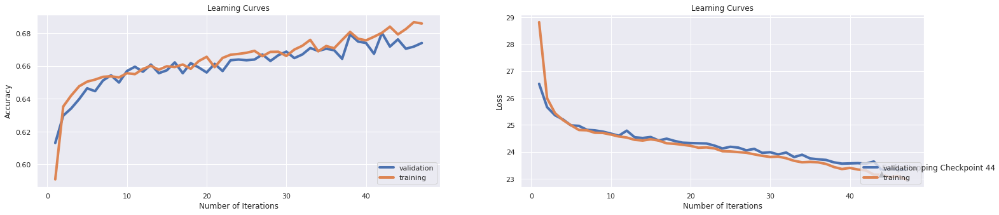

              precision    recall  f1-score
neutral        0.731317  0.771831  0.751028
antivax        0.540741  0.246622  0.338747
provax         0.628543  0.698154  0.661523
macro avg      0.633534  0.572202  0.583766
weighted avg   0.665118  0.673970  0.661427
Accuracy: 0.67397 

Total time: 54.69 seconds
Grid Search: 12, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5185903855783676, 0.614672008012018, 0.6340761141712569, 0.6463445167751627, 0.6526664997496244, 0.6509138708062093, 0.6556084126189284, 0.6509764646970456, 0.654043565348022, 0.6548572859288934, 0.6558587881822734, 0.6618678017025539, 0.6586129193790686, 0.6609914872308462, 0.6606159238858288, 0.6643715573360041, 0.6653730595893841, 0.6682523785678518, 0.6710065097646469, 0.6730721081622434, 0.6728217325988983, 0.6767025538307461, 0.6783299949924887, 0.6806459689534301, 0.6824611917876815, 0.6825863795693541, 0.6906609914

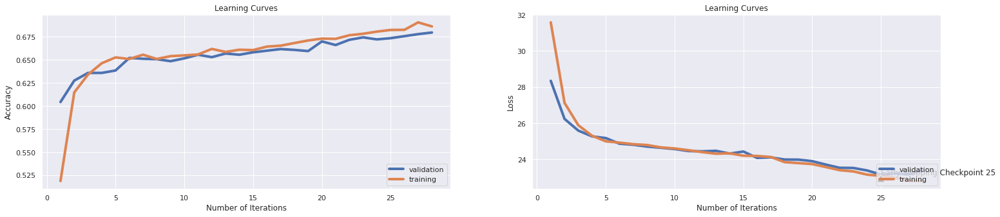

              precision    recall  f1-score
neutral        0.800000  0.683568  0.737215
antivax        0.540373  0.293919  0.380744
provax         0.607762  0.799131  0.690432
macro avg      0.649378  0.592206  0.602797
weighted avg   0.688738  0.679667  0.672095
Accuracy: 0.67967 

Total time: 34.49 seconds
Best grid is: Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['ReLU', 'SELU'],
  'optimizers': ['SGD'],
  'loss_functions': ['CrossEntropy'],
  'learning_rates': [{'val': 1e-3, 'schelduler' : 'Exponential'}, {'val': 1e-4, 'schelduler' : None}, {'val' : 5e-7, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 100,
  'early_stopping_patience': 3,
  'input_normalization' : True,
  'L2_reg': 1e-4,
  'accuracy_threshold': 0.68
}

customGridSearch(param_grid, glove_training_set, glove_validation_set)

### **Optimizer evaluation : Stohastic Gradient Decent vs Nesterov Stohastic Gradient Decent vs Adadelta vs Adam (2 SGDs vs 2 Adaptives)**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6236855282924386, 0.6492238357536304, 0.6617426139208813, 0.6646845267901853, 0.6686905358037055, 0.670255383074612, 0.675450676014021, 0.670255383074612, 0.675200300450676, 0.6750125187781673]
Validation accuracy scores: [0.6441717791411042, 0.6489921121822962, 0.6595092024539877, 0.6560035056967572, 0.6577563540753725, 0.6573181419807187, 0.6595092024539877, 0.6581945661700263, 0.6590709903593339, 0.661262050832603]
Training f1 scores: [0.5929505149860905, 0.6279115690019224, 0.6416301881297974, 0.6471106398107466, 0.6525209146936657, 0.6527575598033288, 0.6577245683767273, 0.653576821870951, 0.6567656604415513, 0.6575346739611717]
Validation f1 scores: [0.6251696111360479, 0.625687932907806, 0.6503353303156686, 0.6382296229408793, 0.642966856686617, 0.6406878296354106, 0.6423052250144123, 0.6416386277395421, 0.642316276617055,

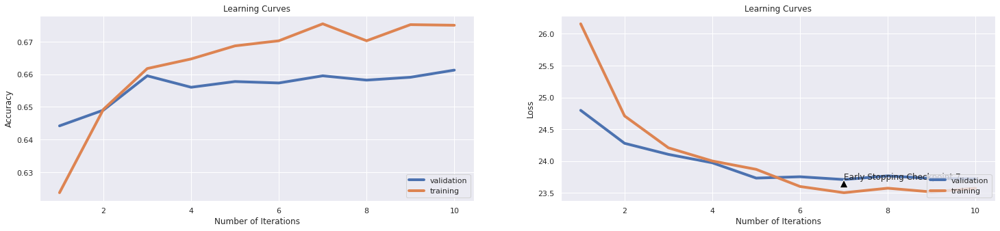

              precision    recall  f1-score
neutral        0.714032  0.754930  0.733911
antivax        0.544000  0.229730  0.323040
provax         0.617847  0.691640  0.652664
macro avg      0.625293  0.558766  0.569872
weighted avg   0.653157  0.661262  0.647826
Accuracy: 0.66126 

Total time: 10.70 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5455057586379569, 0.6082874311467201, 0.6198673009514272, 0.628192288432649, 0.6345768652979469, 0.6357661492238358, 0.6404606910365548, 0.6425262894341512, 0.6457185778668002, 0.6455933900851277, 0.6495368052078118, 0.6494116174261392, 0.6551702553830746, 0.6517901852779169, 0.6557336004006009, 0.6612418627941913, 0.6585503254882323, 0.6597396094141211, 0.6637456184276415, 0.6623059589384076, 0.6621807711567351, 0.664121181772659, 0.6686279419128693, 0.667563845768653, 0.6695042563845769, 0.6663745618427641, 0.671757636454682, 0.6

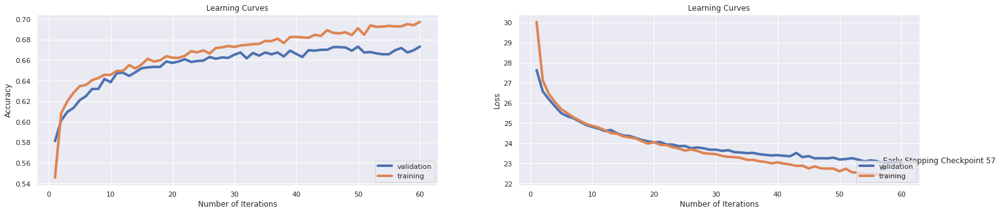

              precision    recall  f1-score
neutral        0.744142  0.745540  0.744841
antivax        0.493590  0.260135  0.340708
provax         0.627951  0.722041  0.671717
macro avg      0.621894  0.575905  0.585755
weighted avg   0.664749  0.673094  0.662908
Accuracy: 0.67309 

Total time: 60.13 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5155858788182274, 0.6022158237356035, 0.6191161742613921, 0.6263144717075614, 0.6344516775162744, 0.6399599399098648, 0.6465948923385078, 0.649849774661993, 0.6544191286930395, 0.6578617926890336, 0.6628067100650976, 0.663620430645969, 0.6668753129694541, 0.6691912869303956, 0.6649349023535303, 0.6721331997996995, 0.6728217325988983, 0.6740736104156234, 0.6790811216825238, 0.6767025538307461, 0.6822108162243365, 0.6824611917876815, 0.6855908863294943, 0.6860916374561843, 0.6867801702553831, 0.6874061091637457, 0.6899098647971958

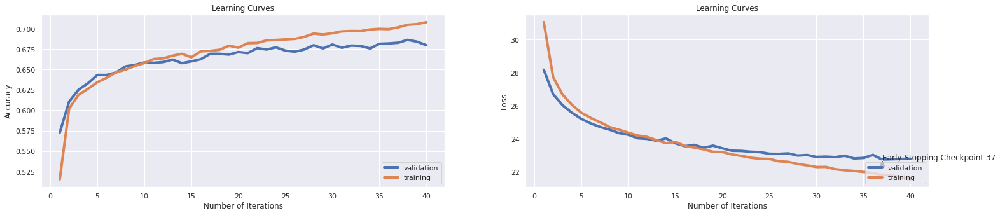

              precision    recall  f1-score
neutral        0.736196  0.788732  0.761559
antivax        0.491124  0.280405  0.356989
provax         0.646091  0.681868  0.663497
macro avg      0.624470  0.583668  0.594015
weighted avg   0.668042  0.679667  0.669505
Accuracy: 0.67967 

Total time: 49.50 seconds
Grid Search: 4, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6305082623935904, 0.6740736104156234, 0.6912869303955934, 0.7100650976464697, 0.7228968452679019, 0.7264646970455684, 0.7284677015523285, 0.736730095142714, 0.7366049073610416, 0.7377941912869304, 0.7412994491737607, 0.7415498247371056, 0.7397971957936905, 0.7408612919379068, 0.7401727591387081]
Validation accuracy scores: [0.6463628396143734, 0.6744084136722174, 0.689307624890447, 0.6888694127957932, 0.6971954425942156, 0.6976336546888694, 0.703330411919369, 0.6967572304995618, 0.6989482909728308, 0.7059596844872918, 0.

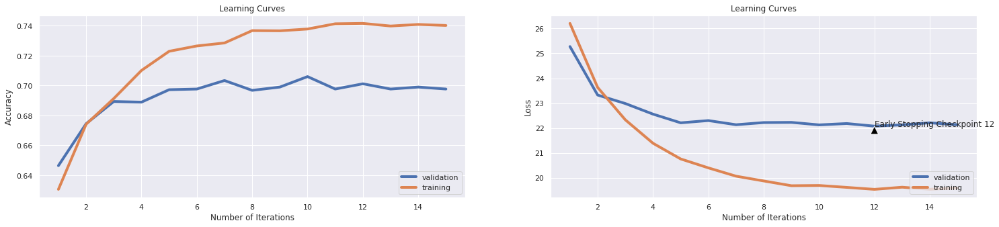

              precision    recall  f1-score
neutral        0.772771  0.756808  0.764706
antivax        0.567251  0.327703  0.415418
provax         0.645131  0.748100  0.692810
macro avg      0.661718  0.610870  0.624311
weighted avg   0.694598  0.697634  0.690383
Accuracy: 0.69763 

Total time: 16.04 seconds
Grid Search: 5, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6156109163745619, 0.6497245868803205, 0.6618678017025539, 0.6700050075112669, 0.6793314972458688, 0.6843390085127692, 0.6913495242864296, 0.6919754631947922, 0.6969829744616926, 0.6991737606409615, 0.7018027040560841, 0.7065598397596394, 0.7101902854281422, 0.71407110665999, 0.717513770655984, 0.7163870806209314, 0.7254631947921882, 0.7215823735603405, 0.7264646970455684, 0.7277165748622935, 0.7339759639459189]
Validation accuracy scores: [0.6397896581945661, 0.6586327782646801, 0.6428571428571429, 0.6643295354951797, 0.664767

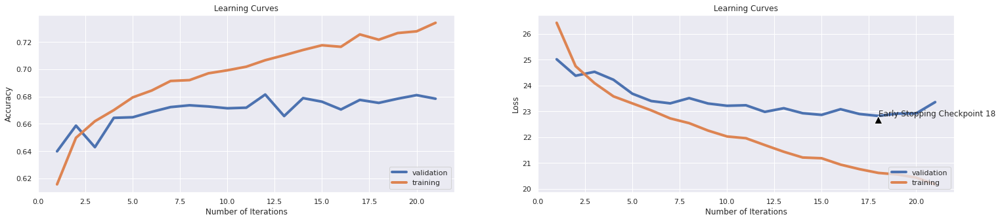

              precision    recall  f1-score
neutral        0.756705  0.741784  0.749170
antivax        0.529032  0.277027  0.363636
provax         0.624192  0.733985  0.674651
macro avg      0.636643  0.584265  0.595819
weighted avg   0.673692  0.678352  0.669087
Accuracy: 0.67835 

Total time: 22.18 seconds
Grid Search: 6, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5128317476214321, 0.5928893340010015, 0.6093515272909364, 0.6184902353530295, 0.6248122183274912, 0.6342013019529293, 0.6384576865297947, 0.6460941412118177, 0.6489108662994492, 0.6497871807711567, 0.6529794692038057, 0.6543565348022033, 0.6608662994491737, 0.6660615923885829, 0.6675012518778167, 0.6701301952929394, 0.6745117676514772, 0.6728843264897346, 0.6765773660490736, 0.6794566850275413, 0.6827115673510266, 0.6811467200801202, 0.6856534802203305, 0.6826489734601903, 0.6885327991987982, 0.6885327991987982, 0.689972458

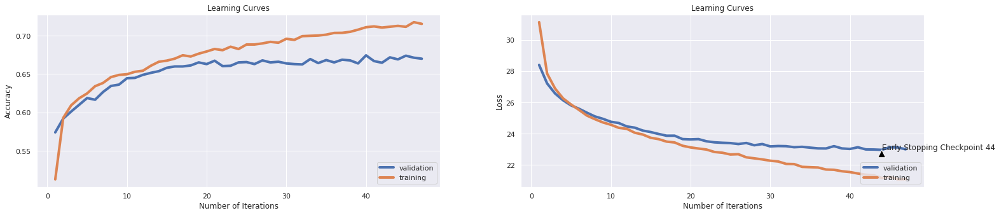

              precision    recall  f1-score
neutral        0.749046  0.737089  0.743019
antivax        0.502994  0.283784  0.362851
provax         0.618557  0.716612  0.663984
macro avg      0.623532  0.579162  0.589951
weighted avg   0.664466  0.670026  0.661809
Accuracy: 0.67003 

Total time: 49.84 seconds
Grid Search: 7, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.36204306459689534, 0.39684526790185276, 0.42469954932398596, 0.4492363545317977, 0.47227090635953933, 0.48403855783675515, 0.5018778167250876, 0.5120180270405609, 0.5276664997496244, 0.5324236354531797, 0.5441912869303956, 0.546507260891337, 0.5558963445167752, 0.5580871306960441, 0.5628442663995994, 0.5692288432648973, 0.571106659989985, 0.5749248873309964, 0.5769278918377566, 0.5771782674011017, 0.581935403104657, 0.5836254381572359, 0.5843139709564347, 0.5881947921882824, 0.588820731096645, 0.5933900851276915, 0.596770155232

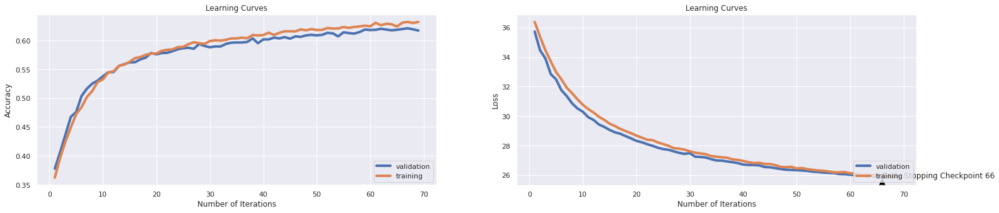

              precision    recall  f1-score
neutral        0.621505  0.814085  0.704878
antivax        0.500000  0.087838  0.149425
provax         0.616766  0.559175  0.586560
macro avg      0.579424  0.487032  0.480288
weighted avg   0.603832  0.617003  0.585078
Accuracy: 0.61700 

Total time: 75.80 seconds
Grid Search: 8, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.2921256885327992, 0.29669504256384577, 0.2977591387080621, 0.30483224837255884, 0.3082123184777166, 0.31497245868803203, 0.31891587381071607, 0.32192038057085626, 0.3259263895843766, 0.3289308963445168, 0.3333750625938908, 0.3386329494241362, 0.3442663995993991, 0.349649474211317, 0.349399098647972, 0.35822483725588383, 0.36079118678017025, 0.3631697546319479, 0.3698047070605909, 0.3718703054581873, 0.37643965948923386, 0.38050826239359037, 0.3847020530796194, 0.3885828743114672, 0.392964446670005, 0.3914621932899349, 0.399286

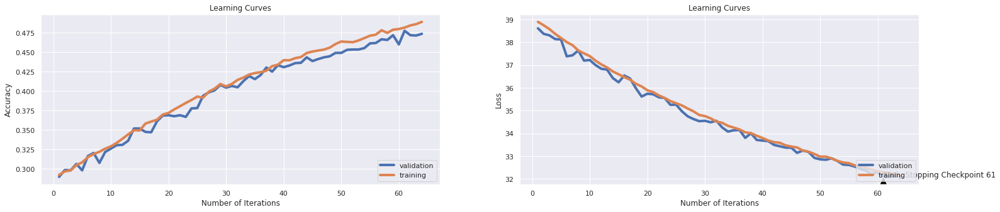

              precision    recall  f1-score
neutral        0.527592  0.592488  0.558160
antivax        0.204545  0.152027  0.174419
provax         0.467667  0.439739  0.453274
macro avg      0.399935  0.394752  0.395284
weighted avg   0.461504  0.473707  0.466053
Accuracy: 0.47371 

Total time: 70.66 seconds
Grid Search: 9, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.3624812218327491, 0.3597270906359539, 0.3642964446670005, 0.35985227841762646]
Validation accuracy scores: [0.34925503943908853, 0.35363716038562665, 0.35100788781770376, 0.35451358457493426]
Training f1 scores: [0.3672947679491027, 0.36421033504508993, 0.3684185033633508, 0.36424075676230605]
Validation f1 scores: [0.354336619355308, 0.35683616628722875, 0.35814200545184677, 0.3604577046611583]
Training losses: [35.54089712333679, 35.574562671661376, 35.57370418548584, 35.56510223197937]
Validation losses: [35.36674849192301, 

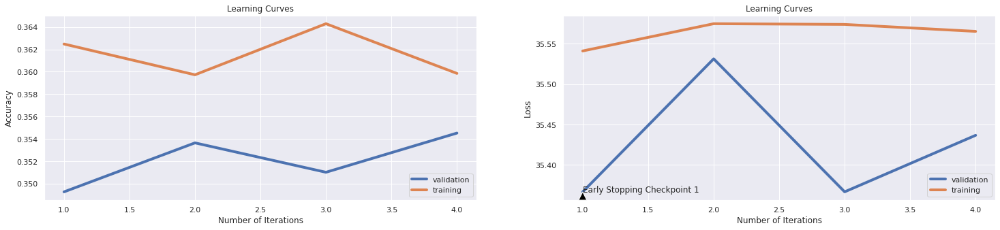

              precision    recall  f1-score
neutral        0.421811  0.384977  0.402553
antivax        0.144118  0.165541  0.154088
provax         0.360825  0.380022  0.370175
macro avg      0.308918  0.310180  0.308938
weighted avg   0.361177  0.354514  0.357257
Accuracy: 0.35451 

Total time: 5.14 seconds
Grid Search: 10, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6318853279919879, 0.6695042563845769, 0.6879068602904357, 0.697108162243365, 0.7039308963445168, 0.7119429143715573, 0.7158863294942414, 0.7250876314471708, 0.728342513770656, 0.7320981472208312, 0.7344141211817726]
Validation accuracy scores: [0.6581945661700263, 0.6682734443470639, 0.6678352322524101, 0.6735319894829097, 0.6722173531989483, 0.679666958808063, 0.6730937773882559, 0.6840490797546013, 0.684487291849255, 0.6862401402278703, 0.6875547765118317]
Training f1 scores: [0.6085806169479717, 0.6522167484139966, 0.67573773039

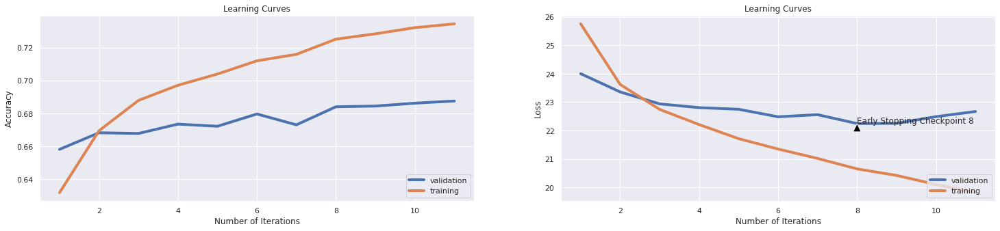

              precision    recall  f1-score
neutral        0.743705  0.776526  0.759761
antivax        0.492308  0.324324  0.391039
provax         0.662564  0.701412  0.681435
macro avg      0.632859  0.600754  0.610745
weighted avg   0.678348  0.687555  0.680322
Accuracy: 0.68755 

Total time: 12.87 seconds
Grid Search: 11, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.560528292438658, 0.6206810215322984, 0.6303830746119179, 0.6446544817225839, 0.6521657486229344, 0.6600525788683025, 0.6626815222834251, 0.6633074611917876, 0.668314972458688, 0.6686279419128693, 0.6732598898347522, 0.6743865798698047, 0.6771407110665999, 0.6812719078617927, 0.6828993490235353, 0.6841512268402604, 0.6854031046569855, 0.6856534802203305, 0.6897220831246871, 0.6893465197796695, 0.6917250876314471, 0.6947921882824236, 0.6965448172258387, 0.6982974461692539, 0.6957936905358038, 0.7033049574361542, 0.7014271407110666,

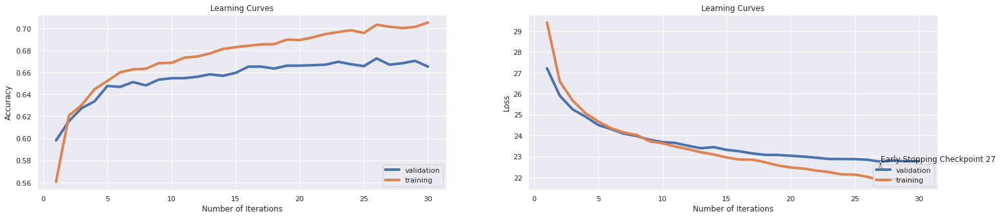

              precision    recall  f1-score
neutral        0.744947  0.726761  0.735741
antivax        0.557252  0.246622  0.341920
provax         0.603417  0.728556  0.660108
macro avg      0.635205  0.567313  0.579257
weighted avg   0.663480  0.665206  0.654134
Accuracy: 0.66521 

Total time: 33.56 seconds
Grid Search: 12, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.2476840260390586, 0.25475713570355535, 0.25682273410115175, 0.26064096144216325, 0.26671256885327993, 0.2707185778668002, 0.2715322984476715, 0.2737230846269404, 0.2808587881822734, 0.2840510766149224, 0.28780671006509767, 0.2936279419128693, 0.29688282423635454, 0.30182774161241865, 0.30151477215823735, 0.31127941912869306, 0.3126564847270906, 0.32116925388082124, 0.32680270405608414, 0.32605157736604906, 0.33112168252378565, 0.335878818227341, 0.3415122684026039, 0.34489233850776163, 0.34827240861291936, 0.3596644967451177, 0.35

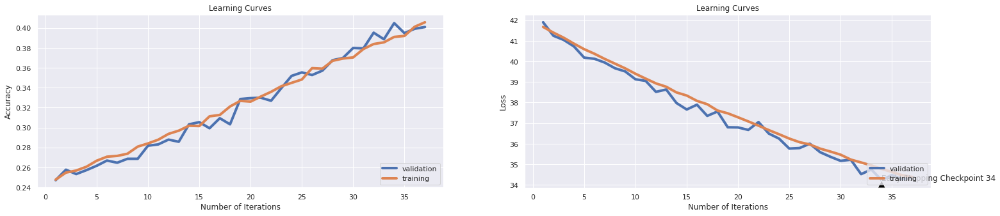

              precision    recall  f1-score
neutral        0.524146  0.417840  0.464995
antivax        0.169145  0.307432  0.218225
provax         0.423464  0.411509  0.417401
macro avg      0.372252  0.378927  0.366874
weighted avg   0.437464  0.400964  0.413778
Accuracy: 0.40096 

Total time: 41.08 seconds
Grid Search: 13, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6187406109163746, 0.6622433650475713, 0.6748873309964948, 0.6798948422633951, 0.6859664496745118, 0.6862168252378568, 0.692163244867301, 0.6943540310465699, 0.6909739609414122, 0.6912869303955934]
Validation accuracy scores: [0.6454864154250657, 0.6603856266432954, 0.6652059596844873, 0.6638913234005258, 0.6660823838737949, 0.6625766871165644, 0.6700262927256793, 0.6665205959684487, 0.6608238387379491, 0.6643295354951797]
Training f1 scores: [0.5912871204058913, 0.644630311586288, 0.6598307430089798, 0.6662775783638575,

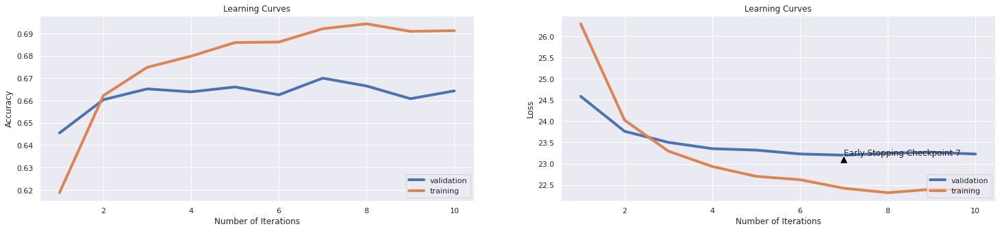

              precision    recall  f1-score
neutral        0.735654  0.734272  0.734962
antivax        0.536913  0.270270  0.359551
provax         0.611215  0.710098  0.656956
macro avg      0.627927  0.571547  0.583823
weighted avg   0.659652  0.664330  0.654785
Accuracy: 0.66433 

Total time: 12.32 seconds
Grid Search: 14, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5575863795693541, 0.6059088632949424, 0.6240610916374562, 0.6326990485728593, 0.6396469704556835, 0.6462193289934902, 0.6527916875312969, 0.656484727090636, 0.6578617926890336, 0.6623685528292439, 0.6671882824236355, 0.6668753129694541, 0.6692538808212318, 0.6745743615423134, 0.6729469203805708, 0.6745743615423134, 0.6781422133199799, 0.67864296444667, 0.6805833750625939, 0.6852153229844767, 0.6878442663995994, 0.6884076114171257, 0.6862794191286931, 0.6897846770155233, 0.6917876815222834, 0.6910365548322484, 0.69191286930395

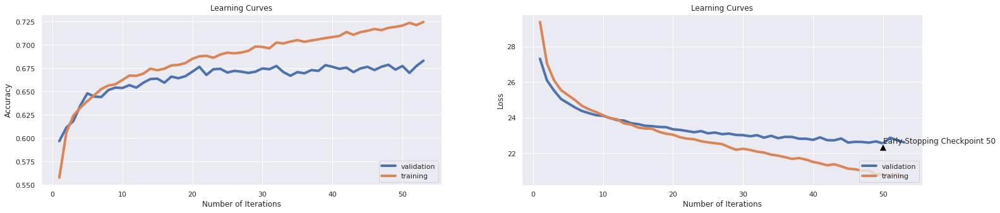

              precision    recall  f1-score
neutral        0.752841  0.746479  0.749646
antivax        0.522167  0.358108  0.424850
provax         0.643206  0.714441  0.676955
macro avg      0.639405  0.606343  0.617150
weighted avg   0.678672  0.683173  0.678179
Accuracy: 0.68317 

Total time: 60.90 seconds
Grid Search: 15, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5306084126189284, 0.6032799198798198, 0.6221832749123686, 0.632636454682023, 0.6423385077616425, 0.6444667000500751, 0.6576114171256885, 0.6586755132699048, 0.6664997496244367, 0.6676890335503255, 0.6741987981972959, 0.676201802704056, 0.684526790185278, 0.6859038557836755, 0.6886579869804708, 0.6908487731597396, 0.696106659989985, 0.7004882323485228, 0.7049949924887331, 0.7049323985978968, 0.7067476214321482, 0.7112543815723585, 0.7126940410615924, 0.7181397095643465, 0.7204556835252879, 0.724649474211317, 0.7273410115172

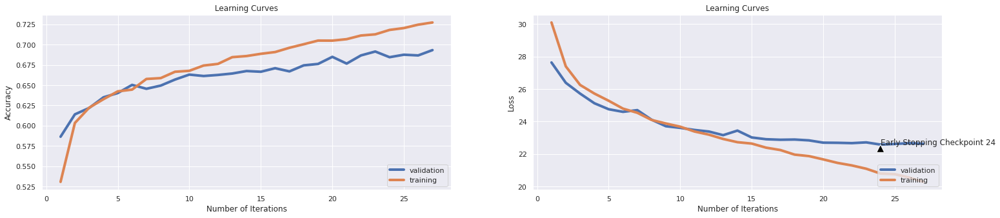

              precision    recall  f1-score
neutral        0.769009  0.750235  0.759506
antivax        0.536723  0.320946  0.401691
provax         0.645403  0.747014  0.692501
macro avg      0.650378  0.606065  0.617899
weighted avg   0.688992  0.693252  0.686051
Accuracy: 0.69325 

Total time: 33.84 seconds
Grid Search: 16, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6408988482724086, 0.6909739609414122, 0.7202053079619429, 0.7387330996494742, 0.7545693540310465, 0.76771407110666, 0.777541311967952]
Validation accuracy scores: [0.6638913234005258, 0.6871165644171779, 0.6875547765118317, 0.6906222611744084, 0.6879929886064855, 0.6954425942156004, 0.6919368974583698]
Training f1 scores: [0.6181164309112678, 0.6765449225731355, 0.7101832891637007, 0.7307954662127526, 0.7484020684650227, 0.7613699032234026, 0.7723270032862422]
Validation f1 scores: [0.649401234615298, 0.67930029974

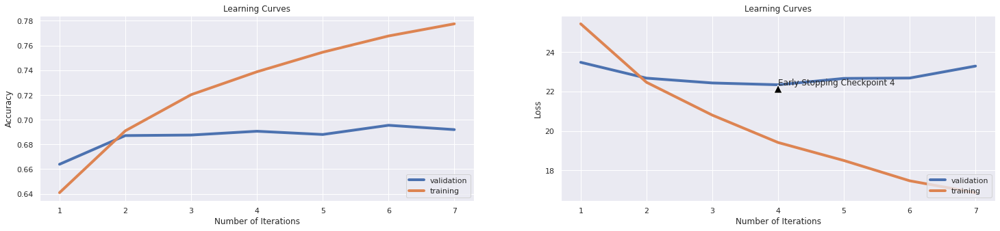

              precision    recall  f1-score
neutral        0.779543  0.737089  0.757722
antivax        0.519481  0.270270  0.355556
provax         0.636931  0.775244  0.699314
macro avg      0.645318  0.594201  0.604197
weighted avg   0.688253  0.691937  0.681984
Accuracy: 0.69194 

Total time: 9.25 seconds
Grid Search: 17, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6115423134702053, 0.6585503254882323, 0.67864296444667, 0.6870305458187281, 0.7007386079118678, 0.7058713069604406, 0.7131947921882824, 0.7229594391587381, 0.7279043565348022, 0.7342263395092639]
Validation accuracy scores: [0.6437335670464505, 0.6625766871165644, 0.6805433829973707, 0.6779141104294478, 0.6858019281332165, 0.6831726555652936, 0.6814198071866784, 0.684487291849255, 0.6901840490797546, 0.686678352322524]
Training f1 scores: [0.5776483700759043, 0.6380766921350104, 0.6632792704096298, 0.6746429706952525, 0.6

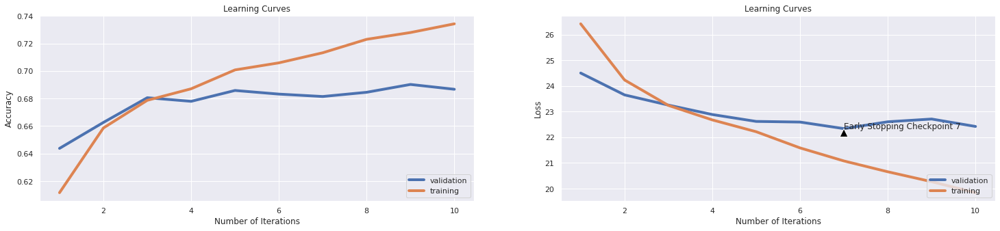

              precision    recall  f1-score
neutral        0.764306  0.739906  0.751908
antivax        0.502041  0.415541  0.454713
provax         0.652087  0.712269  0.680851
macro avg      0.639478  0.622572  0.629158
weighted avg   0.684997  0.686678  0.684681
Accuracy: 0.68668 

Total time: 12.82 seconds
Grid Search: 18, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4805958938407611, 0.5896344516775163, 0.6124812218327491, 0.6283800701051577, 0.6363294942413621, 0.6417125688532799, 0.653793189784677, 0.6559839759639459, 0.6642463695543315, 0.664121181772659, 0.6716950425638458, 0.6758262393590385, 0.682085628442664, 0.6799574361542313, 0.6852153229844767, 0.6903480220330496, 0.6902228342513771, 0.6984852278417626, 0.6987356034051077, 0.6989859789684527, 0.7061216825237857, 0.7072483725588382, 0.7100650976464697, 0.7167626439659489, 0.7192663995993991, 0.7215823735603405, 0.728780

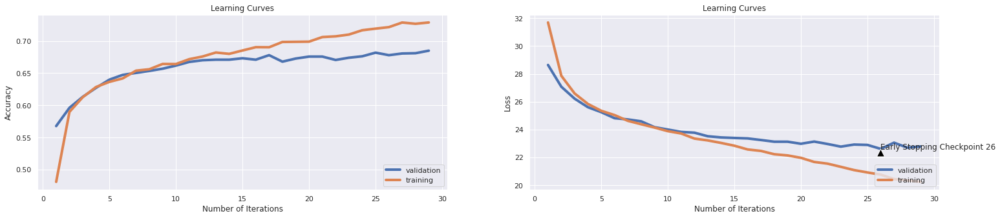

              precision    recall  f1-score
neutral        0.737734  0.776526  0.756633
antivax        0.578616  0.310811  0.404396
provax         0.642715  0.699240  0.669787
macro avg      0.653022  0.595526  0.610272
weighted avg   0.678746  0.684926  0.675894
Accuracy: 0.68493 

Total time: 36.17 seconds
Grid Search: 19, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.38025788683024536, 0.46306960440660994, 0.4936780170255383, 0.5179018527791688, 0.5358662994491737, 0.5492613920881322, 0.5539559339008513, 0.564221331997997, 0.5667876815222834, 0.5767401101652478, 0.5765523284927391, 0.5849399098647972, 0.5913244867300952, 0.5921382073109664, 0.5930771156735103, 0.596457185778668, 0.5987731597396094, 0.6008387581372058, 0.6052829243865798, 0.6088507761642463, 0.6069729594391587, 0.6094141211817726, 0.6105408112168252, 0.6147346019028542, 0.6150475713570356, 0.6147346019028542, 0.6162368

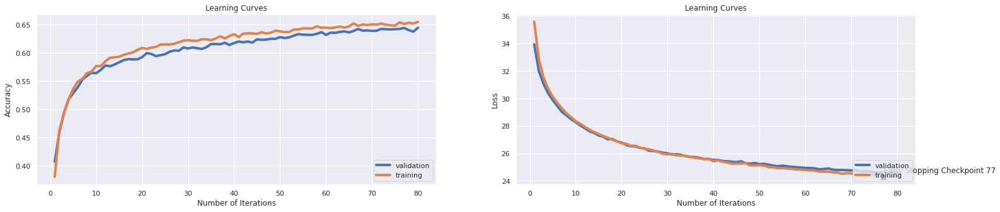

              precision    recall  f1-score
neutral        0.678392  0.760563  0.717131
antivax        0.519231  0.182432  0.270000
provax         0.616870  0.659066  0.637270
macro avg      0.604831  0.534021  0.541467
weighted avg   0.632917  0.644610  0.626902
Accuracy: 0.64461 

Total time: 109.89 seconds
Grid Search: 20, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.2257135703555333, 0.24555583375062595, 0.2601402103154732, 0.2839884827240861, 0.3028292438657987, 0.32530045067601404, 0.3466449674511768, 0.36179268903355033, 0.38232348522784176, 0.3975338007010516, 0.41656234351527294, 0.42469954932398596, 0.43778167250876315, 0.45161492238357537, 0.4600650976464697, 0.46851527290936407, 0.47684026039058586, 0.4849148723084627, 0.48867050575863796, 0.49655733600400603, 0.5016900350525789, 0.5023785678517777, 0.5048197295943916, 0.51721331997997, 0.5157736604907361, 0.516337005508262

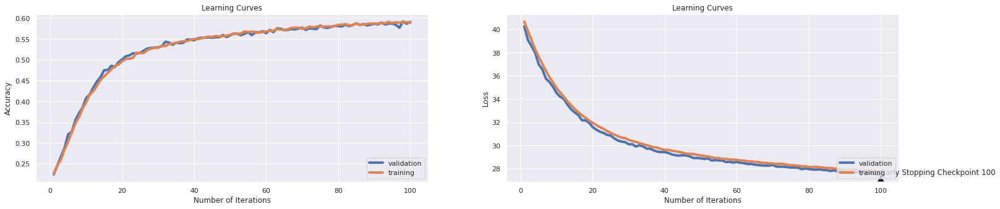

              precision    recall  f1-score
neutral        0.607353  0.775587  0.681237
antivax        0.750000  0.020270  0.039474
provax         0.565646  0.561346  0.563488
macro avg      0.640999  0.452401  0.428066
weighted avg   0.609023  0.591148  0.550471
Accuracy: 0.59115 

Total time: 135.41 seconds
Grid Search: 21, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.4093014521782674, 0.40855032548823234, 0.4062343515272909, 0.40992739108662996, 0.40635953930896346]
Validation accuracy scores: [0.4053461875547765, 0.40446976336546886, 0.401840490797546, 0.4057843996494303, 0.4057843996494303]
Training f1 scores: [0.3920041122517891, 0.3908649314248924, 0.38937124678955704, 0.39239391205015745, 0.388135277893068]
Validation f1 scores: [0.3843100466360916, 0.38389155255687546, 0.38750521770220164, 0.38727780859478844, 0.38958727461762493]
Training losses: [34.77023722457886, 34.7599396

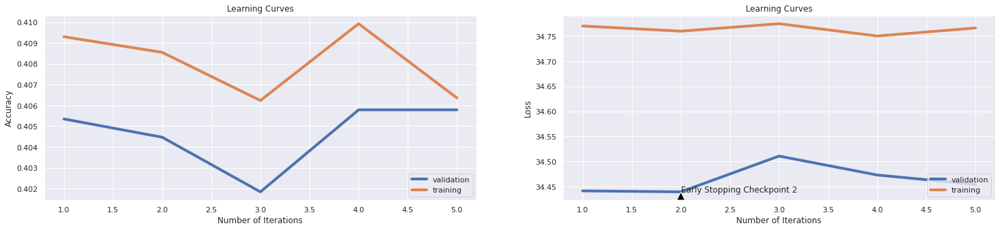

              precision    recall  f1-score
neutral        0.476425  0.635681  0.544650
antivax        0.131579  0.168919  0.147929
provax         0.413721  0.216069  0.283880
macro avg      0.340575  0.340223  0.325486
weighted avg   0.406388  0.405784  0.387946
Accuracy: 0.40578 

Total time: 7.47 seconds
Grid Search: 22, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6479719579369053, 0.6863420130195292, 0.7160115172759138, 0.724899849774662, 0.742864296444667, 0.7595142714071107]
Validation accuracy scores: [0.6687116564417178, 0.6757230499561788, 0.6831726555652936, 0.689307624890447, 0.6884312007011394, 0.679666958808063]
Training f1 scores: [0.6276493853064923, 0.6747020243056631, 0.7061198410931402, 0.7165684002338625, 0.7362463371642523, 0.753357596803496]
Validation f1 scores: [0.6552179205217301, 0.6687709627337433, 0.6769131951874057, 0.6823722373973251, 0.677931342821472, 0.67730

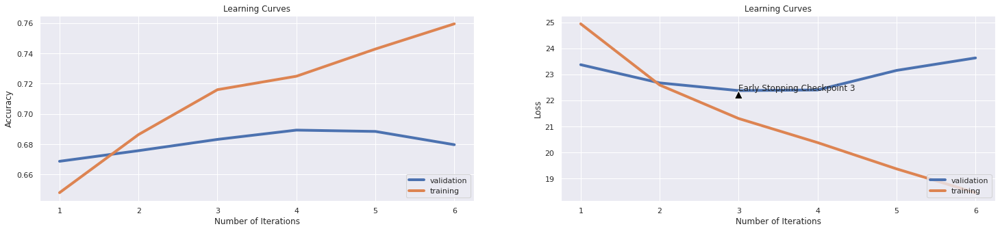

              precision    recall  f1-score
neutral        0.802442  0.678873  0.735504
antivax        0.497696  0.364865  0.421053
provax         0.618557  0.781759  0.690647
macro avg      0.639565  0.608499  0.615735
weighted avg   0.688698  0.679667  0.676612
Accuracy: 0.67967 

Total time: 8.58 seconds
Grid Search: 23, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5866925388082124, 0.6465322984476715, 0.6626189283925888, 0.6700050075112669, 0.6808963445167752, 0.6866549824737106, 0.6911617426139208, 0.6950425638457687, 0.7021156735102654, 0.7088758137205808, 0.7101902854281422, 0.7135077616424637, 0.717513770655984, 0.721206810215323, 0.7263395092638958, 0.7286554832248373, 0.7330996494742114, 0.7357911867801703, 0.7374186279419128, 0.7388582874311467, 0.7464947421131698]
Validation accuracy scores: [0.6270815074496056, 0.6516213847502191, 0.6586327782646801, 0.6652059596844873, 0.6687

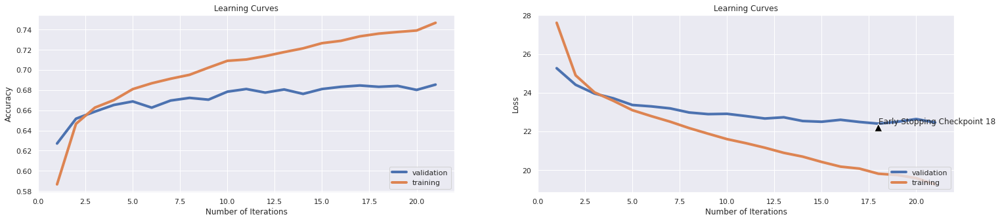

              precision    recall  f1-score
neutral        0.767736  0.741784  0.754537
antivax        0.547945  0.270270  0.361991
provax         0.626920  0.753529  0.684418
macro avg      0.647533  0.588528  0.600315
weighted avg   0.682394  0.685364  0.675320
Accuracy: 0.68536 

Total time: 28.51 seconds
Grid Search: 24, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.41762643965948926, 0.4327741612418628, 0.43828242363545317, 0.45123935903855783, 0.4607536304456685, 0.46745117676514775, 0.4759639459188783, 0.48347521281922884, 0.49092388582874313, 0.502941912869304, 0.5011266900350526, 0.5100150225338007, 0.5148347521281923, 0.5203430145217827, 0.5224712068102153, 0.5291687531296946, 0.5321732598898348, 0.5338007010515774, 0.5413745618427641, 0.5407486229344016, 0.542313470205308, 0.5484476715072609, 0.5480721081622434, 0.5543314972458688, 0.5555207811717576, 0.5568978467701552, 0.5564596

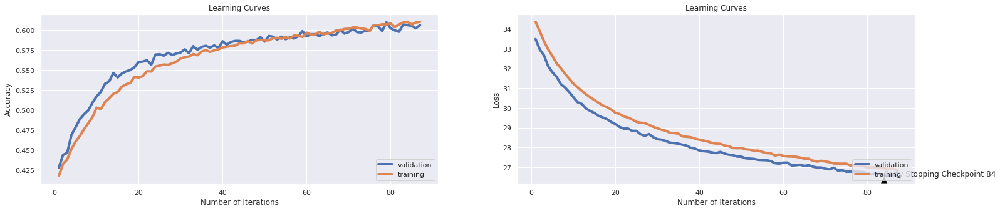

              precision    recall  f1-score
neutral        0.628358  0.790610  0.700208
antivax        0.266667  0.013514  0.025723
provax         0.579288  0.583062  0.581169
macro avg      0.491438  0.462395  0.435700
weighted avg   0.561639  0.606047  0.564677
Accuracy: 0.60605 

Total time: 116.36 seconds
Best grid is: Grid Search: 14, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['ReLU'],
  'optimizers': ['SGD', 'Nesterov', 'Adadelta', 'Adam'],
  'loss_functions': ['CrossEntropy'],
  'learning_rates': [{'val': 1e-3, 'schelduler' : 'Exponential'}, {'val': 1e-4, 'schelduler' : None}, {'val' : 5e-7, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 100,
  'early_stopping_patience': 3,
  'input_normalization' : True,
  'L2_reg': 1e-4,
  'accuracy_threshold': 0.68
}

customGridSearch(param_grid, glove_training_set, glove_validation_set)

### **Loss function evaluation: Cross Entropy Loss vs Hinge Multinomial Loss**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6152979469203805, 0.653793189784677, 0.6610540811216825, 0.6664371557336004, 0.6687531296945418, 0.6703179769654481, 0.6718828242363545, 0.6709439158738107, 0.6720706059088633]
Validation accuracy scores: [0.6476774758983348, 0.661262050832603, 0.6581945661700263, 0.6621384750219106, 0.6665205959684487, 0.6652059596844873, 0.6603856266432954, 0.6687116564417178, 0.6669588080631026]
Training f1 scores: [0.5854960275560536, 0.6313786906338655, 0.6420766056894547, 0.6479637303449625, 0.6506935438475321, 0.6533142436713283, 0.6558839887044832, 0.6547084308051259, 0.6553456501838802]
Validation f1 scores: [0.627378027086007, 0.6421105735599856, 0.6423803930755774, 0.6449726471330988, 0.6522522624631002, 0.6519256774240227, 0.6445995097144182, 0.6563357043069443, 0.6524334993841303]
Training losses: [26.47735042858124, 24.6730963268280

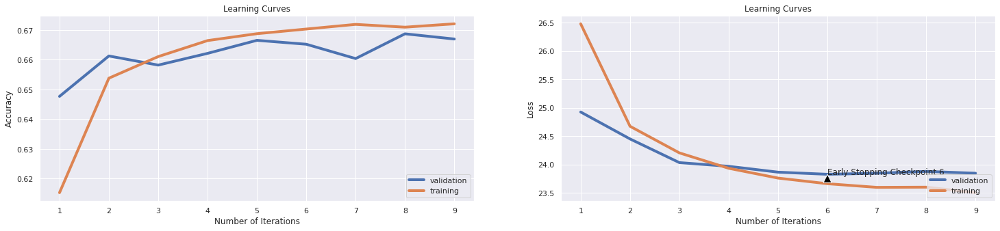

              precision    recall  f1-score
neutral        0.742337  0.727700  0.734945
antivax        0.573643  0.250000  0.348235
provax         0.606853  0.730727  0.663054
macro avg      0.640945  0.569476  0.582078
weighted avg   0.665775  0.666959  0.655770
Accuracy: 0.66696 

Total time: 9.79 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5562719078617927, 0.6013395092638958, 0.6111667501251877, 0.6204932398597897, 0.62550075112669, 0.6329494241362043, 0.6363920881321983, 0.640272909364046, 0.6422759138708062, 0.6476589884827241, 0.6494116174261392, 0.6510390585878818, 0.6544191286930395, 0.6547320981472209, 0.6589258888332499, 0.6577366049073611, 0.6566725087631448, 0.6593640460691037, 0.6618678017025539, 0.6643089634451678, 0.6668127190786179, 0.6656860290435653, 0.6646845267901853, 0.6704431647471207, 0.6664997496244367, 0.6693164747120681, 0.6726965448172258, 0.6

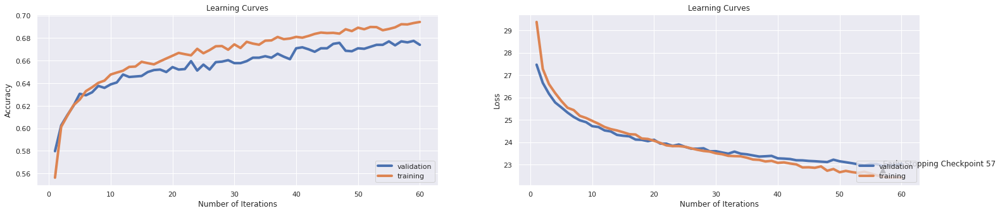

              precision    recall  f1-score
neutral        0.768537  0.720188  0.743577
antivax        0.493243  0.246622  0.328829
provax         0.614437  0.757872  0.678658
macro avg      0.625406  0.574894  0.583688
weighted avg   0.670635  0.673970  0.663579
Accuracy: 0.67397 

Total time: 60.34 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5214697045568353, 0.586880320480721, 0.6117926890335503, 0.6233725588382574, 0.631634952428643, 0.6373309964947421, 0.6435903855783676, 0.6434651977966951, 0.6522283425137707, 0.6567351026539809, 0.6618052078117176, 0.6624311467200801, 0.66092889334001, 0.6663745618427641, 0.6695042563845769, 0.6725087631447171, 0.6735102653980971, 0.6777666499749625, 0.6785803705558338, 0.6812093139709564, 0.6827741612418627, 0.6851527290936404, 0.6876564847270906, 0.6890961442163245, 0.6924136204306459, 0.6962944416624938, 0.6956685027541312, 

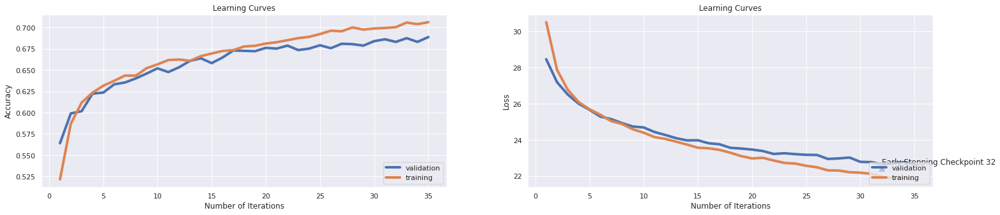

              precision    recall  f1-score
neutral        0.744604  0.777465  0.760680
antivax        0.539773  0.320946  0.402542
provax         0.652918  0.704669  0.677807
macro avg      0.645765  0.601027  0.613676
weighted avg   0.681031  0.688869  0.680779
Accuracy: 0.68887 

Total time: 37.56 seconds
Grid Search: 4, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.5978968452679019, 0.64421632448673, 0.6522909364046069, 0.6636830245368052, 0.6619929894842264, 0.6645593390085127, 0.6626189283925888, 0.6663119679519279, 0.6644341512268402, 0.6675012518778167, 0.668064596895343, 0.6674386579869804, 0.6663745618427641, 0.6679394091136706, 0.6656234351527291, 0.6654982473710566, 0.6688157235853781]
Validation accuracy scores: [0.6397896581945661, 0.6432953549517967, 0.6529360210341806, 0.6507449605609115, 0.6524978089395267, 0.6524978089395267, 0.6468010517090271, 0.6481156879929886, 0.649868536371

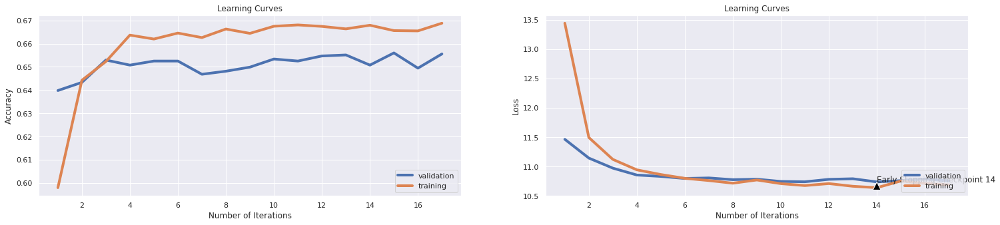

              precision    recall  f1-score
neutral        0.719964  0.748357  0.733886
antivax        0.571429  0.148649  0.235925
provax         0.596539  0.711183  0.648836
macro avg      0.629311  0.536063  0.539549
weighted avg   0.650884  0.655565  0.634969
Accuracy: 0.65557 

Total time: 17.64 seconds
Grid Search: 5, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5062593890836254, 0.5624687030545819, 0.5846269404106159, 0.5980846269404106, 0.6134827240861291, 0.6203054581872809, 0.6248122183274912, 0.6298197295943916, 0.6306960440660991, 0.6394591887831748, 0.6409614421632449, 0.64221331997997, 0.6437781672508763, 0.6448422633950927, 0.6463445167751627, 0.650350525788683, 0.6509764646970456, 0.6522283425137707, 0.6554832248372559, 0.6557336004006009, 0.6561091637456185, 0.6556710065097646, 0.6622433650475713, 0.6588632949424136, 0.6620555833750625, 0.6644967451176765, 0.6636830245368052, 0.6668753

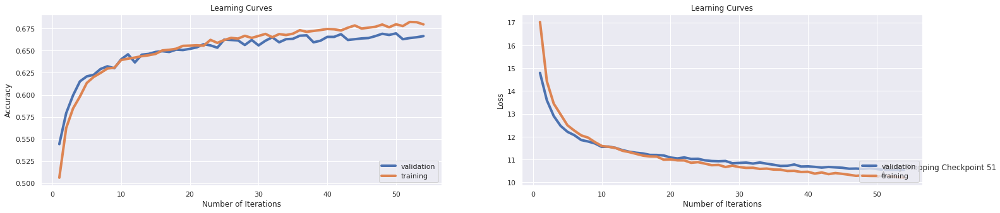

              precision    recall  f1-score
neutral        0.730699  0.746479  0.738504
antivax        0.572917  0.185811  0.280612
provax         0.611111  0.728556  0.664685
macro avg      0.638242  0.553615  0.561267
weighted avg   0.661968  0.666521  0.649318
Accuracy: 0.66652 

Total time: 53.99 seconds
Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4190035052578868, 0.5411241862794192, 0.5801201802704056, 0.5978968452679019, 0.6101652478718077, 0.6226214321482223, 0.6314471707561342, 0.6374561842764146, 0.6407736604907361, 0.6467200801201802, 0.649599399098648, 0.6529168753129695, 0.6558587881822734, 0.6578617926890336, 0.6609914872308462, 0.6603029544316474, 0.663119679519279, 0.6682523785678518, 0.6687531296945418, 0.6685027541311968, 0.6698798197295944, 0.6745117676514772, 0.6757636454682023, 0.6753880821231848, 0.6780170255383074, 0.6779544316474712, 0.6825863795693541, 0.682

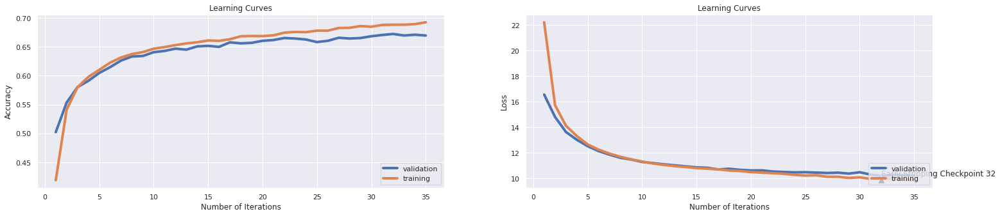

              precision    recall  f1-score
neutral        0.750243  0.724883  0.737345
antivax        0.544000  0.229730  0.323040
provax         0.609929  0.747014  0.671547
macro avg      0.634724  0.567209  0.577311
weighted avg   0.666861  0.669588  0.657050
Accuracy: 0.66959 

Total time: 37.56 seconds
Grid Search: 7, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6147346019028542, 0.6571106659989985, 0.6724461692538808, 0.6763269904857286, 0.6832749123685529, 0.6829619429143715, 0.6880320480721082, 0.688970956434652, 0.6879694541812719, 0.6894091136705057, 0.6900976464697045, 0.6919754631947922, 0.6902854281422133]
Validation accuracy scores: [0.6481156879929886, 0.6652059596844873, 0.661262050832603, 0.6652059596844873, 0.6691498685363716, 0.6722173531989483, 0.6665205959684487, 0.6695880806310254, 0.6722173531989483, 0.6770376862401403, 0.670464504820333, 0.670464504820333, 0.6

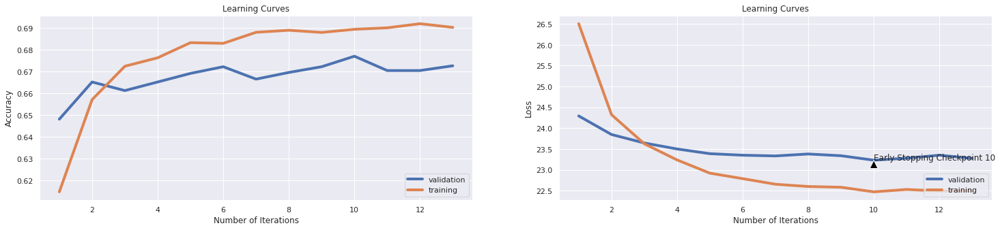

              precision    recall  f1-score
neutral        0.732790  0.759624  0.745966
antivax        0.546667  0.277027  0.367713
provax         0.626459  0.699240  0.660852
macro avg      0.635305  0.578630  0.591510
weighted avg   0.665733  0.672656  0.662551
Accuracy: 0.67266 

Total time: 15.47 seconds
Grid Search: 8, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5590886329494241, 0.5992113169754631, 0.6204306459689535, 0.6268152228342514, 0.6348272408612919, 0.6422759138708062, 0.6444667000500751, 0.6483475212819229, 0.6509764646970456, 0.6553580370555834, 0.659677015523285, 0.6603029544316474, 0.6648723084626941, 0.6713820731096645, 0.6698798197295944, 0.6681271907861792, 0.6730095142714071, 0.6724461692538808, 0.676201802704056, 0.6770781171757636, 0.6781422133199799, 0.682336004006009, 0.6827115673510266, 0.6856534802203305, 0.6869679519278918, 0.689471707561342, 0.6914747120681022

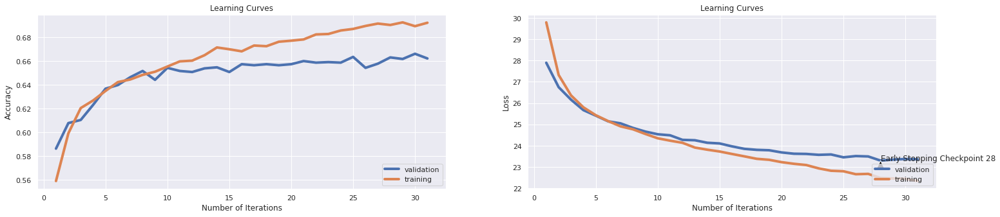

              precision    recall  f1-score
neutral        0.753234  0.710798  0.731401
antivax        0.486667  0.246622  0.327354
provax         0.604259  0.739414  0.665039
macro avg      0.614720  0.565611  0.574598
weighted avg   0.658532  0.662138  0.652209
Accuracy: 0.66214 

Total time: 36.89 seconds
Grid Search: 9, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5272283425137707, 0.6015272909364046, 0.6211817726589884, 0.6308838257386079, 0.6408362543815723, 0.6504757135703555, 0.6502879318978467, 0.6581121682523786, 0.6654982473710566, 0.6687531296945418, 0.6713820731096645, 0.6785803705558338, 0.681584877315974, 0.6864672008012018, 0.6906609914872308, 0.6917250876314471, 0.6897220831246871, 0.7021156735102654, 0.6992363545317977, 0.7008637956935403, 0.7053079619429143, 0.7125688532799199, 0.7120055082623936, 0.7156359539308963, 0.7199549323985979, 0.7187656484727091, 0.7266524787

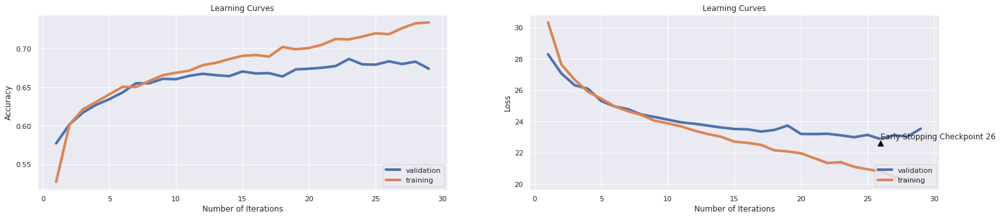

              precision    recall  f1-score
neutral        0.796892  0.674178  0.730417
antivax        0.541436  0.331081  0.410901
provax         0.601667  0.783931  0.680811
macro avg      0.646665  0.596397  0.607376
weighted avg   0.684965  0.673970  0.668952
Accuracy: 0.67397 

Total time: 35.79 seconds
Grid Search: 10, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6171131697546319, 0.6562969454181272, 0.6696294441662494, 0.6776414621932899, 0.6797070605908864, 0.6864672008012018, 0.6864046069103655, 0.6864672008012018, 0.6839008512769154, 0.6882824236354532, 0.6875312969454181]
Validation accuracy scores: [0.6503067484662577, 0.6489921121822962, 0.6599474145486416, 0.670464504820333, 0.6660823838737949, 0.6617002629272568, 0.6695880806310254, 0.6682734443470639, 0.6617002629272568, 0.6673970201577564, 0.6669588080631026]
Training f1 scores: [0.5948415160094078, 0.6361353411519916, 0.650

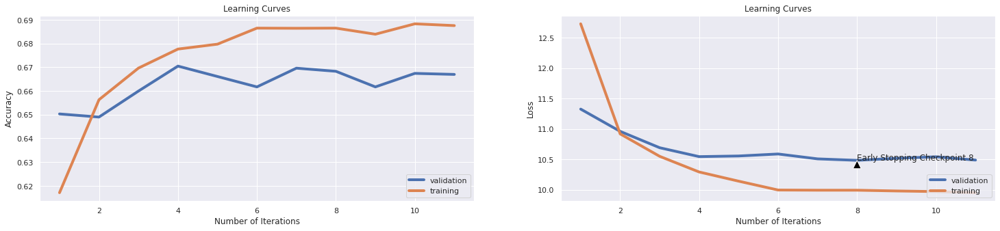

              precision    recall  f1-score
neutral        0.728015  0.753991  0.740775
antivax        0.566667  0.172297  0.264249
provax         0.613407  0.725299  0.664677
macro avg      0.636029  0.550529  0.556567
weighted avg   0.660831  0.666959  0.648252
Accuracy: 0.66696 

Total time: 13.06 seconds
Grid Search: 11, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5418127190786179, 0.5933274912368552, 0.6181772658988482, 0.6266274411617426, 0.6330746119178768, 0.6393965948923385, 0.6439659489233851, 0.6497245868803205, 0.6519779669504256, 0.6547946920380571, 0.6551076614922383, 0.6628693039559339, 0.6613044566850276, 0.668314972458688, 0.6706309464196294, 0.6701301952929394, 0.6723209814722083, 0.6736980470706059, 0.6731347020530796, 0.6758262393590385, 0.6775162744116174, 0.6787055583375062, 0.6795192789183776, 0.6835252879318978, 0.6815222834251377, 0.6832749123685529, 0.6856534802203305, 0

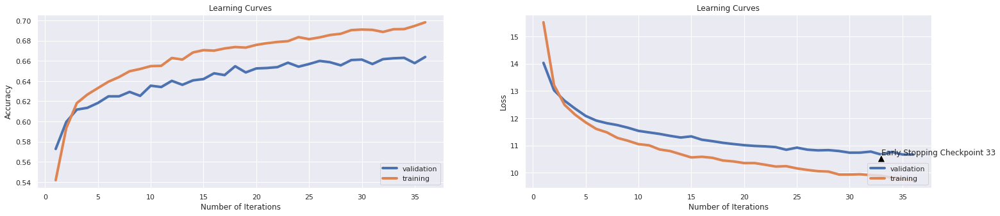

              precision    recall  f1-score
neutral        0.735460  0.736150  0.735805
antivax        0.535433  0.229730  0.321513
provax         0.608815  0.719870  0.659701
macro avg      0.626569  0.561917  0.572340
weighted avg   0.658401  0.663891  0.651352
Accuracy: 0.66389 

Total time: 44.71 seconds
Grid Search: 12, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.49292689033550324, 0.5836254381572359, 0.6119804707060591, 0.6248122183274912, 0.6390836254381572, 0.6470956434651978, 0.6561091637456185, 0.6582999499248874, 0.6619929894842264, 0.6677516274411618, 0.6727591387080621, 0.6765147721582374, 0.6805833750625939, 0.6802078117175764, 0.6880320480721082, 0.6938532799198798, 0.6947921882824236, 0.7021156735102654, 0.7023034551827742, 0.706935403104657, 0.7101902854281422, 0.7090635953930896, 0.7105032548823235, 0.7190160240360541, 0.7178893340010015, 0.7195793690535803, 0.722896845267901

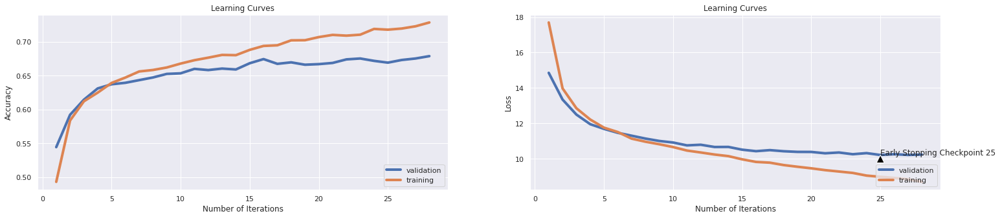

              precision    recall  f1-score
neutral        0.749767  0.756808  0.753271
antivax        0.500000  0.354730  0.415020
provax         0.639920  0.692725  0.665276
macro avg      0.629896  0.601421  0.611189
weighted avg   0.673036  0.678791  0.673882
Accuracy: 0.67879 

Total time: 34.44 seconds
Best grid is: Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['ReLU'],
  'optimizers': ['SGD'],
  'loss_functions': ['CrossEntropy', 'Hinge'],
  'learning_rates': [{'val': 1e-3, 'schelduler' : 'Exponential'}, {'val': 1e-4, 'schelduler' : None}, {'val' : 5e-7, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 100,
  'early_stopping_patience': 3,
  'input_normalization' : True,
  'L2_reg': 1e-4,
  'accuracy_threshold': 0.68
}

customGridSearch(param_grid, glove_training_set, glove_validation_set)

### **Putting all together now**

Grid Search: 1, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6224962443665498, 0.6497871807711567, 0.6527916875312969, 0.6536680020030045, 0.6572984476715072, 0.6606159238858288, 0.6573610415623435, 0.6567976965448172, 0.6624311467200801, 0.6603655483224837, 0.6596144216324487, 0.6606159238858288, 0.6603655483224837, 0.6603029544316474, 0.658487731597396]
Validation accuracy scores: [0.6345311130587205, 0.6524978089395267, 0.6516213847502191, 0.6538124452234881, 0.6511831726555652, 0.6538124452234881, 0.6511831726555652, 0.6511831726555652, 0.6560035056967572, 0.654250657318142, 0.6538124452234881, 0.6529360210341806, 0.6551270815074496, 0.6568799298860648, 0.6573181419807187]
Training f1 scores: [0.6006226792276721, 0.6298512645212624, 0.6327135647128952, 0.6345578348508153, 0.6382970728860351, 0.6424475865043928, 0.6394533591995338, 0.6392250026625433, 0.6442693304160338, 0.6418626340058

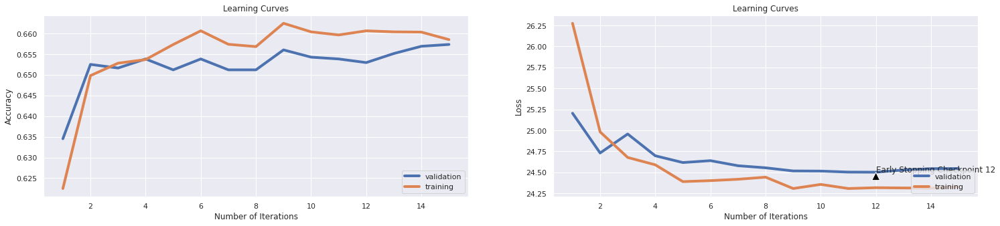

              precision    recall  f1-score
neutral        0.711971  0.742723  0.727022
antivax        0.607143  0.172297  0.268421
provax         0.605336  0.714441  0.655378
macro avg      0.641483  0.543154  0.550274
weighted avg   0.655336  0.657318  0.638622
Accuracy: 0.65732 

Total time: 15.78 seconds
Grid Search: 2, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5374311467200801, 0.6218703054581873, 0.6346394591887832, 0.6421507260891337, 0.6423385077616425, 0.6486604907361042, 0.6496619929894842, 0.6521657486229344, 0.6516024036054081, 0.6524787180771157, 0.651352028042063, 0.6546695042563846, 0.6536680020030045, 0.6554832248372559, 0.6554206309464197, 0.6569228843264897, 0.6572984476715072, 0.6554832248372559, 0.6557336004006009, 0.6588007010515774, 0.6581121682523786, 0.6571106659989985, 0.6563595393089634, 0.6584251377065599, 0.6620555833750625, 0.6633700550826239, 0.6584251377065599, 

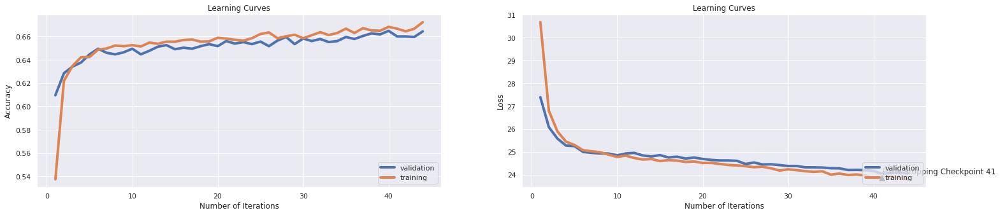

              precision    recall  f1-score
neutral        0.725000  0.735211  0.730070
antivax        0.584906  0.209459  0.308458
provax         0.612226  0.728556  0.665345
macro avg      0.640711  0.557742  0.567957
weighted avg   0.661314  0.664330  0.649260
Accuracy: 0.66433 

Total time: 45.06 seconds
Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4773410115172759, 0.6112919379068603, 0.6296319479218828, 0.6388332498748123, 0.6440911367050576, 0.6447170756134202, 0.6491612418627942, 0.6489734601902855, 0.6486604907361042, 0.6497871807711567, 0.6562343515272909, 0.6521657486229344, 0.6527290936404607, 0.6528542814221332, 0.6585503254882323, 0.6560465698547822, 0.656985478217326, 0.6571732598898348, 0.6598022033049574, 0.6618678017025539, 0.6643089634451678, 0.6620555833750625, 0.6616174261392088, 0.6676264396594892, 0.6655608412618929, 0.6649349023535303, 0.669566850275413

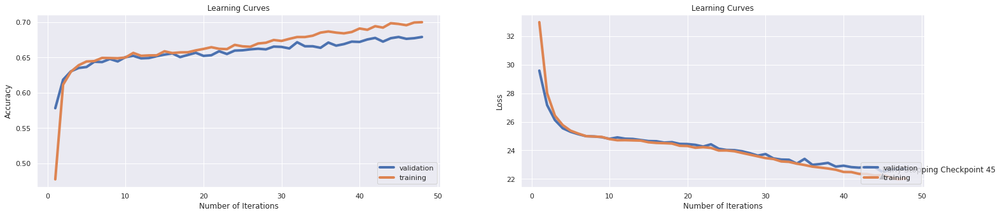

              precision    recall  f1-score
neutral        0.764012  0.729577  0.746398
antivax        0.544910  0.307432  0.393089
provax         0.620219  0.739414  0.674591
macro avg      0.643047  0.592141  0.604693
weighted avg   0.677558  0.678791  0.671589
Accuracy: 0.67879 

Total time: 51.31 seconds
Grid Search: 4, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6251877816725088, 0.6457811717576365, 0.653793189784677, 0.6536054081121683, 0.6547946920380571, 0.657235853780671, 0.6564221331997997, 0.6594266399599399, 0.6601151727591387, 0.6610540811216825, 0.6593640460691037]
Validation accuracy scores: [0.6441717791411042, 0.6454864154250657, 0.6463628396143734, 0.6476774758983348, 0.6516213847502191, 0.6533742331288344, 0.6524978089395267, 0.6507449605609115, 0.64943032427695, 0.6546888694127958, 0.6538124452234881]
Training f1 scores: [0.6004030176401509, 0.6179810066880331, 0.628228737405

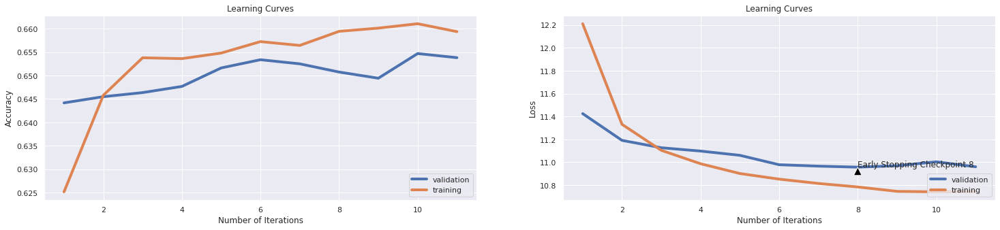

              precision    recall  f1-score
neutral        0.714032  0.754930  0.733911
antivax        0.627907  0.091216  0.159292
provax         0.593890  0.717698  0.649951
macro avg      0.645276  0.521281  0.514385
weighted avg   0.654372  0.653812  0.625491
Accuracy: 0.65381 

Total time: 11.57 seconds
Grid Search: 5, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5496369554331497, 0.6300075112669004, 0.6410866299449174, 0.6446544817225839, 0.6424011016524788, 0.6492864296444667, 0.6502879318978467, 0.650350525788683, 0.6490360540811216, 0.6509138708062093, 0.6557336004006009, 0.6524161241862794, 0.6544191286930395, 0.6542313470205308, 0.6565473209814722, 0.6541687531296946, 0.6598647971957937, 0.6557961942914372, 0.6607411116675013, 0.6575488232348523, 0.6588632949424136, 0.6593014521782674]
Validation accuracy scores: [0.6134969325153374, 0.6257668711656442, 0.6305872042068361, 0.6371603856266433

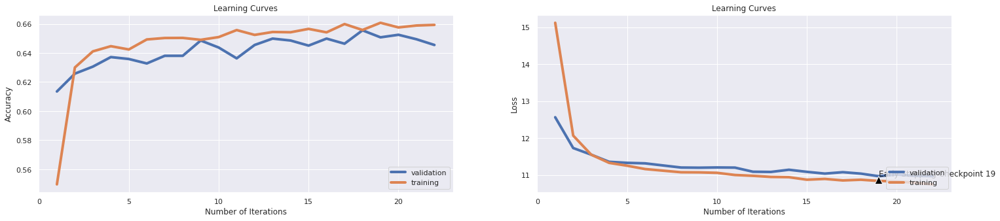

              precision    recall  f1-score
neutral        0.700704  0.747418  0.723308
antivax        0.619048  0.087838  0.153846
provax         0.589674  0.706840  0.642963
macro avg      0.636475  0.514032  0.506706
weighted avg   0.645301  0.645486  0.617016
Accuracy: 0.64549 

Total time: 22.75 seconds
Grid Search: 6, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4784677015523285, 0.6099774661992989, 0.6360165247871807, 0.6459689534301453, 0.6470956434651978, 0.6464697045568353, 0.6482223335002504, 0.6502253380070105, 0.6510390585878818, 0.6509764646970456, 0.6547320981472209, 0.6531046569854783, 0.6554832248372559, 0.657486229344016, 0.6545443164747121, 0.657486229344016, 0.6586755132699048, 0.6537305958938407, 0.6600525788683025, 0.660678517776665, 0.6628067100650976, 0.6648097145718578, 0.6629944917376064, 0.6678768152228343]
Validation accuracy scores: [0.5661700262927257, 0.620070113935144

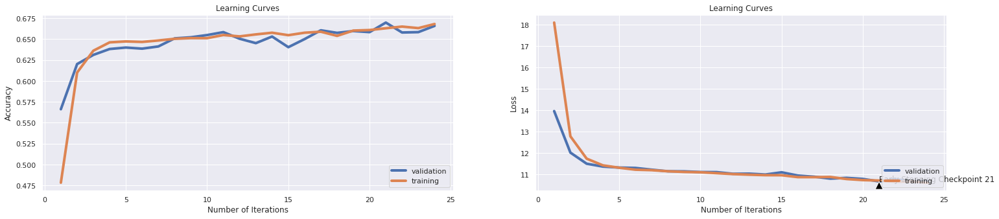

              precision    recall  f1-score
neutral        0.721429  0.758685  0.739588
antivax        0.609756  0.168919  0.264550
provax         0.612037  0.717698  0.660670
macro avg      0.647741  0.548434  0.554936
weighted avg   0.662794  0.665644  0.646120
Accuracy: 0.66564 

Total time: 26.00 seconds
Grid Search: 7, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6196795192789184, 0.6511642463695543, 0.6674386579869804, 0.6692538808212318, 0.6763269904857286, 0.6830245368052078, 0.6839634451677516, 0.6872809213820731, 0.6862168252378568, 0.6900350525788683, 0.6912243365047571, 0.6927265898848273, 0.6914121181772659, 0.6919754631947922, 0.6899098647971958, 0.6926014021031547, 0.6907235853780671]
Validation accuracy scores: [0.6012269938650306, 0.6581945661700263, 0.6524978089395267, 0.661262050832603, 0.6765994741454864, 0.6722173531989483, 0.6761612620508326, 0.6717791411042945, 

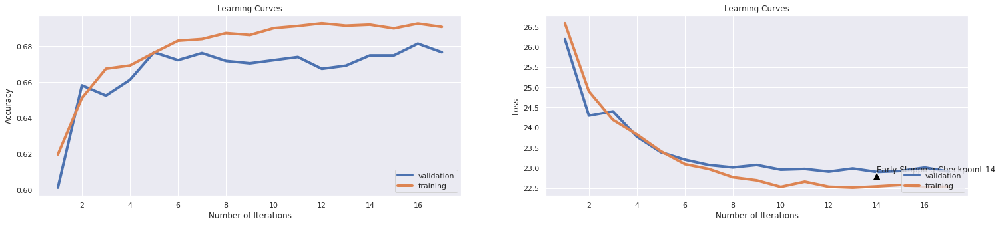

              precision    recall  f1-score
neutral        0.759531  0.729577  0.744253
antivax        0.534722  0.260135  0.350000
provax         0.618834  0.749186  0.677800
macro avg      0.637696  0.579633  0.590684
weighted avg   0.673586  0.676599  0.666294
Accuracy: 0.67660 

Total time: 18.84 seconds
Grid Search: 8, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6227466199298949, 0.6432774161241863, 0.6519153730595894, 0.6527916875312969, 0.6571732598898348, 0.6637456184276415, 0.6652478718077116, 0.6677516274411618, 0.6713820731096645, 0.6721957936905358, 0.6785803705558338, 0.6826489734601903, 0.6797696544817226, 0.6810215322984476, 0.6895343014521783, 0.6897220831246871, 0.6908487731597396, 0.6915373059589384, 0.6924762143214822, 0.6925388082123185]
Validation accuracy scores: [0.6419807186678352, 0.647239263803681, 0.6516213847502191, 0.6393514460999123, 0.6643295354951797, 0.6581

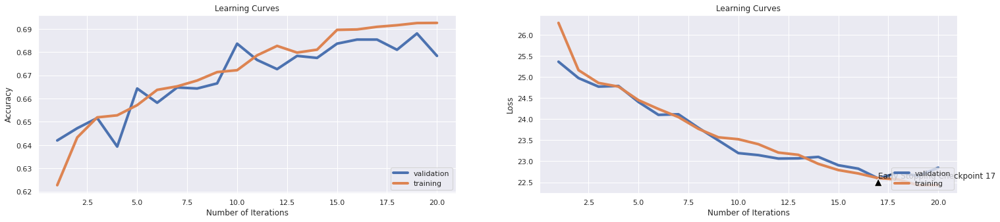

              precision    recall  f1-score
neutral        0.784375  0.707042  0.743704
antivax        0.506944  0.246622  0.331818
provax         0.612903  0.783931  0.687947
macro avg      0.634741  0.579198  0.587823
weighted avg   0.679184  0.678352  0.667775
Accuracy: 0.67835 

Total time: 21.95 seconds
Grid Search: 9, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5201552328492739, 0.613920881321983, 0.6300075112669004, 0.6375813720580872, 0.639521782674011, 0.6474712068102153, 0.650851276915373, 0.6489108662994492, 0.6497245868803205, 0.6489734601902855, 0.6566099148723085, 0.6531046569854783, 0.6511016524787181, 0.6542939409113671, 0.6567351026539809, 0.6594892338507762, 0.656985478217326, 0.6566725087631448, 0.6608037055583375, 0.6614296444667, 0.663620430645969, 0.6633074611917876, 0.6635578367551327, 0.6645593390085127, 0.668314972458688, 0.6688783174762143, 0.6668127190786179, 

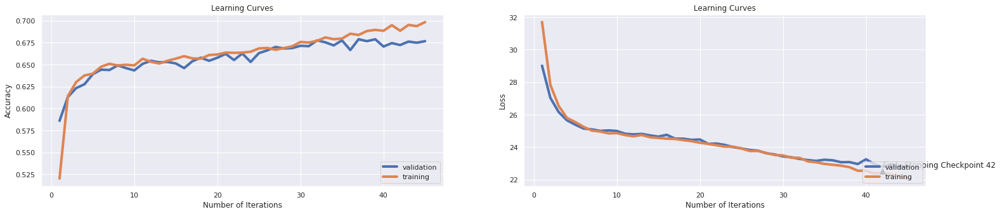

              precision    recall  f1-score
neutral        0.741047  0.757746  0.749304
antivax        0.543478  0.253378  0.345622
provax         0.627488  0.718784  0.670040
macro avg      0.637338  0.576636  0.588322
weighted avg   0.669589  0.676599  0.664952
Accuracy: 0.67660 

Total time: 48.57 seconds
Grid Search: 10, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6222458688032048, 0.6504131196795193, 0.6641837756634953, 0.6654356534802204, 0.6718202303455183, 0.6724461692538808, 0.6759514271407111, 0.6790185277916875, 0.6765147721582374, 0.678893340010015, 0.683337506259389]
Validation accuracy scores: [0.6397896581945661, 0.6432953549517967, 0.6625766871165644, 0.6560035056967572, 0.6669588080631026, 0.670464504820333, 0.6713409290096407, 0.6739702015775635, 0.670464504820333, 0.6695880806310254, 0.6717791411042945]
Training f1 scores: [0.5993153867824741, 0.6266495562116855, 0.640941

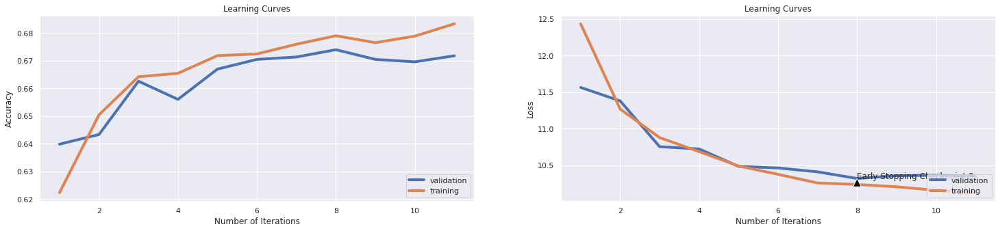

              precision    recall  f1-score
neutral        0.738490  0.753052  0.745700
antivax        0.581633  0.192568  0.289340
provax         0.613843  0.731813  0.667657
macro avg      0.644655  0.559144  0.567566
weighted avg   0.667837  0.671779  0.655008
Accuracy: 0.67178 

Total time: 11.93 seconds
Grid Search: 11, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6228718077115674, 0.6456559839759639, 0.6502253380070105, 0.6567351026539809, 0.66092889334001, 0.6624311467200801, 0.6624937406109164, 0.6688157235853781, 0.667814221331998, 0.6726965448172258, 0.6732598898347522, 0.6767651477215824, 0.6793314972458688, 0.6823985978968453, 0.6817726589884827, 0.685778668002003, 0.6885327991987982, 0.6843390085127692, 0.6899098647971958, 0.6912869303955934, 0.6954807210816224, 0.6967325988983475, 0.6978592889334001]
Validation accuracy scores: [0.6468010517090271, 0.6393514460999123, 0.6441717791411

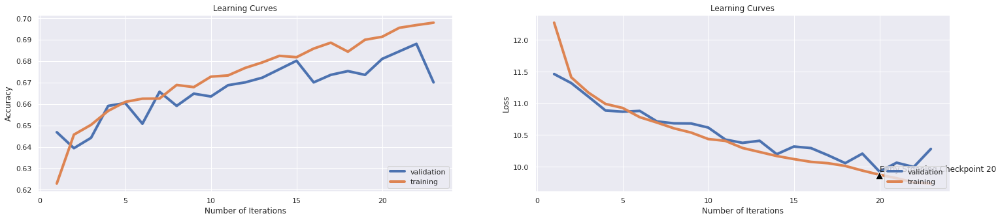

              precision    recall  f1-score
neutral        0.748820  0.744601  0.746704
antivax        0.526786  0.199324  0.289216
provax         0.609361  0.735071  0.666339
macro avg      0.628322  0.559665  0.567420
weighted avg   0.663735  0.670026  0.654928
Accuracy: 0.67003 

Total time: 24.55 seconds
Grid Search: 12, Layers: [75], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.49705808713069605, 0.6049699549323986, 0.6333249874812218, 0.6405858788182274, 0.6463445167751627, 0.6476589884827241, 0.6511642463695543, 0.6518527791687532, 0.6557336004006009, 0.650851276915373, 0.653542814221332, 0.6559839759639459, 0.6538557836755132, 0.6556084126189284, 0.6566725087631448, 0.6601151727591387, 0.6639959939909865, 0.6628693039559339, 0.6606159238858288, 0.6663119679519279, 0.6656860290435653, 0.667563845768653, 0.6673760640961443, 0.6649974962443665, 0.6665623435152729, 0.6713194792188283, 0.6709439158738107,

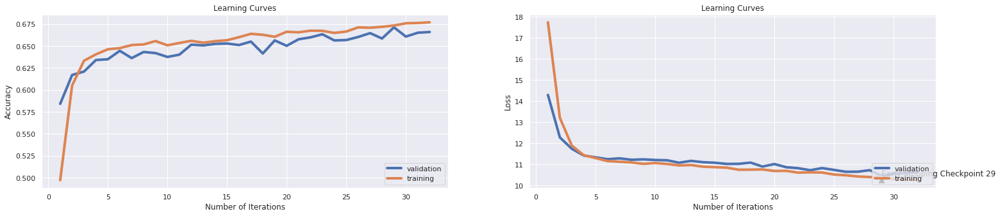

              precision    recall  f1-score
neutral        0.739255  0.726761  0.732955
antivax        0.575221  0.219595  0.317848
provax         0.606952  0.739414  0.666667
macro avg      0.640476  0.561923  0.572490
weighted avg   0.664581  0.666082  0.652357
Accuracy: 0.66608 

Total time: 34.42 seconds
Grid Search: 13, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.35434401602403603, 0.39327741612418626, 0.43878317476214324, 0.4733975963945919, 0.5015648472709063, 0.5245368052078118, 0.5388708062093139, 0.5515147721582374, 0.5591512268402604, 0.57135703555333, 0.5759263895843766, 0.5824987481221833, 0.5870681021532298, 0.593515272909364, 0.5962694041061593, 0.5973335002503756, 0.6009013520280421, 0.6084752128192289, 0.60778668002003, 0.6153605408112168, 0.6122308462694042, 0.6171131697546319, 0.6163620430645969, 0.6192413620430646, 0.6217451176765147, 0.6209939909864797, 0.62343515272909

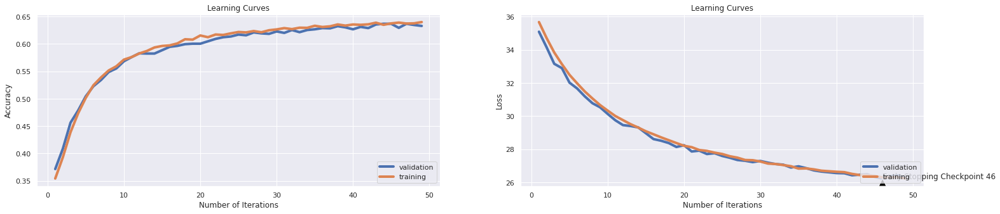

              precision    recall  f1-score
neutral        0.677749  0.746479  0.710456
antivax        0.457944  0.165541  0.243176
provax         0.598802  0.651466  0.624025
macro avg      0.578165  0.521162  0.525886
weighted avg   0.617376  0.632778  0.614962
Accuracy: 0.63278 

Total time: 54.78 seconds
Grid Search: 14, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.38645468202303457, 0.3846394591887832, 0.39384076114171257, 0.3949674511767651, 0.3992864296444667, 0.40166499749624435, 0.4056084126189284, 0.4126189283925889, 0.4151226840260391, 0.4195042563845769, 0.42338507761642463, 0.42626439659489235, 0.4271407110665999, 0.4372809213820731, 0.43671757636454683, 0.44310215322984475, 0.4455433149724587]
Validation accuracy scores: [0.38212094653812445, 0.3943908851884312, 0.401840490797546, 0.40446976336546886, 0.38913234005258546, 0.4127957931638913, 0.41411042944785276, 0.406660823838

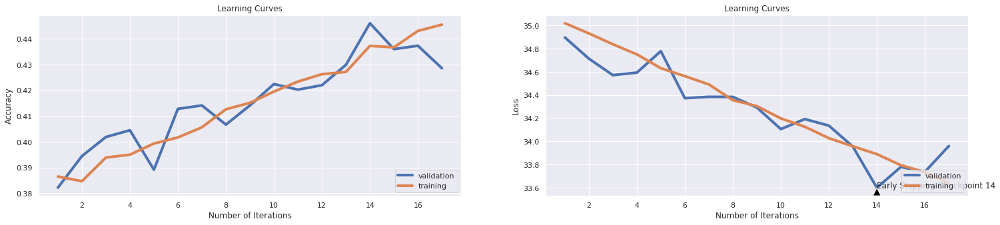

              precision    recall  f1-score
neutral        0.600619  0.364319  0.453536
antivax        0.163934  0.270270  0.204082
provax         0.444251  0.553746  0.492992
macro avg      0.402935  0.396112  0.383536
weighted avg   0.480867  0.428571  0.437103
Accuracy: 0.42857 

Total time: 19.53 seconds
Grid Search: 15, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.32192038057085626, 0.32648973460190284, 0.32398597896845266, 0.32041812719078616, 0.32454932398597897, 0.3225463194792188, 0.32279669504256386, 0.3220455683525288]
Validation accuracy scores: [0.3413672217353199, 0.32515337423312884, 0.3453111305872042, 0.3531989482909728, 0.3540753724802805, 0.3352322524101665, 0.3514460999123576, 0.3409290096406661]
Training f1 scores: [0.34703443739890405, 0.35108367910309896, 0.34903811954122926, 0.3451894540352043, 0.34799563321346266, 0.34765312773768364, 0.3471241310260978, 0.3475693209

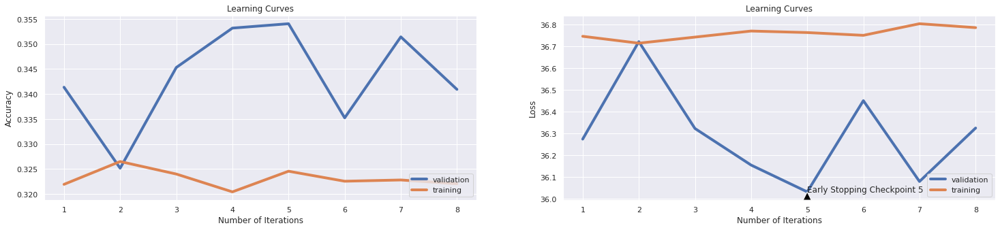

              precision    recall  f1-score
neutral        0.561208  0.331455  0.416765
antivax        0.137595  0.429054  0.208368
provax         0.408219  0.323561  0.360993
macro avg      0.369007  0.361357  0.328709
weighted avg   0.444516  0.340929  0.367225
Accuracy: 0.34093 

Total time: 9.56 seconds
Grid Search: 16, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.2955683525287932, 0.3269904857285929, 0.36642463695543315, 0.4046695042563846, 0.43396344516775165, 0.46250625938908363, 0.47815473209814724, 0.4986229344016024, 0.5167125688532799, 0.5278542814221332, 0.5404356534802204, 0.5502628943415123, 0.5570230345518278, 0.5660991487230846, 0.5741111667501252, 0.5738607911867801, 0.5803079619429143, 0.5876940410615924, 0.5913870806209314, 0.597458688032048, 0.6015272909364046, 0.6061592388582875, 0.60728592889334, 0.6080996494742114, 0.6116675012518779, 0.6150475713570356, 0.6208062093139709, 0

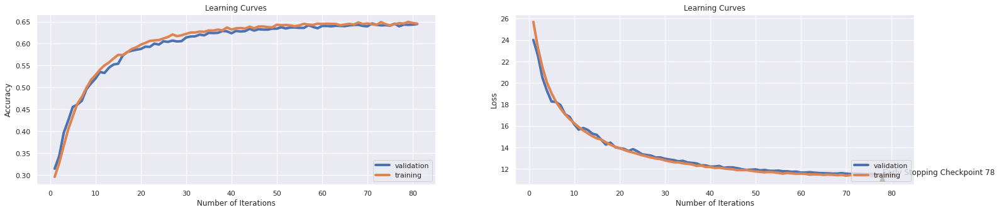

              precision    recall  f1-score
neutral        0.712558  0.719249  0.715888
antivax        0.555556  0.101351  0.171429
provax         0.585429  0.732899  0.650916
macro avg      0.617848  0.517833  0.512744
weighted avg   0.640885  0.644610  0.619043
Accuracy: 0.64461 

Total time: 89.72 seconds
Grid Search: 17, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.39959939909864794, 0.39947421131697547, 0.40254131196795195, 0.40686029043565347, 0.40717325988983477, 0.407235853780671, 0.41086629944917374, 0.4151226840260391, 0.41430896344516777, 0.41781422133199797, 0.421256885327992, 0.42526289434151227, 0.4243239859789685, 0.4260766149223836, 0.42958187280921384, 0.43271156735102656]
Validation accuracy scores: [0.40622261174408414, 0.4101665205959685, 0.4057843996494303, 0.4101665205959685, 0.41411042944785276, 0.41411042944785276, 0.4171779141104294, 0.422874671340929, 0.42375109553023665,

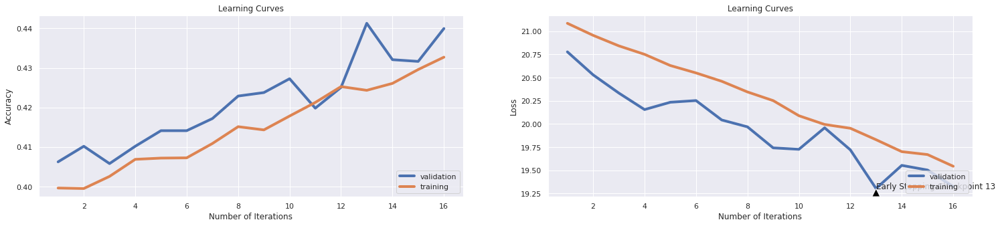

              precision    recall  f1-score
neutral        0.604271  0.451643  0.516926
antivax        0.184524  0.314189  0.232500
provax         0.437882  0.466884  0.451918
macro avg      0.408892  0.410905  0.400448
weighted avg   0.482672  0.439965  0.453796
Accuracy: 0.43996 

Total time: 18.31 seconds
Grid Search: 18, Layers: [75], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.3665498247371057, 0.36567351026539807, 0.36379569354031044, 0.3632323485227842, 0.37030545818728094]
Validation accuracy scores: [0.35100788781770376, 0.3523225241016652, 0.3514460999123576, 0.3453111305872042, 0.35013146362839614]
Training f1 scores: [0.3979123755579632, 0.3965377751859884, 0.3957215397828321, 0.394126094963728, 0.4017239242539292]
Validation f1 scores: [0.3793312448728694, 0.38329231759140436, 0.38271509185308183, 0.37600626685163563, 0.38281186789748034]
Training losses: [23.066330636024475, 23.0850267534256, 23.1

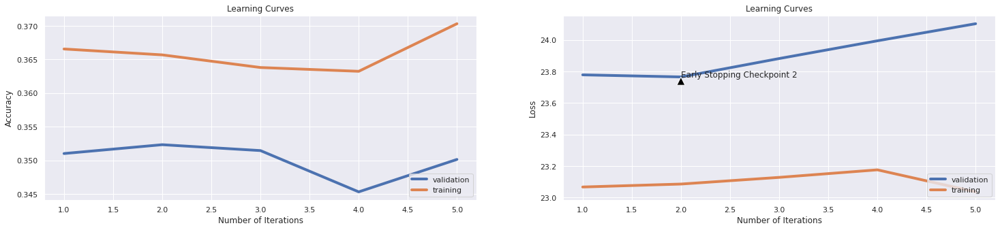

              precision    recall  f1-score
neutral        0.548644  0.323005  0.406619
antivax        0.124867  0.395270  0.189781
provax         0.470752  0.366992  0.412447
macro avg      0.381421  0.361756  0.336282
weighted avg   0.462239  0.350131  0.380845
Accuracy: 0.35013 

Total time: 6.17 seconds
Grid Search: 19, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.629444166249374, 0.6465322984476715, 0.6561717576364546, 0.6648097145718578, 0.6713820731096645, 0.6769529293940911, 0.6797070605908864, 0.6818978467701552, 0.6836504757135704, 0.692663995993991, 0.6957310966449675, 0.6981722583875813, 0.6970455683525288, 0.7019278918377566, 0.7046194291437156, 0.7061216825237857, 0.7099399098647972, 0.7101276915373059, 0.7099399098647972, 0.71457185778668, 0.7162618928392589]
Validation accuracy scores: [0.6498685363716039, 0.6520595968448729, 0.6560035056967572, 0.6546888694127958, 0.674846625766

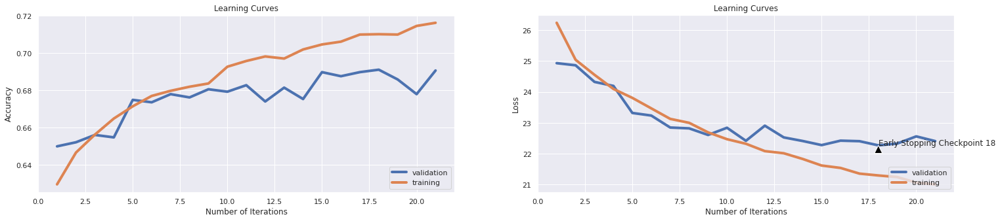

              precision    recall  f1-score
neutral        0.784114  0.723005  0.752320
antivax        0.535088  0.412162  0.465649
provax         0.638060  0.742671  0.686402
macro avg      0.652420  0.625946  0.634791
weighted avg   0.692866  0.690622  0.688532
Accuracy: 0.69062 

Total time: 23.97 seconds
Grid Search: 20, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5584626940410616, 0.6356409614421632, 0.6427766649974962, 0.6489734601902855, 0.6522909364046069, 0.6518527791687532, 0.6532298447671507, 0.6554206309464197, 0.6539183775663495, 0.6544191286930395, 0.6586129193790686, 0.6556084126189284, 0.6589884827240862, 0.660177766649975, 0.657986980470706, 0.6613044566850276, 0.6620555833750625, 0.6619929894842264, 0.6624937406109164, 0.6654356534802204, 0.6656860290435653, 0.6683775663495243, 0.6669379068602904, 0.6661867801702553, 0.6681271907861792, 0.6696294441662494, 0.6686279419128693,

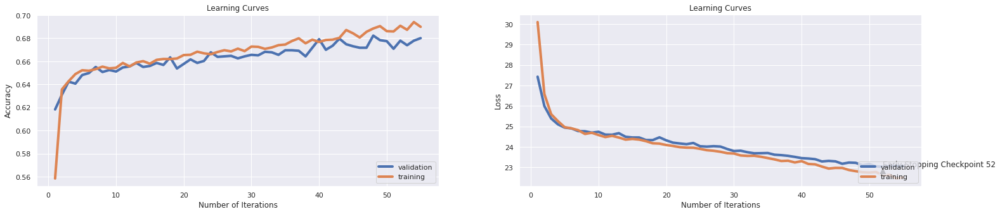

              precision    recall  f1-score
neutral        0.768245  0.731455  0.749399
antivax        0.511765  0.293919  0.373391
provax         0.624772  0.744843  0.679544
macro avg      0.634927  0.590072  0.600778
weighted avg   0.677072  0.680105  0.672434
Accuracy: 0.68011 

Total time: 63.37 seconds
Grid Search: 21, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.37481221832749123, 0.38082123184777167, 0.38689283925888834, 0.389271407110666]
Validation accuracy scores: [0.3838737949167397, 0.38124452234881684, 0.3733567046450482, 0.3768624014022787]
Training f1 scores: [0.3876627331710072, 0.3949142001666766, 0.4002683804868494, 0.4034503485018576]
Validation f1 scores: [0.3954783518511202, 0.38817263210311703, 0.38555012996618054, 0.3893184013389834]
Training losses: [35.25162003326416, 35.12376114845276, 35.01930501174927, 34.912024074554445]
Validation losses: [34.80058087242974, 34.947

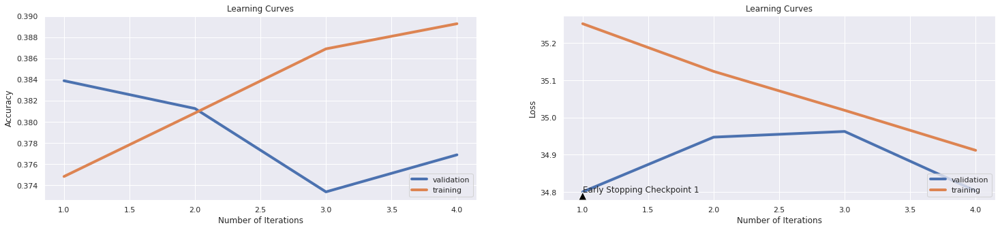

              precision    recall  f1-score
neutral        0.554098  0.476056  0.512121
antivax        0.165680  0.472973  0.245399
provax         0.408046  0.231270  0.295218
macro avg      0.375942  0.393433  0.350913
weighted avg   0.444771  0.376862  0.389984
Accuracy: 0.37686 

Total time: 5.28 seconds
Grid Search: 22, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6223710565848773, 0.6445292939409114, 0.6526664997496244, 0.6536680020030045, 0.6616174261392088, 0.6711316975463195, 0.6728217325988983, 0.6751377065598397, 0.6805207811717576, 0.6816474712068102, 0.6849649474211317, 0.6944792188282424, 0.693665498247371, 0.6976715072608913, 0.7014897346019029]
Validation accuracy scores: [0.6340929009640666, 0.6441717791411042, 0.6476774758983348, 0.6590709903593339, 0.6709027169149868, 0.6643295354951797, 0.6643295354951797, 0.6656441717791411, 0.6652059596844873, 0.6695880806310254, 0.6730937773882559

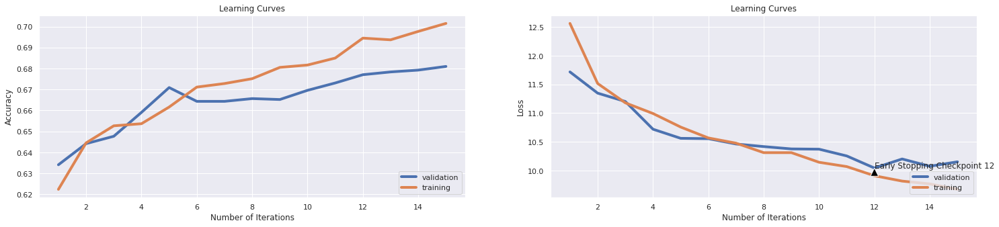

              precision    recall  f1-score
neutral        0.768928  0.734272  0.751201
antivax        0.565217  0.219595  0.316302
provax         0.614783  0.767644  0.682762
macro avg      0.649643  0.573837  0.583421
weighted avg   0.680293  0.680982  0.667168
Accuracy: 0.68098 

Total time: 17.41 seconds
Grid Search: 23, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5541437155733601, 0.6382073109664497, 0.6460941412118177, 0.6469704556835253, 0.6484101151727591, 0.6501627441161743, 0.650851276915373, 0.6526039058587881, 0.6527290936404607, 0.657235853780671, 0.6546069103655483, 0.6557336004006009, 0.6577991987981973, 0.6578617926890336, 0.6593014521782674, 0.6589258888332499, 0.657486229344016, 0.6624937406109164, 0.6628693039559339, 0.659677015523285, 0.6626815222834251, 0.6650600901352028, 0.6637456184276415, 0.6654982473710566, 0.6644341512268402, 0.6698172258387581, 0.6721957936905358, 0.670693

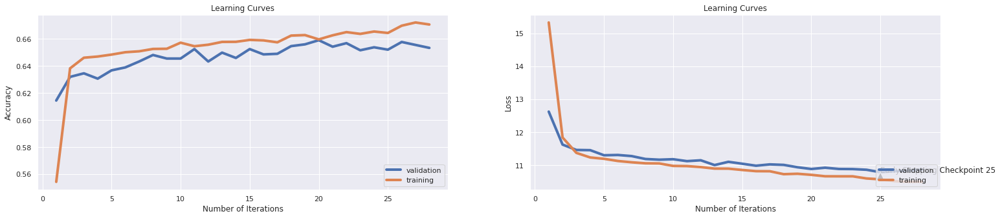

              precision    recall  f1-score
neutral        0.731614  0.719249  0.725379
antivax        0.600000  0.121622  0.202247
provax         0.586383  0.748100  0.657443
macro avg      0.639332  0.529657  0.528356
weighted avg   0.655928  0.653374  0.630104
Accuracy: 0.65337 

Total time: 31.44 seconds
Grid Search: 24, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.3351902854281422, 0.34144967451176766, 0.3445793690535804, 0.3510265398097146, 0.3530295443164747, 0.3592263395092639, 0.36022784176264394, 0.3653605408112168, 0.3737481221832749, 0.3770655983975964, 0.37618928392588885, 0.38438908362543817, 0.3891462193289935, 0.396407110665999, 0.39690786179268905, 0.4042313470205308, 0.407235853780671, 0.4121807711567351, 0.41568602904356533, 0.42344767150726087, 0.42113169754631946, 0.4274536805207812, 0.43521532298447674, 0.43903355032548824, 0.44316474712068105, 0.442663995993991, 0.448547821732598

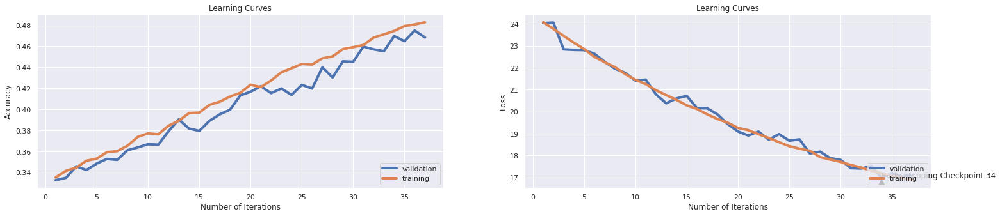

              precision    recall  f1-score
neutral        0.616474  0.449765  0.520087
antivax        0.206823  0.327703  0.253595
provax         0.475869  0.535288  0.503832
macro avg      0.433055  0.437585  0.425838
weighted avg   0.506590  0.468449  0.478960
Accuracy: 0.46845 

Total time: 42.06 seconds
Grid Search: 25, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6183024536805208, 0.6494742113169755, 0.6596144216324487, 0.6706309464196294, 0.6690035052578869, 0.6736354531797697, 0.675450676014021, 0.6767651477215824]
Validation accuracy scores: [0.642418930762489, 0.6608238387379491, 0.6700262927256793, 0.6625766871165644, 0.6717791411042945, 0.6695880806310254, 0.6673970201577564, 0.6739702015775635]
Training f1 scores: [0.5906789421675049, 0.6300962767005062, 0.6421526049997228, 0.6533087178396161, 0.6515224342865896, 0.657006497944701, 0.6584775111917126, 0.6612030524284247]
Valid

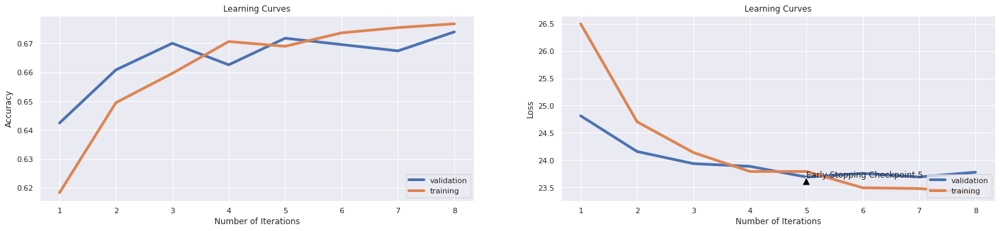

              precision    recall  f1-score
neutral        0.742060  0.723944  0.732890
antivax        0.560811  0.280405  0.373874
provax         0.624658  0.742671  0.678571
macro avg      0.642509  0.582340  0.595112
weighted avg   0.671167  0.673970  0.664399
Accuracy: 0.67397 

Total time: 8.78 seconds
Grid Search: 26, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5674762143214822, 0.6116675012518779, 0.6203054581872809, 0.6255633450175263, 0.6348272408612919, 0.6362669003505258, 0.6396469704556835, 0.6422759138708062, 0.6444667000500751, 0.6468452679018528, 0.6486604907361042, 0.6536054081121683, 0.6551702553830746, 0.6589884827240862, 0.656484727090636, 0.657986980470706, 0.660678517776665, 0.6602403605408113, 0.6644967451176765, 0.6664997496244367, 0.6681897846770155, 0.6708813219829745, 0.6686905358037055, 0.6694416624937406, 0.6700050075112669, 0.674949924887331, 0.6718202303455183, 0.6

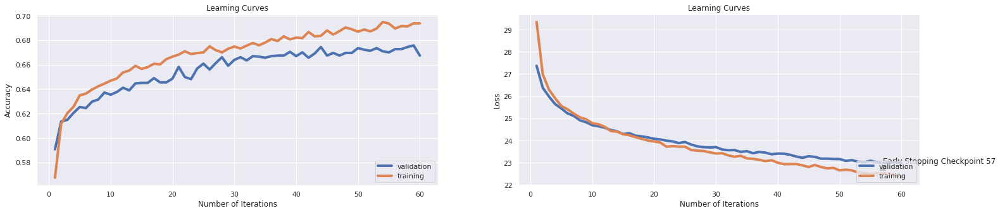

              precision    recall  f1-score
neutral        0.749049  0.739906  0.744450
antivax        0.473684  0.273649  0.346895
provax         0.617564  0.710098  0.660606
macro avg      0.613432  0.574551  0.583984
weighted avg   0.660265  0.667397  0.659044
Accuracy: 0.66740 

Total time: 61.68 seconds
Grid Search: 27, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5227841762643965, 0.5862543815723585, 0.6101026539809714, 0.6179268903355033, 0.6259389083625438, 0.6341387080620932, 0.6392088132198297, 0.6440911367050576, 0.6474086129193791, 0.650100150225338, 0.6566725087631448, 0.6576114171256885, 0.6588007010515774, 0.6642463695543315, 0.6662493740610916, 0.6670005007511267, 0.6706309464196294, 0.6738232348522785, 0.6716950425638458, 0.6777666499749625, 0.6811467200801202, 0.6813970956434652, 0.6840260390585878, 0.6867801702553831, 0.6882198297446169, 0.6907235853780671, 0.68872058087130

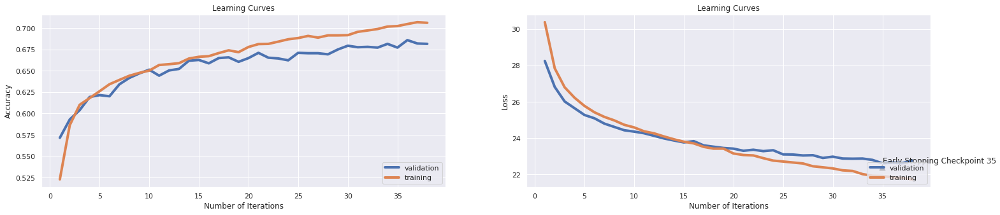

              precision    recall  f1-score
neutral        0.757062  0.754930  0.755994
antivax        0.551282  0.290541  0.380531
provax         0.625000  0.722041  0.670025
macro avg      0.644448  0.589170  0.602184
weighted avg   0.677071  0.681420  0.672596
Accuracy: 0.68142 

Total time: 41.22 seconds
Grid Search: 28, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6017150726089133, 0.6484727090635954, 0.654043565348022, 0.6639959939909865, 0.6616174261392088, 0.6644341512268402, 0.6626189283925888, 0.6682523785678518, 0.6655608412618929]
Validation accuracy scores: [0.6288343558282209, 0.6393514460999123, 0.6476774758983348, 0.6450482033304119, 0.6485539000876425, 0.6533742331288344, 0.6511831726555652, 0.6503067484662577, 0.6476774758983348]
Training f1 scores: [0.5837914539500649, 0.6285612794353226, 0.6336458697329833, 0.6421360513327075, 0.640318795914973, 0.6416321662868157, 0.641186691

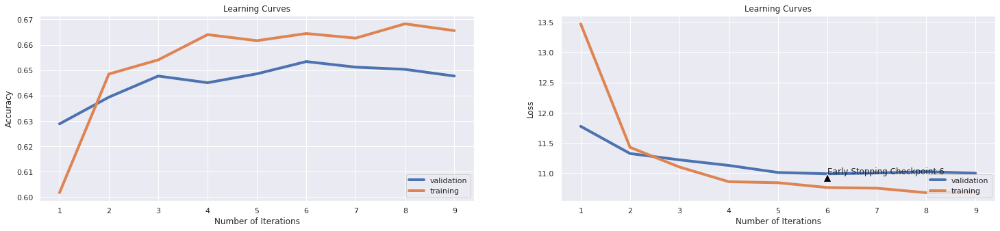

              precision    recall  f1-score
neutral        0.696970  0.755869  0.725225
antivax        0.540230  0.158784  0.245431
provax         0.601923  0.679696  0.638450
macro avg      0.613041  0.531449  0.536369
weighted avg   0.638279  0.647677  0.627969
Accuracy: 0.64768 

Total time: 9.73 seconds
Grid Search: 29, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5091387080620932, 0.5705433149724587, 0.5912618928392589, 0.6057210816224337, 0.614672008012018, 0.6173009514271407, 0.627691537305959, 0.6301326990485728, 0.6345768652979469, 0.6370806209313971, 0.6424011016524788, 0.645405608412619, 0.6460315473209814, 0.6456559839759639, 0.6502879318978467, 0.6555458187280921, 0.6574236354531797, 0.6567976965448172, 0.6553580370555834, 0.660177766649975, 0.6608662994491737, 0.6589884827240862, 0.6608037055583375, 0.6599273910866299, 0.6650600901352028, 0.6668753129694541, 0.6666249374061092, 0.66731347

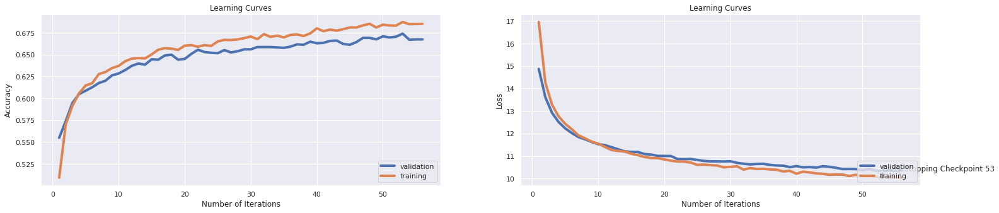

              precision    recall  f1-score
neutral        0.747126  0.732394  0.739687
antivax        0.557692  0.195946  0.290000
provax         0.604056  0.743757  0.666667
macro avg      0.636292  0.557366  0.565451
weighted avg   0.664813  0.667397  0.651887
Accuracy: 0.66740 

Total time: 57.04 seconds
Grid Search: 30, Layers: [75], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5028793189784677, 0.5699799699549324, 0.5912618928392589, 0.6092889334001002, 0.6194291437155733, 0.6309464196294442, 0.6367050575863795, 0.6418377566349525, 0.6482223335002504, 0.6538557836755132, 0.6569228843264897, 0.6591762643965949, 0.663620430645969, 0.6619303955933901, 0.6644967451176765, 0.6680020030045067, 0.671507260891337, 0.6731972959439159, 0.6733224837255883, 0.6771407110665999, 0.6770155232849274, 0.6757636454682023, 0.6810841261892839, 0.6832123184777166, 0.6870305458187281, 0.6845893840761141, 0.6874687030545819, 0.68

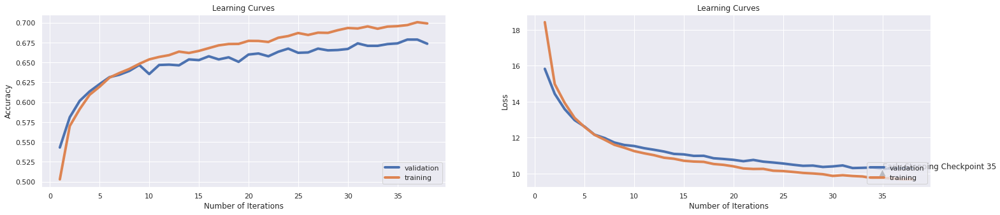

              precision    recall  f1-score
neutral        0.753110  0.738967  0.745972
antivax        0.551471  0.253378  0.347222
provax         0.613079  0.732899  0.667656
macro avg      0.639220  0.575082  0.586950
weighted avg   0.670440  0.673532  0.662642
Accuracy: 0.67353 

Total time: 41.50 seconds
Grid Search: 31, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6293815723585378, 0.6806459689534301, 0.6974837255883826, 0.7099399098647972, 0.721707561342013, 0.7292814221331998, 0.7369804707060591, 0.7368552829243866, 0.7431146720080121, 0.746056584877316]
Validation accuracy scores: [0.6489921121822962, 0.6792287467134093, 0.677475898334794, 0.689307624890447, 0.6954425942156004, 0.6980718667835232, 0.6958808063102542, 0.6914986853637161, 0.6901840490797546, 0.6945661700262927]
Training f1 scores: [0.6139677547683662, 0.6695075224369663, 0.6881042386394987, 0.7022428219351822, 0

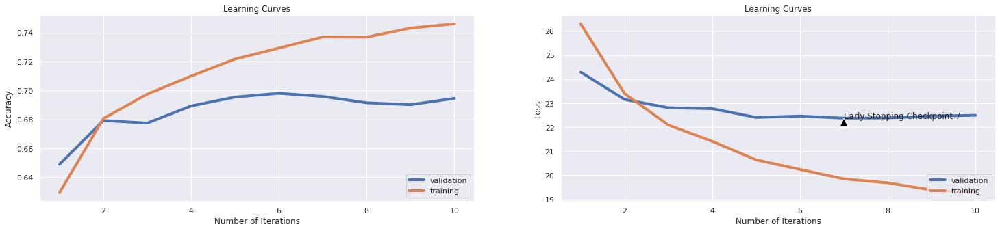

              precision    recall  f1-score
neutral        0.794057  0.727700  0.759432
antivax        0.570513  0.300676  0.393805
provax         0.626957  0.782845  0.696282
macro avg      0.663842  0.603740  0.616506
weighted avg   0.697620  0.694566  0.686519
Accuracy: 0.69457 

Total time: 11.23 seconds
Grid Search: 32, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6131071607411117, 0.6495368052078118, 0.6608037055583375, 0.6736354531797697, 0.6789559339008513, 0.6875312969454181, 0.6921006509764647, 0.6987356034051077, 0.6956685027541312, 0.7026164246369554, 0.7054957436154231, 0.7095017526289434]
Validation accuracy scores: [0.6485539000876425, 0.6520595968448729, 0.6652059596844873, 0.6722173531989483, 0.6730937773882559, 0.677475898334794, 0.6801051709027169, 0.6700262927256793, 0.6822962313759859, 0.6761612620508326, 0.6783523225241017, 0.6840490797546013]
Training f1 scores: [0.58

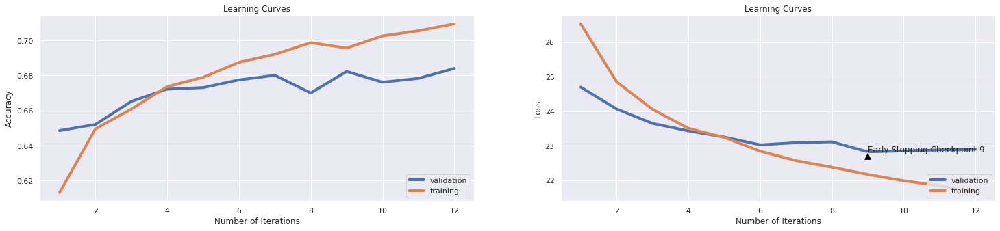

              precision    recall  f1-score
neutral        0.764878  0.736150  0.750239
antivax        0.573529  0.263514  0.361111
provax         0.623550  0.758958  0.684623
macro avg      0.653986  0.586207  0.598658
weighted avg   0.683019  0.684049  0.673283
Accuracy: 0.68405 

Total time: 13.24 seconds
Grid Search: 33, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4828492739108663, 0.5891962944416625, 0.6062218327491237, 0.6140460691036554, 0.6250625938908363, 0.6367676514772158, 0.6372058087130696, 0.6445918878317476, 0.6490986479719579, 0.6536680020030045, 0.6548572859288934, 0.6598022033049574, 0.6623059589384076, 0.6629318978467702, 0.6698172258387581, 0.6718828242363545, 0.674699549323986, 0.6772658988482724, 0.6779544316474712, 0.6780170255383074, 0.6815222834251377, 0.6817100650976464, 0.688470205307962, 0.6861542313470206, 0.6907235853780671, 0.6899098647971958, 0.6924136204

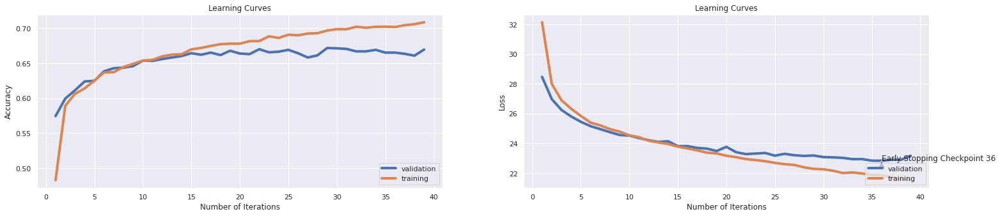

              precision    recall  f1-score
neutral        0.785942  0.692958  0.736527
antivax        0.477941  0.219595  0.300926
provax         0.600663  0.787188  0.681391
macro avg      0.621515  0.566580  0.572948
weighted avg   0.671214  0.669588  0.657772
Accuracy: 0.66959 

Total time: 42.42 seconds
Grid Search: 34, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6333249874812218, 0.6746369554331497, 0.695605908863295, 0.7031171757636455, 0.7152603905858789, 0.7211442163244868, 0.7248372558838257, 0.7259639459188784, 0.7260265398097145, 0.725650976464697, 0.7284051076614922, 0.7295317976965449, 0.7305332999499249]
Validation accuracy scores: [0.6468010517090271, 0.6638913234005258, 0.6726555652936022, 0.6765994741454864, 0.6787905346187555, 0.6801051709027169, 0.6779141104294478, 0.6787905346187555, 0.6752848378615249, 0.6765994741454864, 0.677475898334794, 0.6761612620508326, 0.676599

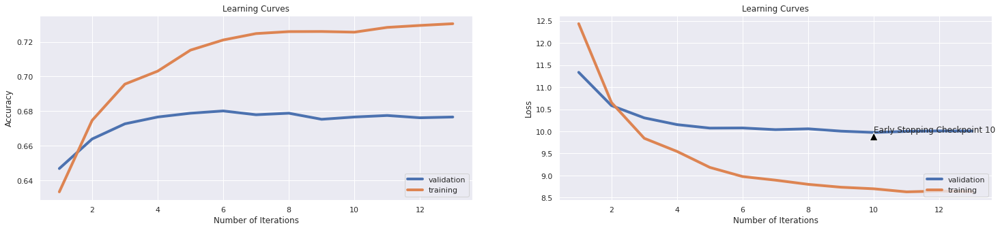

              precision    recall  f1-score
neutral        0.774096  0.723944  0.748180
antivax        0.489474  0.314189  0.382716
provax         0.620438  0.738328  0.674269
macro avg      0.628003  0.592154  0.601722
weighted avg   0.675162  0.676599  0.670946
Accuracy: 0.67660 

Total time: 14.20 seconds
Grid Search: 35, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6002754131196795, 0.6433400100150225, 0.6547946920380571, 0.6639959939909865, 0.6706935403104657, 0.6740736104156234, 0.678392588883325, 0.6851527290936404, 0.6868427641462194, 0.6892839258888332, 0.6898472709063596, 0.6984226339509264, 0.6967325988983475, 0.7038057085628443, 0.7046194291437156, 0.7064972458688032, 0.7092513770655984, 0.7060590886329494]
Validation accuracy scores: [0.6441717791411042, 0.6419807186678352, 0.6555652936021035, 0.6687116564417178, 0.6656441717791411, 0.6656441717791411, 0.6700262927256793, 0.6752848378

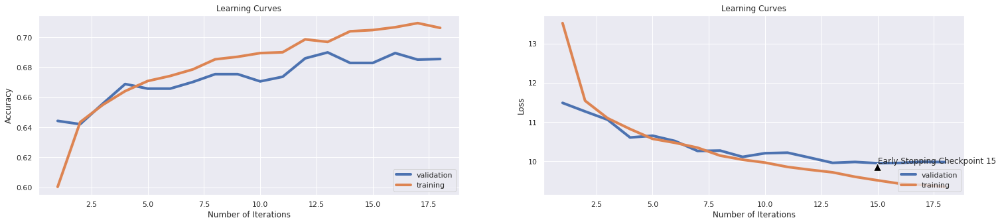

              precision    recall  f1-score
neutral        0.773360  0.730516  0.751328
antivax        0.524096  0.293919  0.376623
provax         0.629730  0.758958  0.688331
macro avg      0.642395  0.594464  0.605427
weighted avg   0.683060  0.685364  0.677299
Accuracy: 0.68536 

Total time: 19.36 seconds
Grid Search: 36, Layers: [75], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4414121181772659, 0.5437531296945418, 0.5789934902353531, 0.5997120681021533, 0.6160490736104156, 0.6276289434151227, 0.6368928392588883, 0.6417125688532799, 0.6491612418627942, 0.6549198798197295, 0.656484727090636, 0.6603029544316474, 0.6626189283925888, 0.6622433650475713, 0.6652478718077116, 0.6718828242363545, 0.6720080120180271, 0.6726965448172258, 0.6748873309964948, 0.6777040560841262, 0.6803955933900852, 0.682336004006009, 0.681334501752629, 0.6862168252378568, 0.6849023535302955, 0.6835252879318978, 0.6870305458187281, 

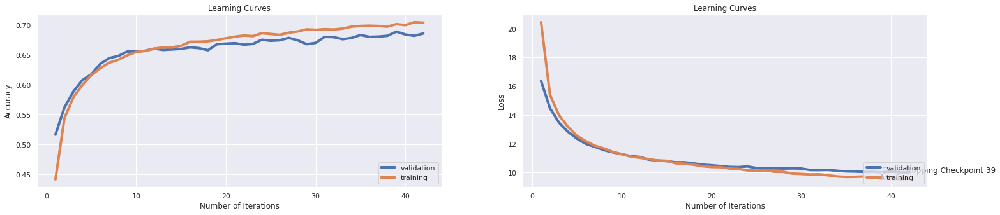

              precision    recall  f1-score
neutral        0.757805  0.752113  0.754948
antivax        0.612245  0.202703  0.304569
provax         0.624667  0.764387  0.687500
macro avg      0.664906  0.573067  0.582339
weighted avg   0.685191  0.685802  0.669307
Accuracy: 0.68580 

Total time: 45.60 seconds
Grid Search: 37, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.4409739609414121, 0.4607536304456685, 0.48122183274912367, 0.49442914371557334, 0.5046319479218828, 0.5205307961942914, 0.5312969454181272, 0.5358037055583375, 0.5441912869303956, 0.5542063094641962, 0.5572108162243365, 0.5609664496745118, 0.5651602403605408, 0.5659739609414122, 0.5725463194792189, 0.5737356034051077, 0.577741612418628, 0.5808087130696044, 0.578242363545318, 0.5791186780170255, 0.5848147220831247, 0.5836254381572359, 0.5871932899349024, 0.5897596394591887, 0.5855658487731598, 0.5934526790185278, 0.592764146219

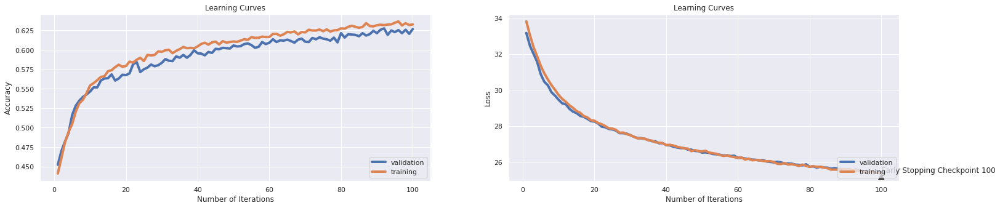

              precision    recall  f1-score
neutral        0.659660  0.766197  0.708949
antivax        0.606061  0.067568  0.121581
provax         0.586957  0.644951  0.614589
macro avg      0.617559  0.492905  0.481706
weighted avg   0.623365  0.626643  0.594678
Accuracy: 0.62664 

Total time: 112.18 seconds
Grid Search: 38, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.41637456184276417, 0.4223209814722083, 0.4227591387080621, 0.42419879819729595, 0.42814221331998, 0.43133450175262894, 0.4374061091637456, 0.43340010015022534, 0.4379694541812719, 0.43652979469203806, 0.44354031046569853, 0.44422884326489737, 0.44998748122183274, 0.44817225838758135, 0.4536179268903355]
Validation accuracy scores: [0.4154250657318142, 0.4189307624890447, 0.4290096406660824, 0.42769500438212094, 0.4364592462751972, 0.4325153374233129, 0.4364592462751972, 0.43470639789658194, 0.436897458369851, 0.4417177914110

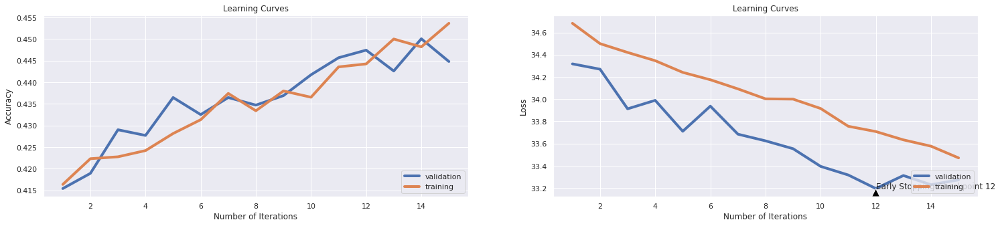

              precision    recall  f1-score
neutral        0.506631  0.717371  0.593859
antivax        0.126354  0.118243  0.122164
provax         0.434608  0.234528  0.304654
macro avg      0.355864  0.356714  0.340226
weighted avg   0.428237  0.444785  0.415954
Accuracy: 0.44479 

Total time: 17.54 seconds
Grid Search: 39, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.34958688032048074, 0.3485227841762644, 0.3569103655483225, 0.35240360540811216]
Validation accuracy scores: [0.35626643295354954, 0.3558282208588957, 0.3593339176161262, 0.35013146362839614]
Training f1 scores: [0.3490005586780866, 0.3494111675754471, 0.357404430816762, 0.3527780422937666]
Validation f1 scores: [0.3523710187938866, 0.3564388633560975, 0.3552403558100639, 0.34895293969034546]
Training losses: [36.90432812690735, 36.8775382938385, 36.83571743965149, 36.85302545928955]
Validation losses: [36.38708260324266, 36.50

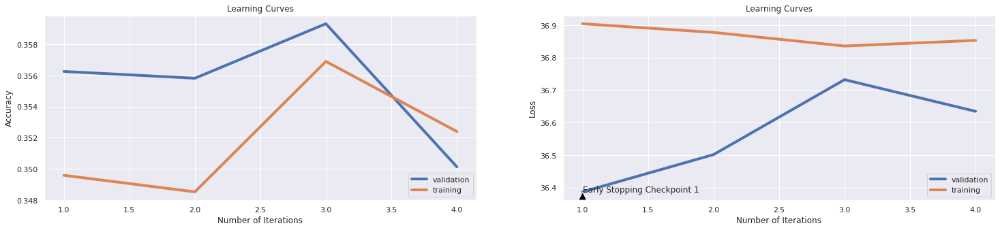

              precision    recall  f1-score
neutral        0.392350  0.337089  0.362626
antivax        0.080537  0.081081  0.080808
provax         0.389149  0.451683  0.418090
macro avg      0.287345  0.289951  0.287175
weighted avg   0.350612  0.350131  0.348456
Accuracy: 0.35013 

Total time: 5.13 seconds
Grid Search: 40, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.33005758637956933, 0.3443915873810716, 0.361229344016024, 0.3793815723585378, 0.3923385077616425, 0.4061717576364547, 0.4187531296945418, 0.43064596895343016, 0.44591887831747623, 0.4541812719078618, 0.4693289934902354, 0.47784176264396594, 0.4820981472208313, 0.48935903855783675, 0.49787180771156736, 0.4995618427641462, 0.5102653980971458, 0.5128943415122684, 0.5217826740110165, 0.5234727090635954, 0.528292438657987, 0.5298572859288934, 0.5364296444667, 0.5368052078117176, 0.5416875312969455, 0.5422508763144717, 0.5454431647471207, 0

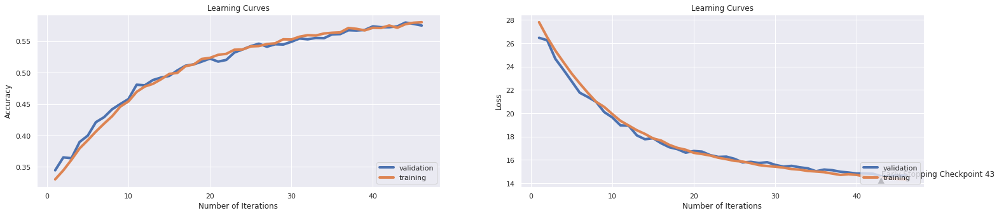

              precision    recall  f1-score
neutral        0.629260  0.710798  0.667549
antivax        0.243902  0.033784  0.059347
provax         0.525048  0.591748  0.556406
macro avg      0.466070  0.445443  0.427767
weighted avg   0.537216  0.574934  0.543802
Accuracy: 0.57493 

Total time: 51.49 seconds
Grid Search: 41, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.26671256885327993, 0.2726589884827241, 0.2700300450676014, 0.2717200801201803, 0.2722208312468703, 0.27366049073610416, 0.2793565348022033, 0.2796069103655483, 0.27722834251377065, 0.28110916374561845, 0.282486229344016, 0.2839258888332499, 0.2888082123184777, 0.28893340010015023, 0.2943164747120681, 0.2911241862794191, 0.29688282423635454, 0.29863545317976964, 0.2983224837255884, 0.2993239859789685, 0.3029544316474712, 0.30408112168252377, 0.3048948422633951, 0.310778668002003, 0.30896344516775165, 0.3126564847270906, 0.31791437155

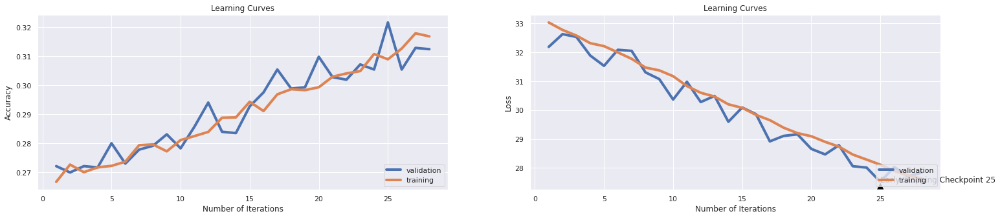

              precision    recall  f1-score
neutral        0.514066  0.188732  0.276099
antivax        0.145897  0.486486  0.224474
provax         0.407080  0.399566  0.403288
macro avg      0.355681  0.358262  0.301287
weighted avg   0.423132  0.312445  0.320735
Accuracy: 0.31245 

Total time: 31.72 seconds
Grid Search: 42, Layers: [75], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.314471707561342, 0.317663995993991, 0.3182899349023535, 0.3155983975963946, 0.31816474712068105, 0.31910365548322484, 0.3197921882824236]
Validation accuracy scores: [0.3168273444347064, 0.3067484662576687, 0.31463628396143734, 0.32077125328659073, 0.31901840490797545, 0.3067484662576687, 0.3058720420683611]
Training f1 scores: [0.32625710854627976, 0.32841267996210716, 0.3295501502640846, 0.32713968658871645, 0.32834422861078266, 0.32990249312918024, 0.33239943711839115]
Validation f1 scores: [0.3245744918679285, 0.31164319130590057

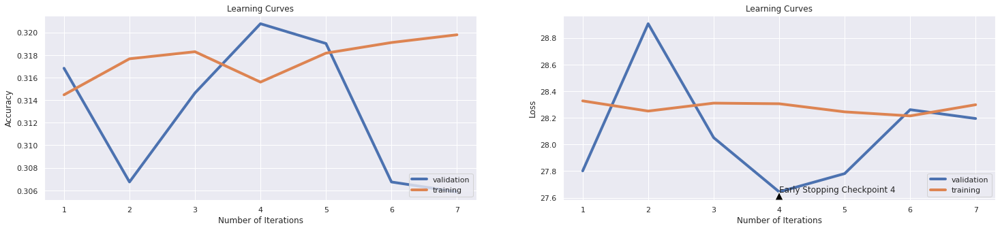

              precision    recall  f1-score
neutral        0.488844  0.452582  0.470015
antivax        0.114851  0.391892  0.177642
provax         0.349650  0.108578  0.165700
macro avg      0.317782  0.317684  0.271119
weighted avg   0.384155  0.305872  0.309271
Accuracy: 0.30587 

Total time: 8.58 seconds
Grid Search: 43, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6293189784677016, 0.6743239859789685, 0.686029043565348, 0.6959814722083125, 0.7026164246369554, 0.7142588883324987, 0.7192663995993991, 0.724148723084627, 0.7278417626439659, 0.7334752128192289]
Validation accuracy scores: [0.6625766871165644, 0.6625766871165644, 0.6783523225241017, 0.6748466257668712, 0.6853637160385626, 0.6752848378615249, 0.6875547765118317, 0.6901840490797546, 0.6809815950920245, 0.6897458369851008]
Training f1 scores: [0.6044949709252325, 0.658149433759252, 0.6726122798824105, 0.6858257804139337, 0.6927446278

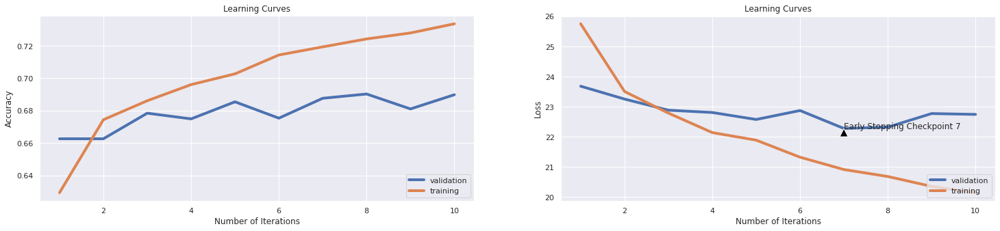

              precision    recall  f1-score
neutral        0.752747  0.771831  0.762170
antivax        0.517766  0.344595  0.413793
provax         0.654582  0.705755  0.679206
macro avg      0.641699  0.607393  0.618390
weighted avg   0.682649  0.689746  0.683498
Accuracy: 0.68975 

Total time: 11.82 seconds
Grid Search: 44, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.521907861792689, 0.6067225838758137, 0.6269404106159239, 0.6391462193289935, 0.6490986479719579, 0.6514772158237356, 0.6599273910866299, 0.6588007010515774, 0.6642463695543315, 0.667563845768653, 0.6721957936905358, 0.6735728592889334, 0.6720706059088633, 0.6806459689534301, 0.6772658988482724, 0.6805833750625939, 0.685027541311968, 0.6855908863294943, 0.6849023535302955, 0.6877190786179269, 0.6905983975963946, 0.6911617426139208, 0.693665498247371, 0.6935403104656985, 0.6990485728592889, 0.6986104156234352, 0.6981096644967452, 0

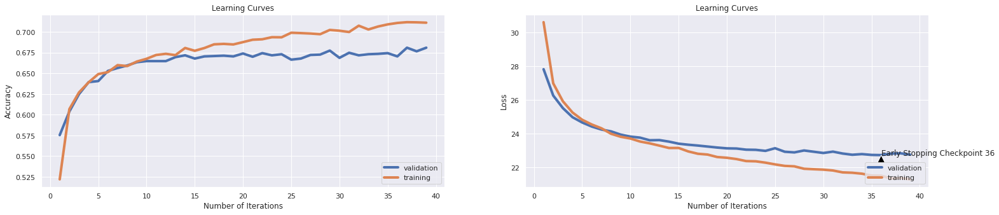

              precision    recall  f1-score
neutral        0.774194  0.721127  0.746719
antivax        0.547059  0.314189  0.399142
provax         0.618750  0.752443  0.679079
macro avg      0.646667  0.595920  0.608313
weighted avg   0.681996  0.680982  0.674335
Accuracy: 0.68098 

Total time: 44.23 seconds
Grid Search: 45, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.38276164246369554, 0.3877691537305959, 0.3898347521281923, 0.39071106659989985, 0.3942163244867301, 0.39909864797195793, 0.3987230846269404, 0.40272909364046067, 0.40604656985478216, 0.407486229344016, 0.40855032548823234, 0.41318227341011515, 0.41599899849774663, 0.42038057085628444, 0.42419879819729595, 0.4253880821231848, 0.4273910866299449, 0.4315222834251377, 0.4315222834251377, 0.4358412618928393, 0.43847020530796194, 0.4411617426139209, 0.4452303455182774, 0.4484226339509264, 0.44929894842263396, 0.4507386079118678, 0.45655

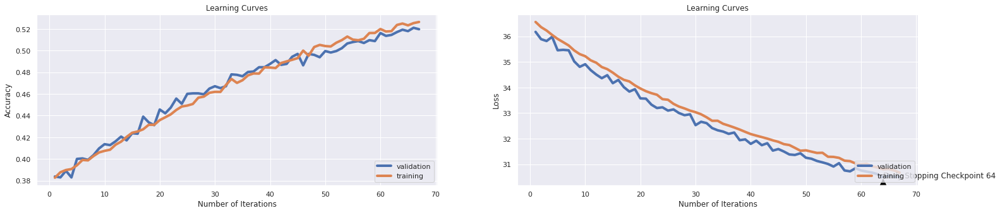

              precision    recall  f1-score
neutral        0.572664  0.621596  0.596128
antivax        0.227273  0.016892  0.031447
provax         0.470109  0.563518  0.512593
macro avg      0.423349  0.400669  0.380056
weighted avg   0.486473  0.519720  0.489168
Accuracy: 0.51972 

Total time: 75.11 seconds
Grid Search: 46, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.5979594391587381, 0.6647471206810215, 0.6810215322984476, 0.6951051577366049, 0.7058087130696044, 0.7109414121181773, 0.7147596394591887, 0.7215823735603405, 0.7239609414121182, 0.7315348022033049, 0.7356659989984977, 0.7373560340510766, 0.7418002003004507]
Validation accuracy scores: [0.6419807186678352, 0.6581945661700263, 0.6656441717791411, 0.6761612620508326, 0.6792287467134093, 0.6779141104294478, 0.6744084136722174, 0.6805433829973707, 0.6897458369851008, 0.6906222611744084, 0.6945661700262927, 0.686678352322524, 0.687992988606485

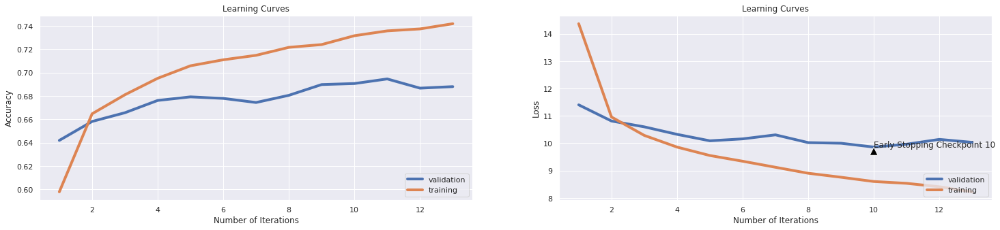

              precision    recall  f1-score
neutral        0.769306  0.738967  0.753831
antivax        0.527397  0.260135  0.348416
provax         0.634322  0.766558  0.694199
macro avg      0.643675  0.588553  0.598815
weighted avg   0.683449  0.687993  0.677177
Accuracy: 0.68799 

Total time: 14.83 seconds
Grid Search: 47, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.4690786179268903, 0.5834376564847271, 0.6052829243865798, 0.6195543314972458, 0.6352653980971458, 0.6442789183775663, 0.6518527791687532, 0.6566099148723085, 0.6646845267901853, 0.6674386579869804, 0.6700676014021032, 0.671507260891337, 0.6735728592889334, 0.6785803705558338, 0.6812719078617927, 0.6859664496745118, 0.685528292438658, 0.6877190786179269, 0.6895343014521783, 0.6888457686529794, 0.6946044066099148, 0.6952303455182774, 0.6991737606409615, 0.7001126690035052, 0.6991737606409615, 0.6968577866800201, 0.7003630445668503, 0.7034

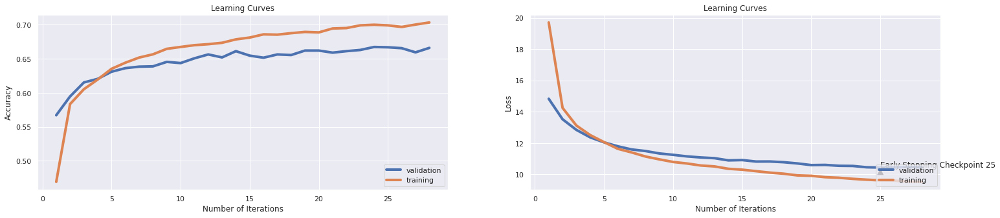

              precision    recall  f1-score
neutral        0.727683  0.757746  0.742410
antivax        0.524138  0.256757  0.344671
provax         0.619650  0.691640  0.653669
macro avg      0.623823  0.568714  0.580250
weighted avg   0.657679  0.666082  0.655004
Accuracy: 0.66608 

Total time: 31.66 seconds
Grid Search: 48, Layers: [75], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.30301702553830745, 0.30533299949924886, 0.30589634451677516, 0.31127941912869306, 0.31290686029043563, 0.31728843264897344, 0.3186029043565348, 0.3243615423134702, 0.3258637956935403, 0.32886830245368054, 0.33375062593890836, 0.3379444166249374, 0.33731847771657486, 0.34526790185277917, 0.3465823735603405, 0.35108913370055084, 0.3537806710065098, 0.3568477716574862, 0.36285678517776665, 0.36310716074111166, 0.36874061091637456, 0.36642463695543315, 0.3706810215322984, 0.3796319479218828]
Validation accuracy scores: [0.2992988606485539, 0

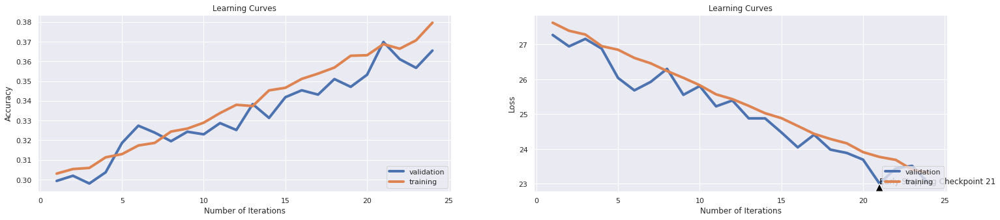

              precision    recall  f1-score
neutral        0.540340  0.477934  0.507225
antivax        0.137931  0.432432  0.209150
provax         0.478155  0.213898  0.295574
macro avg      0.385475  0.374755  0.337316
weighted avg   0.463046  0.365469  0.383140
Accuracy: 0.36547 

Total time: 27.04 seconds
Grid Search: 49, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6329494241362043, 0.6512894341512269, 0.6563595393089634, 0.6574236354531797, 0.6588632949424136, 0.66092889334001, 0.664121181772659, 0.6628693039559339, 0.6619303955933901, 0.664121181772659, 0.665122684026039, 0.6631822734101152]
Validation accuracy scores: [0.6454864154250657, 0.6555652936021035, 0.6546888694127958, 0.6555652936021035, 0.6590709903593339, 0.6577563540753725, 0.6573181419807187, 0.6586327782646801, 0.6560035056967572, 0.6568799298860648, 0.6551270815074496, 0.6555652936021035]
Training f1 scores: [0.

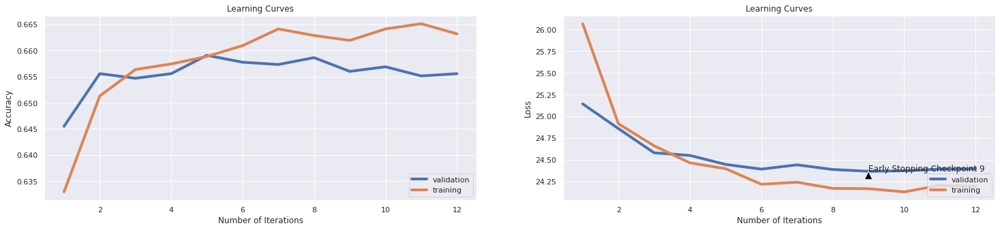

              precision    recall  f1-score
neutral        0.720188  0.720188  0.720188
antivax        0.523438  0.226351  0.316038
provax         0.607897  0.718784  0.658706
macro avg      0.617174  0.555108  0.564977
weighted avg   0.649347  0.655565  0.642952
Accuracy: 0.65557 

Total time: 14.91 seconds
Grid Search: 50, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5774286429644466, 0.6274411617426139, 0.6388332498748123, 0.6439033550325488, 0.644904857285929, 0.6500375563345018, 0.6506009013520281, 0.6509138708062093, 0.6519779669504256, 0.6527290936404607, 0.6566099148723085, 0.6553580370555834, 0.6551076614922383, 0.6565473209814722, 0.6608037055583375, 0.6607411116675013, 0.6589258888332499, 0.6605533299949925, 0.6599899849774662, 0.6653104656985478, 0.6592388582874311, 0.6639959939909865, 0.6630570856284427, 0.6657486229344016, 0.6642463695543315, 0.6687531296945418, 0.667501251877

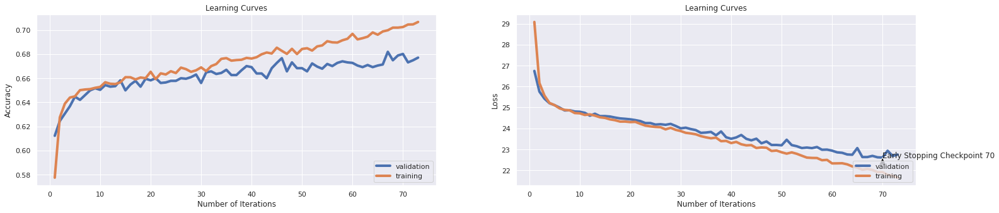

              precision    recall  f1-score
neutral        0.754468  0.753052  0.753759
antivax        0.590164  0.243243  0.344498
provax         0.611668  0.728556  0.665015
macro avg      0.652100  0.574950  0.587757
weighted avg   0.675523  0.677038  0.664857
Accuracy: 0.67704 

Total time: 86.31 seconds
Grid Search: 51, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5169629444166249, 0.6189909864797196, 0.6374561842764146, 0.6439659489233851, 0.650350525788683, 0.6521657486229344, 0.6515398097145718, 0.6494116174261392, 0.6548572859288934, 0.6547320981472209, 0.6551076614922383, 0.6578617926890336, 0.6558587881822734, 0.6586129193790686, 0.6589884827240862, 0.6577991987981973, 0.6636830245368052, 0.6631822734101152, 0.6670005007511267, 0.6708813219829745, 0.6682523785678518, 0.6736980470706059, 0.6676890335503255, 0.6718828242363545, 0.6763269904857286, 0.6780170255383074, 0.685027541

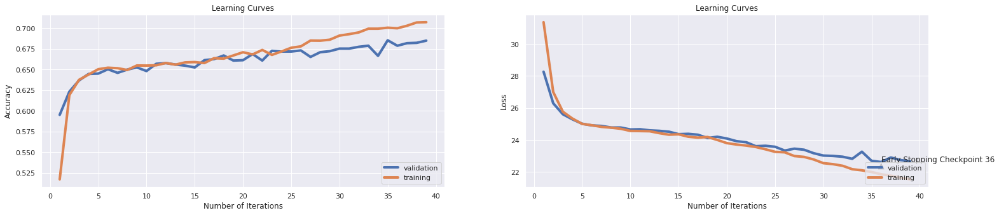

              precision    recall  f1-score
neutral        0.764479  0.743662  0.753927
antivax        0.529070  0.307432  0.388889
provax         0.633147  0.738328  0.681704
macro avg      0.642232  0.596474  0.608173
weighted avg   0.680939  0.684926  0.677429
Accuracy: 0.68493 

Total time: 48.93 seconds
Grid Search: 52, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6228092138207311, 0.6487856785177767, 0.6541061592388583, 0.6568602904356535, 0.6628067100650976, 0.6581121682523786, 0.6624937406109164, 0.6639334001001502, 0.6656860290435653]
Validation accuracy scores: [0.6384750219106047, 0.6419807186678352, 0.656441717791411, 0.6546888694127958, 0.6551270815074496, 0.6498685363716039, 0.6516213847502191, 0.6551270815074496, 0.6524978089395267]
Training f1 scores: [0.5996634007527115, 0.6235949771057329, 0.626725042246564, 0.6290371678458154, 0.636261017044412, 0.6307590995794564, 0.63644

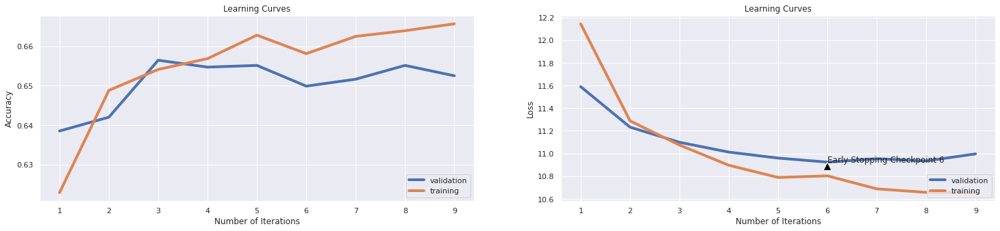

              precision    recall  f1-score
neutral        0.690516  0.779343  0.732245
antivax        0.620000  0.104730  0.179191
provax         0.609709  0.681868  0.643772
macro avg      0.640075  0.521980  0.518403
weighted avg   0.648756  0.652498  0.624801
Accuracy: 0.65250 

Total time: 11.32 seconds
Grid Search: 53, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.600150225338007, 0.640272909364046, 0.6435277916875313, 0.6469704556835253, 0.6462819228843265, 0.6512268402603906, 0.6490360540811216, 0.6519779669504256, 0.653793189784677, 0.6554206309464197, 0.6526664997496244, 0.6558587881822734, 0.656484727090636, 0.6566099148723085]
Validation accuracy scores: [0.6301489921121823, 0.6411042944785276, 0.6415425065731815, 0.6305872042068361, 0.6389132340052586, 0.6406660823838738, 0.64022787028922, 0.647239263803681, 0.6415425065731815, 0.6463628396143734, 0.6524978089395267, 0.6511831726555652

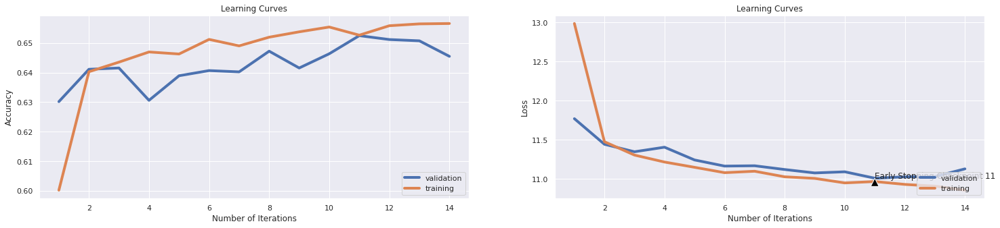

              precision    recall  f1-score
neutral        0.695090  0.757746  0.725067
antivax        0.644444  0.097973  0.170088
provax         0.592007  0.691640  0.637957
macro avg      0.643847  0.515786  0.511037
weighted avg   0.646917  0.645486  0.617923
Accuracy: 0.64549 

Total time: 16.72 seconds
Grid Search: 54, Layers: [220, 90], Optimizer: SGD, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5475087631447171, 0.6268778167250876, 0.6375187781672509, 0.6429018527791688, 0.6475963945918878, 0.6497245868803205, 0.6511016524787181, 0.6536680020030045, 0.6554832248372559, 0.654043565348022, 0.6591136705057586, 0.6615548322483725, 0.6614922383575363, 0.6634326489734602, 0.6637456184276415, 0.6633700550826239, 0.6681897846770155, 0.6683775663495243, 0.6739484226339509, 0.6731972959439159, 0.6741362043064597, 0.6770155232849274, 0.6769529293940911, 0.6830245368052078, 0.6827741612418627, 0.6844641962944417, 0.6902854281422133

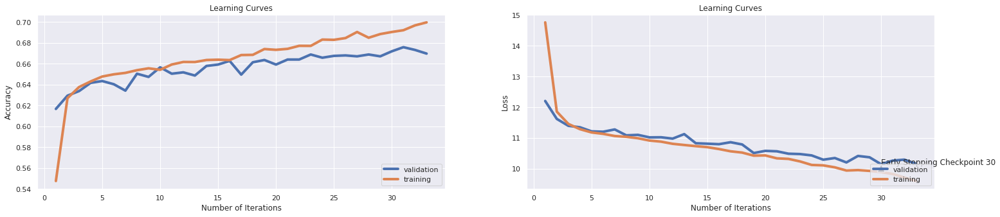

              precision    recall  f1-score
neutral        0.747180  0.746479  0.746829
antivax        0.508475  0.202703  0.289855
provax         0.611818  0.730727  0.666007
macro avg      0.622491  0.559970  0.567564
weighted avg   0.661586  0.669588  0.654936
Accuracy: 0.66959 

Total time: 40.79 seconds
Grid Search: 55, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6208688032048072, 0.654043565348022, 0.6694416624937406, 0.6777040560841262, 0.6872183274912369, 0.6941036554832248, 0.6939784677015524, 0.7022408612919379, 0.7035553329994992, 0.700550826239359, 0.704243865798698, 0.7036805207811717, 0.7061842764146219, 0.7041812719078618, 0.7062468703054582, 0.7044316474712068, 0.704243865798698]
Validation accuracy scores: [0.6454864154250657, 0.6586327782646801, 0.6529360210341806, 0.6700262927256793, 0.670464504820333, 0.6757230499561788, 0.6787905346187555, 0.6765994741454864

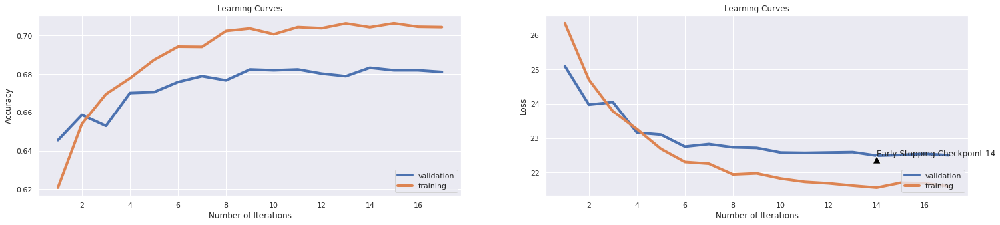

              precision    recall  f1-score
neutral        0.766019  0.740845  0.753222
antivax        0.515152  0.287162  0.368764
provax         0.625575  0.738328  0.677291
macro avg      0.635582  0.588778  0.599759
weighted avg   0.676797  0.680982  0.672708
Accuracy: 0.68098 

Total time: 21.67 seconds
Grid Search: 56, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6286304456685028, 0.6492238357536304, 0.6519779669504256, 0.6562343515272909, 0.6575488232348523, 0.6657486229344016, 0.6691912869303956, 0.6731347020530796, 0.675200300450676, 0.6817726589884827, 0.6855908863294943, 0.6882198297446169, 0.6924762143214822, 0.6945418127190787, 0.6980470706059089, 0.6987356034051077, 0.6991737606409615, 0.7056209313970957]
Validation accuracy scores: [0.6441717791411042, 0.6485539000876425, 0.6463628396143734, 0.6555652936021035, 0.6665205959684487, 0.6581945661700263, 0.6603856266432954, 

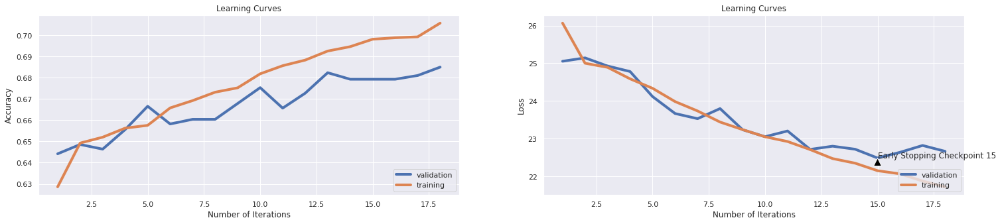

              precision    recall  f1-score
neutral        0.765504  0.741784  0.753457
antivax        0.526316  0.304054  0.385439
provax         0.632994  0.741585  0.683000
macro avg      0.641604  0.595808  0.607299
weighted avg   0.680998  0.684926  0.677285
Accuracy: 0.68493 

Total time: 22.79 seconds
Grid Search: 57, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5344892338507762, 0.6194291437155733, 0.6350150225338007, 0.6417125688532799, 0.6500375563345018, 0.6506634952428643, 0.650851276915373, 0.6485353029544316, 0.6534176264396595, 0.6528542814221332, 0.6556084126189284, 0.6577366049073611, 0.6594266399599399, 0.6582999499248874, 0.6606159238858288, 0.664121181772659, 0.6615548322483725, 0.6598022033049574, 0.6649349023535303, 0.6659364046069104, 0.6728843264897346, 0.6711316975463195, 0.6711942914371557, 0.6777040560841262, 0.674949924887331, 0.6777040560841262, 0.676014

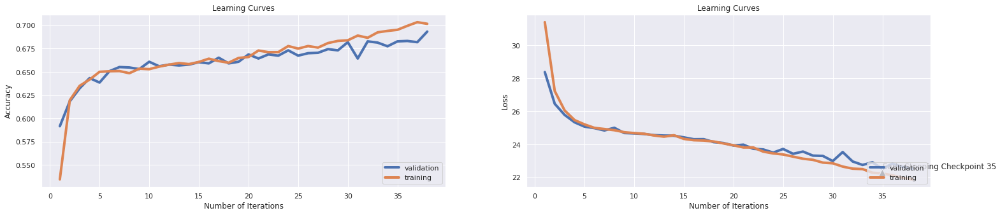

              precision    recall  f1-score
neutral        0.748879  0.784038  0.766055
antivax        0.538922  0.304054  0.388769
provax         0.657000  0.713355  0.684019
macro avg      0.648267  0.600482  0.612948
weighted avg   0.684564  0.693252  0.684008
Accuracy: 0.69325 

Total time: 50.66 seconds
Grid Search: 58, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6224962443665498, 0.6534176264396595, 0.6645593390085127, 0.671757636454682, 0.6801452178267401, 0.6808337506259389, 0.681584877315974, 0.6849649474211317, 0.6852779168753129, 0.6890961442163245, 0.6904106159238859, 0.6907861792689034, 0.6894091136705057, 0.6890961442163245]
Validation accuracy scores: [0.6240140227870289, 0.6538124452234881, 0.654250657318142, 0.6652059596844873, 0.663453111305872, 0.6691498685363716, 0.6713409290096407, 0.6730937773882559, 0.6722173531989483, 0.6735319894829097, 0.6713409290096407, 0.67

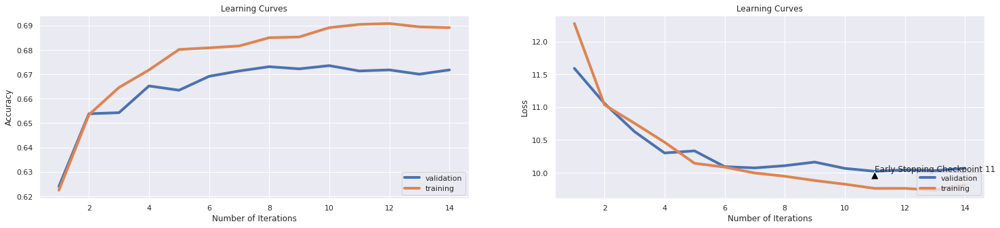

              precision    recall  f1-score
neutral        0.781120  0.707042  0.742238
antivax        0.516949  0.206081  0.294686
provax         0.599167  0.780673  0.677982
macro avg      0.632412  0.564599  0.571635
weighted avg   0.673419  0.671779  0.658252
Accuracy: 0.67178 

Total time: 18.06 seconds
Grid Search: 59, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.628442663995994, 0.6442789183775663, 0.6469704556835253, 0.6557336004006009, 0.6607411116675013, 0.668565348022033, 0.6654356534802204, 0.671757636454682, 0.6726339509263896, 0.6768903355032548, 0.6816474712068102, 0.6861542313470206, 0.6830245368052078, 0.6866549824737106, 0.6921006509764647, 0.6938532799198798, 0.6985478217325989, 0.6996745117676515, 0.7045568352528793, 0.7058713069604406, 0.7051827741612419, 0.7091887831747622, 0.7111291937906861, 0.7119429143715573]
Validation accuracy scores: [0.6240140227870289, 0.6406660

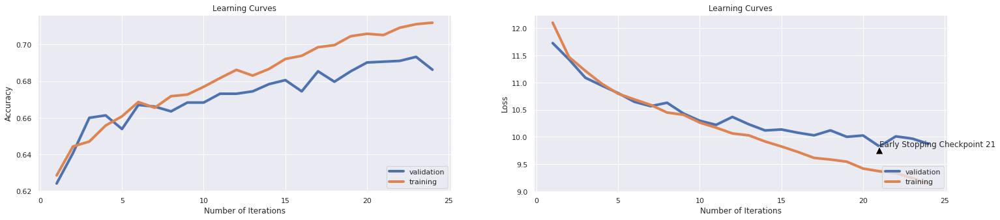

              precision    recall  f1-score
neutral        0.792670  0.710798  0.749505
antivax        0.506787  0.378378  0.433269
provax         0.630199  0.756786  0.687716
macro avg      0.643219  0.615321  0.623497
weighted avg   0.690016  0.686240  0.683548
Accuracy: 0.68624 

Total time: 30.06 seconds
Grid Search: 60, Layers: [220, 90], Optimizer: Nesterov, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5664747120681022, 0.636079118678017, 0.6477841762643965, 0.6478467701552328, 0.6499123685528292, 0.6504131196795193, 0.6527290936404607, 0.6557336004006009, 0.657486229344016, 0.657986980470706, 0.6561091637456185, 0.6590510766149223, 0.6646845267901853, 0.6659989984977466, 0.6633700550826239, 0.6706309464196294]
Validation accuracy scores: [0.6327782646801051, 0.635407537248028, 0.6358457493426819, 0.6432953549517967, 0.6419807186678352, 0.6498685363716039, 0.6533742331288344, 0.6481156879929886, 0.6463628396143734, 0.65030

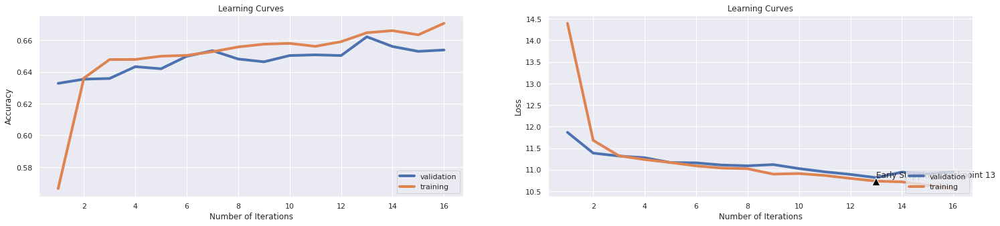

              precision    recall  f1-score
neutral        0.728230  0.714554  0.721327
antivax        0.686275  0.118243  0.201729
provax         0.586847  0.755700  0.660655
macro avg      0.667117  0.529499  0.527904
weighted avg   0.665726  0.653812  0.629443
Accuracy: 0.65381 

Total time: 20.88 seconds
Grid Search: 61, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.46976715072608916, 0.5470706059088633, 0.5761767651477215, 0.5931397095643465, 0.6017150726089133, 0.6066599899849775, 0.6092889334001002, 0.6162994491737607, 0.6181772658988482, 0.6189909864797196, 0.6234351527290937, 0.6237481221832749, 0.6273785678517777, 0.62449924887331, 0.6268778167250876, 0.6278167250876314, 0.6330746119178768, 0.6347020530796195, 0.6320731096644967, 0.6353905858788182, 0.6369554331497246, 0.6371432148222334, 0.6362669003505258, 0.6392088132198297, 0.6397095643465198, 0.6413370055082624, 0.63927140

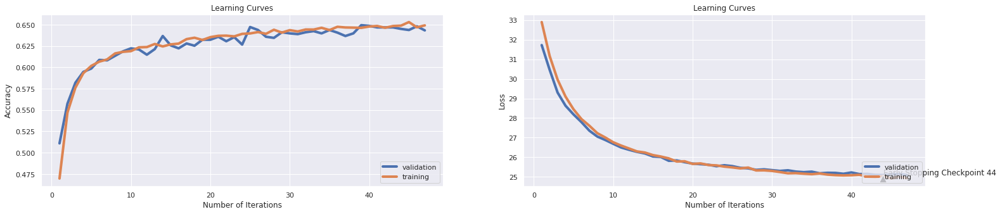

              precision    recall  f1-score
neutral        0.682540  0.767136  0.722370
antivax        0.519608  0.179054  0.266332
provax         0.608342  0.649294  0.628151
macro avg      0.603496  0.531828  0.538951
weighted avg   0.631460  0.643295  0.625191
Accuracy: 0.64330 

Total time: 65.70 seconds
Grid Search: 62, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.2507511266900351, 0.2625813720580871, 0.27666499749624435, 0.28818227341011515, 0.30057586379569357, 0.31810215322984475, 0.33393840761141713, 0.34720831246870304, 0.3636079118678017, 0.3847020530796194, 0.40047571357035555, 0.41731347020530796, 0.4292063094641963, 0.4430395593390085, 0.45643465197796695, 0.471707561342013, 0.4850400600901352, 0.4950550826239359, 0.49981221832749123, 0.5098272408612919, 0.5180896344516775, 0.5264772158237356, 0.5347396094141211, 0.5369303955933901, 0.5438783174762143, 0.5458813219829745,

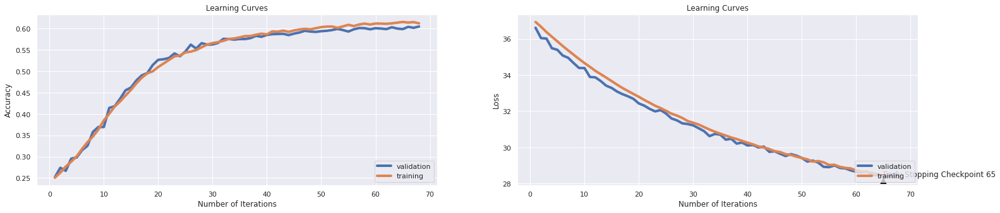

              precision    recall  f1-score
neutral        0.639618  0.754930  0.692506
antivax        0.398601  0.192568  0.259681
provax         0.588435  0.563518  0.575707
macro avg      0.542218  0.503672  0.509298
weighted avg   0.587699  0.604733  0.589225
Accuracy: 0.60473 

Total time: 94.64 seconds
Grid Search: 63, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.3205433149724587, 0.32141962944416624, 0.32085628442663994, 0.3243615423134702, 0.32085628442663994, 0.3203555332999499]
Validation accuracy scores: [0.31638913234005256, 0.3133216476774759, 0.31814198071866784, 0.31638913234005256, 0.31814198071866784, 0.3172655565293602]
Training f1 scores: [0.33453931789947455, 0.33329981275545373, 0.3343464147501841, 0.33803451418831865, 0.33432644406283657, 0.33201662827958356]
Validation f1 scores: [0.32610760622007745, 0.3214482199355006, 0.3274037634444165, 0.3232374027443325, 0.3

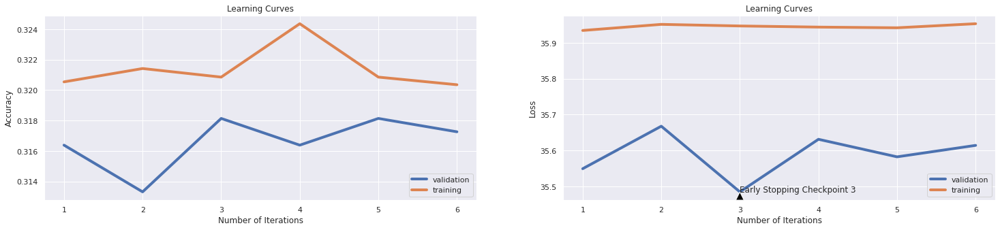

              precision    recall  f1-score
neutral        0.463212  0.419718  0.440394
antivax        0.143583  0.381757  0.208680
provax         0.309434  0.178067  0.226051
macro avg      0.305410  0.326514  0.291708
weighted avg   0.359689  0.317266  0.323831
Accuracy: 0.31727 

Total time: 9.03 seconds
Grid Search: 64, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.3430771156735103, 0.44767150726089133, 0.5176514772158237, 0.5594641962944417, 0.5829994992488733, 0.5937030545818728, 0.6115423134702053, 0.6171757636454682, 0.6253129694541812, 0.6221832749123686, 0.6264396594892339, 0.6328868302453681, 0.6309464196294442, 0.6318227341011518, 0.6335753630445669, 0.6358913370055083, 0.639521782674011, 0.6378943415122684, 0.6401477215823735, 0.640272909364046, 0.6399599399098648, 0.6418377566349525, 0.6414621932899349, 0.6451552328492739, 0.6433400100150225, 0.6438407611417125, 0.6455933900851277

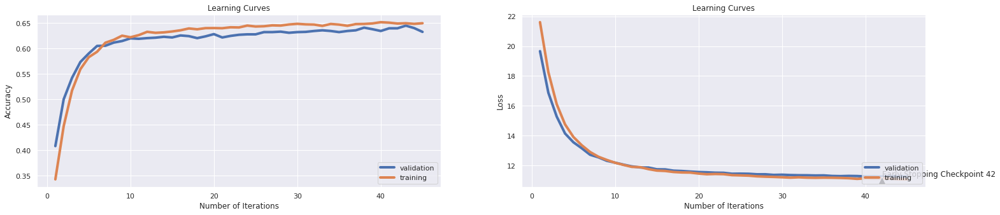

              precision    recall  f1-score
neutral        0.686851  0.745540  0.714993
antivax        0.684211  0.043919  0.082540
provax         0.575429  0.691640  0.628205
macro avg      0.648830  0.493699  0.475246
weighted avg   0.641539  0.632778  0.597930
Accuracy: 0.63278 

Total time: 62.61 seconds
Grid Search: 65, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.42864296444667, 0.4427265898848272, 0.4514271407110666, 0.4619429143715573, 0.4713319979969955, 0.48097145718577866, 0.4968703054581873, 0.5003755633450175, 0.5110165247871807, 0.5176514772158237, 0.5242238357536304, 0.5321106659989985, 0.5402478718077116, 0.5421256885327992, 0.5506384576865297, 0.5518903355032548, 0.5555207811717576, 0.5640961442163245, 0.5589634451677516, 0.5689784677015524, 0.5692914371557336, 0.5717325988983475, 0.5749874812218327, 0.5749248873309964, 0.5793690535803706, 0.5817476214321482, 0.58493990986479

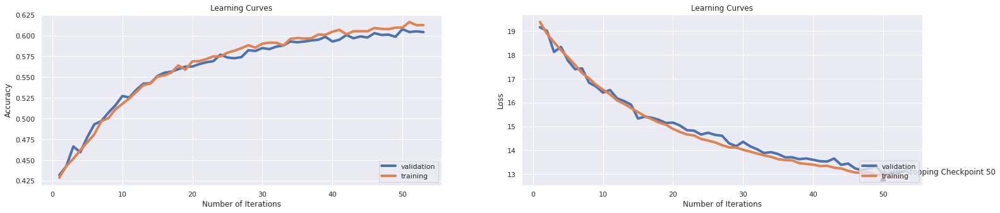

              precision    recall  f1-score
neutral        0.683852  0.660094  0.671763
antivax        0.408451  0.097973  0.158038
provax         0.546915  0.702497  0.615019
macro avg      0.546406  0.486855  0.481607
weighted avg   0.592863  0.604294  0.582226
Accuracy: 0.60429 

Total time: 72.73 seconds
Grid Search: 66, Layers: [220, 90], Optimizer: Adadelta, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.35184026039058586, 0.3512769153730596, 0.3558462694041062, 0.3547821732598898, 0.3502754131196795]
Validation accuracy scores: [0.35013146362839614, 0.35276073619631904, 0.35056967572305, 0.35188431200701137, 0.3540753724802805]
Training f1 scores: [0.3767960557315043, 0.37567615364499307, 0.3812684418192491, 0.37986106406748754, 0.37513810394304686]
Validation f1 scores: [0.3716561327462978, 0.37457873405365477, 0.36947750091462983, 0.3737860011282421, 0.3676549296563377]
Training losses: [21.939910580635072, 21.923614959716797

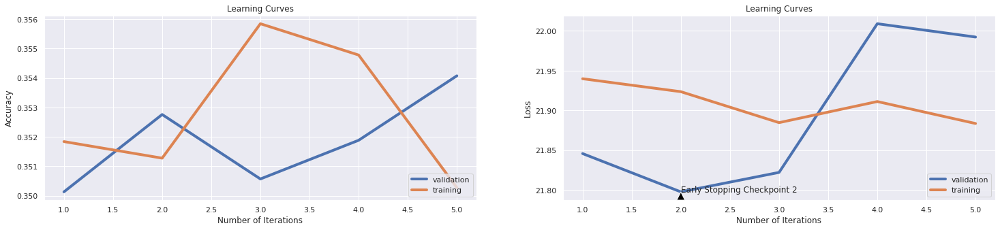

              precision    recall  f1-score
neutral        0.495379  0.251643  0.333748
antivax        0.121569  0.314189  0.175306
provax         0.457992  0.485342  0.471270
macro avg      0.358313  0.350391  0.326775
weighted avg   0.431803  0.354075  0.368700
Accuracy: 0.35408 

Total time: 7.61 seconds
Grid Search: 67, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6314471707561342, 0.6600525788683025, 0.6699424136204306, 0.6750125187781673, 0.6806459689534301, 0.6915998998497747, 0.6988607911867801, 0.700050075112669, 0.7040560841261893, 0.7051827741612419, 0.7090010015022534]
Validation accuracy scores: [0.6463628396143734, 0.6560035056967572, 0.6643295354951797, 0.6739702015775635, 0.670464504820333, 0.6752848378615249, 0.6787905346187555, 0.6853637160385626, 0.6726555652936022, 0.6831726555652936, 0.6875547765118317]
Training f1 scores: [0.6156988988823634, 0.644760330143876, 0.65726

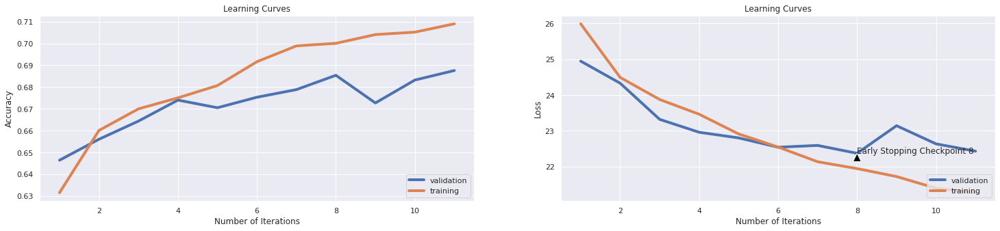

              precision    recall  f1-score
neutral        0.767754  0.751174  0.759374
antivax        0.585366  0.243243  0.343675
provax         0.623993  0.756786  0.684004
macro avg      0.659038  0.583734  0.595684
weighted avg   0.686075  0.687555  0.675034
Accuracy: 0.68755 

Total time: 15.70 seconds
Grid Search: 68, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.621557336004006, 0.6473460190285428, 0.6509764646970456, 0.6502879318978467, 0.6555458187280921, 0.6563595393089634, 0.6569228843264897, 0.6582999499248874, 0.657986980470706, 0.6613044566850276, 0.6675012518778167, 0.6661867801702553, 0.671256885327992, 0.6690660991487231, 0.6731972959439159, 0.6745743615423134, 0.6763269904857286, 0.6750751126690036, 0.6797070605908864, 0.6795192789183776, 0.6855908863294943, 0.6858412618928392, 0.6858412618928392, 0.6896594892338508, 0.6915373059589384, 0.6982974461692539, 0.6997996995493

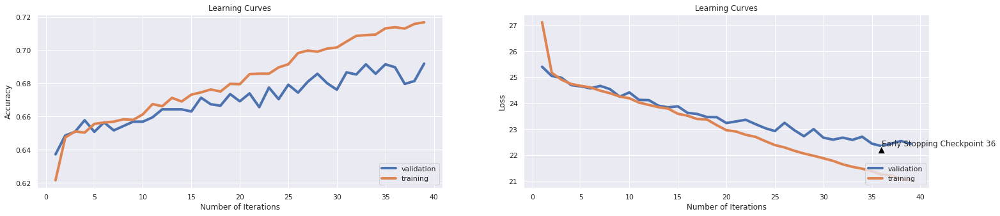

              precision    recall  f1-score
neutral        0.758242  0.777465  0.767733
antivax        0.550725  0.256757  0.350230
provax         0.641635  0.732899  0.684237
macro avg      0.650200  0.589040  0.600734
weighted avg   0.684263  0.691937  0.679880
Accuracy: 0.69194 

Total time: 54.75 seconds
Grid Search: 69, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.4348397596394592, 0.45255383074611916, 0.4750250375563345, 0.4823485227841763, 0.49455433149724587, 0.5078868302453681, 0.5179018527791688, 0.5249123685528292, 0.5328617926890336, 0.5389959939909865, 0.5443790686029043, 0.5506384576865297, 0.5540811216825238, 0.5575863795693541, 0.5630946419629445, 0.5679769654481722, 0.5680395593390085, 0.5746119178768152, 0.573798197295944, 0.5781171757636455, 0.5818102153229845, 0.5836254381572359, 0.581685027541312, 0.5858162243365047, 0.5882573860791187, 0.5903855783675513, 0.59263895843

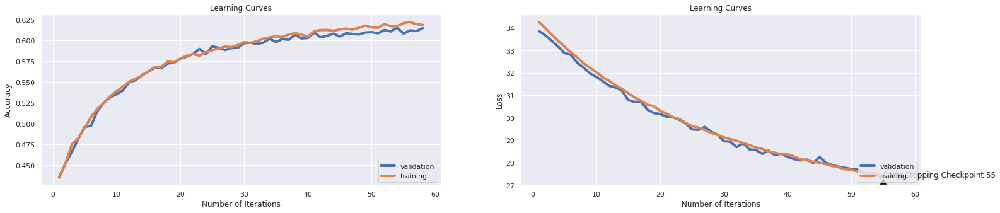

              precision    recall  f1-score
neutral        0.679313  0.706103  0.692449
antivax        0.396396  0.148649  0.216216
provax         0.570489  0.659066  0.611587
macro avg      0.548733  0.504606  0.506751
weighted avg   0.598695  0.614812  0.598041
Accuracy: 0.61481 

Total time: 78.98 seconds
Grid Search: 70, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6154231347020531, 0.6449674511767651, 0.6603655483224837, 0.6755132699048573, 0.6852779168753129, 0.6926014021031547, 0.6966700050075113, 0.6994241362043064, 0.6999248873309964, 0.7044316474712068, 0.7081872809213821, 0.7133825738607912, 0.7125688532799199]
Validation accuracy scores: [0.6319018404907976, 0.6397896581945661, 0.6608238387379491, 0.6818580192813322, 0.6669588080631026, 0.6730937773882559, 0.6822962313759859, 0.6814198071866784, 0.6805433829973707, 0.6871165644171779, 0.6871165644171779, 0.6849255039439088, 0.680981595

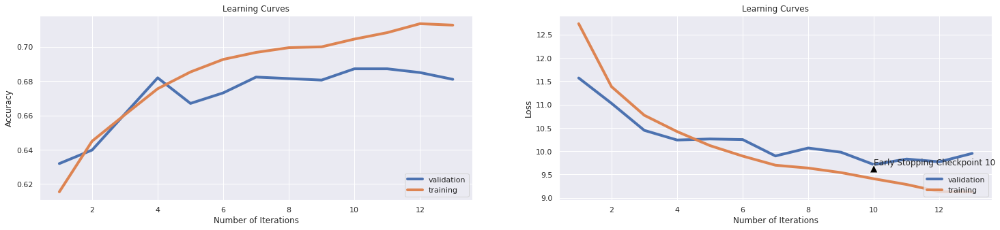

              precision    recall  f1-score
neutral        0.742674  0.761502  0.751970
antivax        0.598361  0.246622  0.349282
provax         0.627341  0.727470  0.673705
macro avg      0.656125  0.578531  0.591653
weighted avg   0.677407  0.680982  0.668150
Accuracy: 0.68098 

Total time: 18.46 seconds
Grid Search: 71, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6116049073610416, 0.6442789183775663, 0.650851276915373, 0.6519779669504256, 0.6576114171256885, 0.6582999499248874, 0.6603029544316474, 0.6600525788683025, 0.6661867801702553, 0.6661241862794192, 0.6658112168252378, 0.6697546319479218, 0.6767025538307461, 0.6799574361542313, 0.6785177766649975, 0.6837756634952429, 0.6835252879318978, 0.6875312969454181, 0.6877816725087631, 0.692163244867301, 0.6939158738107161, 0.6926014021031547, 0.6962944416624938, 0.7020530796194292, 0.699799699549324, 0.7001752628943415, 0.7024286429644466, 0.

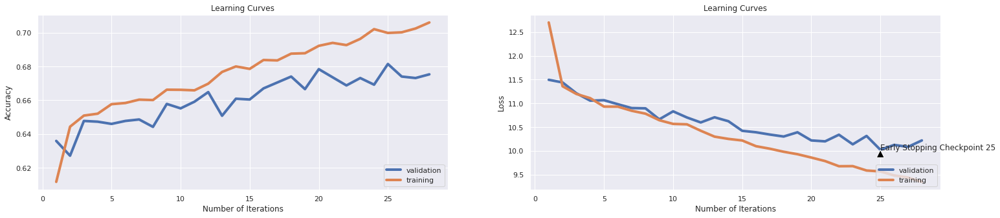

              precision    recall  f1-score
neutral        0.737466  0.759624  0.748381
antivax        0.567797  0.226351  0.323671
provax         0.623243  0.722041  0.669014
macro avg      0.642835  0.569339  0.580356
weighted avg   0.669358  0.675285  0.661260
Accuracy: 0.67528 

Total time: 38.11 seconds
Grid Search: 72, Layers: [220, 90], Optimizer: Adam, Activation: SELU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.27597646469704556, 0.2921882824236354, 0.31121682523785676, 0.33418878317476214, 0.3547821732598898, 0.37481221832749123, 0.39584376564847273, 0.41599899849774663, 0.43546569854782174, 0.45023785678517775, 0.46713820731096645, 0.48172258387581374, 0.4964321482223335, 0.5043815723585378, 0.5186529794692039, 0.5262894341512269, 0.53542814221332, 0.5426264396594892, 0.5456935403104657, 0.5521407110665999, 0.5577741612418627, 0.560027541311968, 0.5669128693039559, 0.5706685027541312, 0.5739859789684527, 0.5788683024536805, 0.57630195292

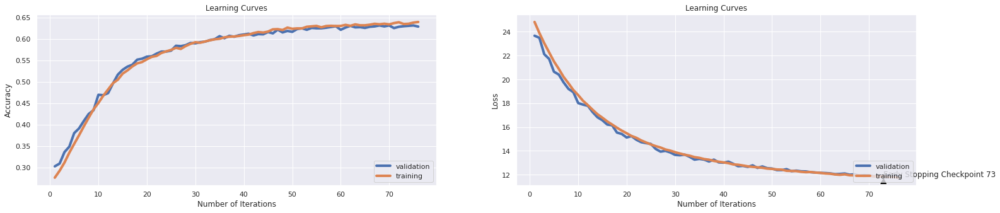

              precision    recall  f1-score
neutral        0.700094  0.701408  0.700750
antivax        0.436364  0.081081  0.136752
provax         0.571552  0.719870  0.637194
macro avg      0.569336  0.500786  0.491565
weighted avg   0.614006  0.628396  0.601943
Accuracy: 0.62840 

Total time: 102.75 seconds
Grid Search: 73, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6127941912869304, 0.6591762643965949, 0.6695042563845769, 0.6757636454682023, 0.6836504757135704, 0.6818978467701552, 0.6893465197796695, 0.6881572358537806, 0.6887831747621432, 0.6859038557836755, 0.6875938908362543, 0.6882198297446169, 0.6877816725087631, 0.6893465197796695]
Validation accuracy scores: [0.6520595968448729, 0.6568799298860648, 0.6625766871165644, 0.6608238387379491, 0.6617002629272568, 0.6695880806310254, 0.6673970201577564, 0.6621384750219106, 0.6617002629272568, 0.6621384750219106, 0.664329535495179

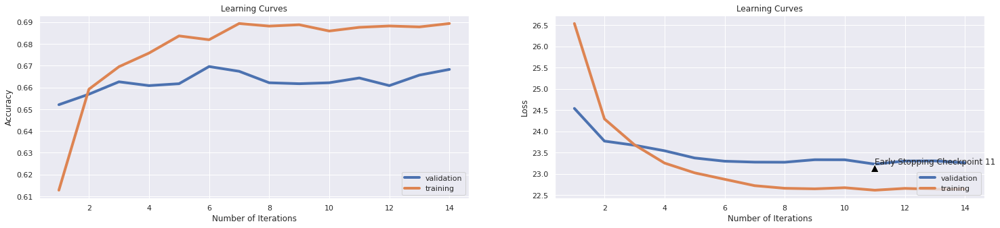

              precision    recall  f1-score
neutral        0.722772  0.753991  0.738051
antivax        0.548387  0.229730  0.323810
provax         0.624642  0.710098  0.664634
macro avg      0.631934  0.564606  0.575498
weighted avg   0.660548  0.668273  0.654689
Accuracy: 0.66827 

Total time: 16.71 seconds
Grid Search: 74, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.563970956434652, 0.6067225838758137, 0.6209313970956435, 0.6342638958437656, 0.6400851276915374, 0.6434651977966951, 0.6504131196795193, 0.6559839759639459, 0.657986980470706, 0.6581121682523786, 0.6628067100650976, 0.6660615923885829, 0.6649349023535303, 0.6694416624937406, 0.6718828242363545, 0.672258387581372, 0.6757636454682023, 0.6736354531797697, 0.6814596895343015, 0.6825863795693541, 0.6798948422633951, 0.6841512268402604, 0.6849023535302955, 0.6844641962944417, 0.6900976464697045, 0.6889083625438157, 0.68872058087130

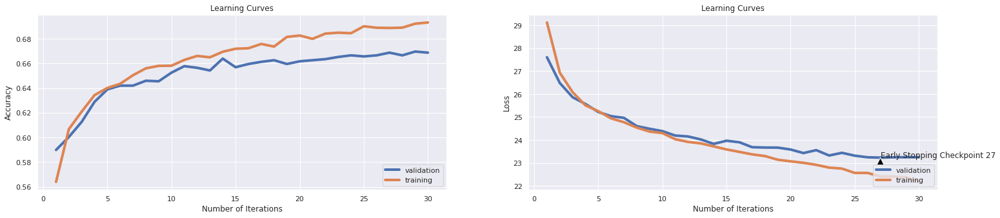

              precision    recall  f1-score
neutral        0.733211  0.748357  0.740706
antivax        0.473171  0.327703  0.387226
provax         0.638384  0.686211  0.661434
macro avg      0.614922  0.587423  0.596455
weighted avg   0.661209  0.668712  0.662862
Accuracy: 0.66871 

Total time: 34.96 seconds
Grid Search: 75, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5233475212819229, 0.5932023034551828, 0.614672008012018, 0.6241236855282924, 0.6368928392588883, 0.6442789183775663, 0.6534802203304958, 0.6562343515272909, 0.664121181772659, 0.6696294441662494, 0.6723835753630446, 0.6748247371056585, 0.6818978467701552, 0.6849649474211317, 0.6854656985478217, 0.692163244867301, 0.6977966950425638, 0.6959814722083125, 0.6996745117676515, 0.7064972458688032, 0.7080620931397096, 0.7092513770655984]
Validation accuracy scores: [0.5687992988606485, 0.6003505696757231, 0.6183172655565293, 0.63

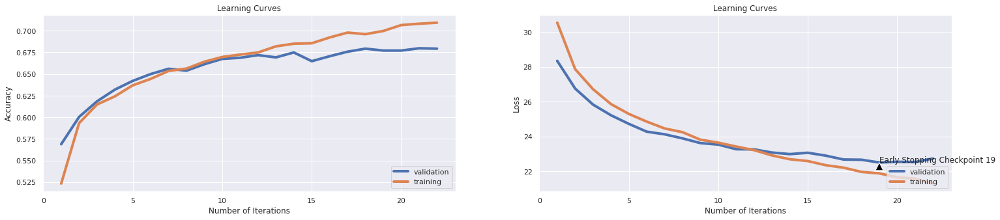

              precision    recall  f1-score
neutral        0.788421  0.703286  0.743424
antivax        0.556452  0.233108  0.328571
provax         0.605960  0.794788  0.687647
macro avg      0.650278  0.577061  0.586548
weighted avg   0.684692  0.679229  0.667102
Accuracy: 0.67923 

Total time: 27.40 seconds
Grid Search: 76, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6066599899849775, 0.6554832248372559, 0.667313470205308, 0.677391086629945, 0.6822108162243365, 0.681334501752629, 0.6880320480721082, 0.6858412618928392, 0.684526790185278, 0.6854031046569855, 0.6882824236354532, 0.6866549824737106, 0.6896594892338508]
Validation accuracy scores: [0.6297107800175284, 0.6393514460999123, 0.6481156879929886, 0.6489921121822962, 0.64943032427695, 0.6489921121822962, 0.6568799298860648, 0.6529360210341806, 0.654250657318142, 0.6507449605609115, 0.654250657318142, 0.6529360210341806, 0.64723926380

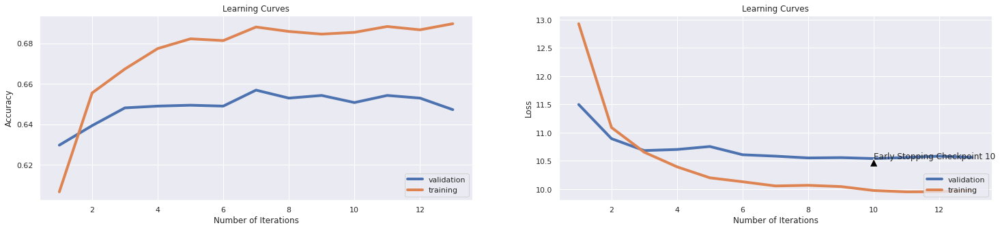

              precision    recall  f1-score
neutral        0.736373  0.697653  0.716490
antivax        0.518519  0.189189  0.277228
provax         0.581974  0.736156  0.650048
macro avg      0.612288  0.540999  0.547922
weighted avg   0.645800  0.647239  0.632697
Accuracy: 0.64724 

Total time: 15.55 seconds
Grid Search: 77, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.524849774661993, 0.5873810716074112, 0.6096644967451177, 0.6268778167250876, 0.6362669003505258, 0.6387080620931397, 0.6476589884827241, 0.6545443164747121, 0.656484727090636, 0.6604907361041562, 0.6616800200300451, 0.6656860290435653, 0.6671256885327992, 0.6719454181271908, 0.6711942914371557, 0.6779544316474712, 0.6791437155733601, 0.6766399599399099, 0.6822734101151727, 0.6855908863294943, 0.6837130696044066, 0.6869679519278918, 0.6878442663995994, 0.6906609914872308, 0.6935403104656985, 0.6919754631947922, 0.6923510265398097, 0.

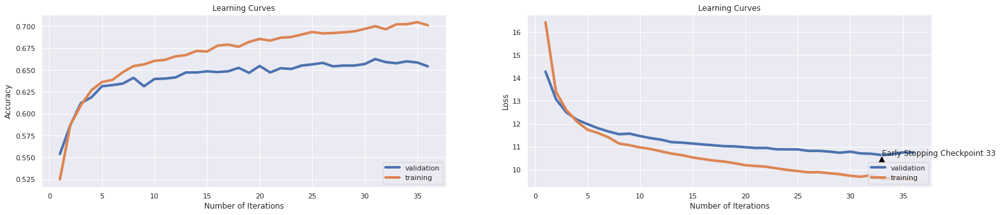

              precision    recall  f1-score
neutral        0.695326  0.782160  0.736191
antivax        0.513889  0.250000  0.336364
provax         0.623404  0.636265  0.629769
macro avg      0.610873  0.556142  0.567441
weighted avg   0.642764  0.654251  0.641378
Accuracy: 0.65425 

Total time: 41.39 seconds
Grid Search: 78, Layers: [220, 90], Optimizer: SGD, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4936154231347021, 0.5758012018027041, 0.6002754131196795, 0.6206184276414622, 0.6337005508262393, 0.6439659489233851, 0.6467200801201802, 0.6550450676014021, 0.6618678017025539, 0.6688783174762143, 0.6690660991487231, 0.6758262393590385, 0.6810215322984476, 0.681334501752629, 0.6870305458187281, 0.6907861792689034, 0.696106659989985, 0.6933525287931898, 0.7011767651477215, 0.6994241362043064, 0.7080620931397096, 0.7085002503755633, 0.707686529794692, 0.7114421632448673, 0.7177015523284928, 0.7169504256384577, 0.7205808713069605, 

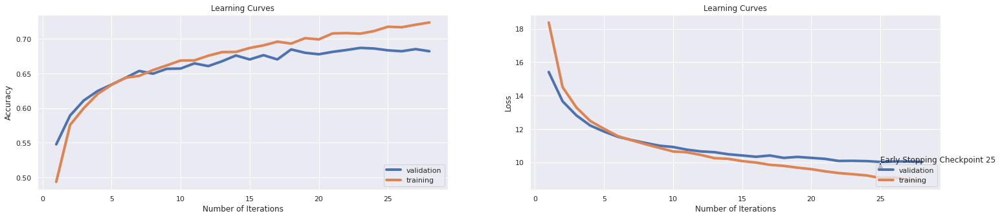

              precision    recall  f1-score
neutral        0.744973  0.765258  0.754979
antivax        0.571429  0.216216  0.313725
provax         0.630112  0.736156  0.679019
macro avg      0.648838  0.572544  0.582574
weighted avg   0.676105  0.682296  0.667087
Accuracy: 0.68230 

Total time: 34.06 seconds
Grid Search: 79, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6408988482724086, 0.6928517776664997, 0.7178893340010015, 0.7346019028542814, 0.7506885327991988]
Validation accuracy scores: [0.6577563540753725, 0.6695880806310254, 0.679666958808063, 0.6814198071866784, 0.6827344434706398]
Training f1 scores: [0.622859295643429, 0.6804181277794157, 0.7094610084204765, 0.7271928088312404, 0.744248228418419]
Validation f1 scores: [0.6436206521317674, 0.6635621811399971, 0.6668328066981738, 0.6723141392798421, 0.6727781445892271]
Training losses: [25.378224826812744, 22.40332410049

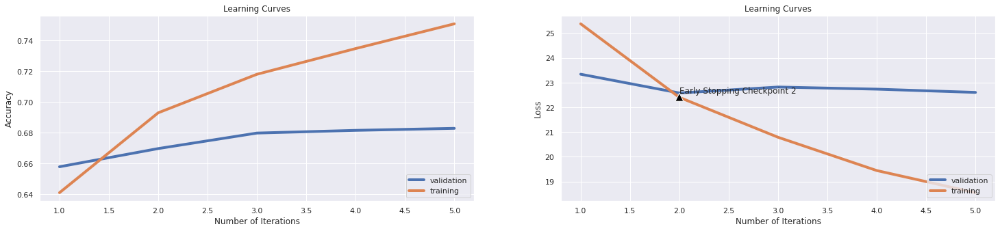

              precision    recall  f1-score
neutral        0.753917  0.768075  0.760930
antivax        0.491228  0.283784  0.359743
provax         0.639376  0.712269  0.673857
macro avg      0.628174  0.588043  0.598177
weighted avg   0.673616  0.682734  0.673750
Accuracy: 0.68273 

Total time: 6.83 seconds
Grid Search: 80, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6129819729594391, 0.6607411116675013, 0.677391086629945, 0.6898472709063596, 0.6973585378067101, 0.7078117175763645, 0.7150100150225338, 0.7225212819228843, 0.732536304456685, 0.7372934401602403, 0.7496870305458188, 0.7523785678517777]
Validation accuracy scores: [0.6419807186678352, 0.6520595968448729, 0.6647677475898335, 0.6678352322524101, 0.6757230499561788, 0.6722173531989483, 0.6713409290096407, 0.6722173531989483, 0.6691498685363716, 0.6748466257668712, 0.684487291849255, 0.677475898334794]
Training f1 scores: [0.5

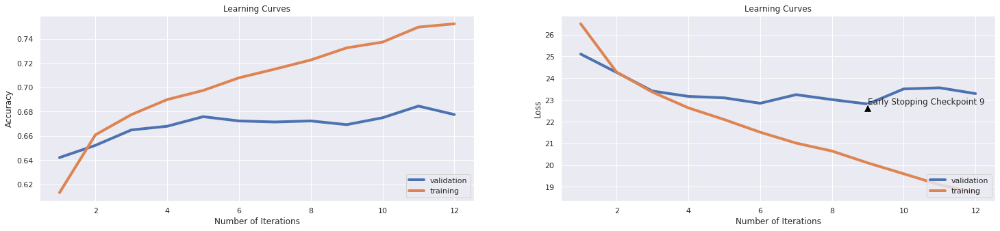

              precision    recall  f1-score
neutral        0.749541  0.767136  0.758237
antivax        0.469945  0.290541  0.359081
provax         0.637265  0.698154  0.666321
macro avg      0.618917  0.585277  0.594546
weighted avg   0.667961  0.677476  0.669365
Accuracy: 0.67748 

Total time: 15.12 seconds
Grid Search: 81, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.5306710065097646, 0.5988983475212819, 0.6169253880821232, 0.627941912869304, 0.6392088132198297, 0.6478467701552328, 0.650851276915373, 0.6579243865798698, 0.6635578367551327, 0.6691286930395594, 0.6731347020530796, 0.6725713570355534, 0.6773284927391087, 0.6852779168753129, 0.6827115673510266, 0.6873435152729094, 0.6932899349023536, 0.6954181271907862, 0.7004882323485228, 0.6996745117676515, 0.7064972458688032, 0.7099399098647972, 0.7128818227341012, 0.7167000500751126, 0.7192663995993991]
Validation accuracy scores:

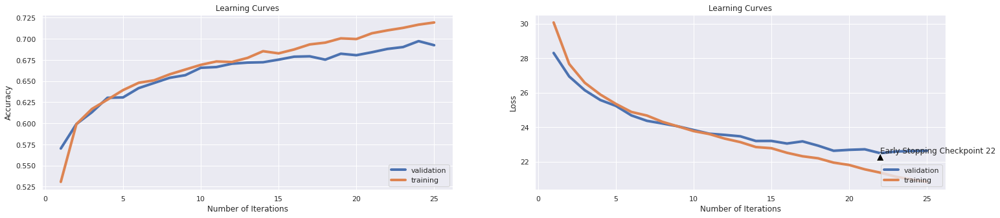

              precision    recall  f1-score
neutral        0.793878  0.730516  0.760880
antivax        0.527473  0.324324  0.401674
provax         0.630357  0.766558  0.691818
macro avg      0.650569  0.607133  0.618124
weighted avg   0.693326  0.692375  0.686414
Accuracy: 0.69238 

Total time: 32.43 seconds
Grid Search: 82, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: Exponential
Training accuracy scores: [0.6433400100150225, 0.6951677516274412, 0.7163870806209314, 0.7325988983475212, 0.7456184276414622, 0.7577616424636956, 0.7620180270405609, 0.7663370055082624, 0.7688407611417125, 0.7692789183775663]
Validation accuracy scores: [0.6687116564417178, 0.6761612620508326, 0.6814198071866784, 0.689307624890447, 0.6871165644171779, 0.6901840490797546, 0.7002629272567923, 0.6950043821209465, 0.6967572304995618, 0.6954425942156004]
Training f1 scores: [0.6216703192487703, 0.6805050432451127, 0.7035281109718514, 0.7210676854576189, 

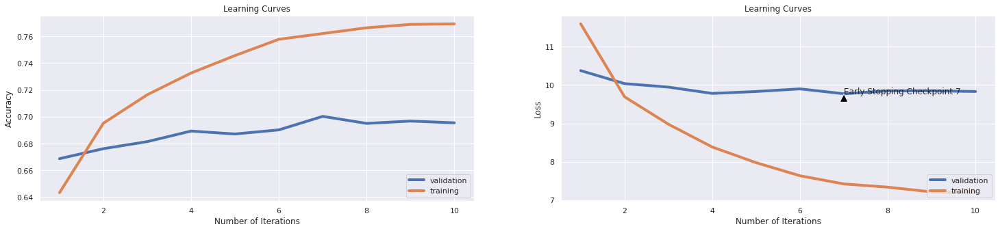

              precision    recall  f1-score
neutral        0.792821  0.725822  0.757843
antivax        0.560241  0.314189  0.402597
provax         0.631902  0.782845  0.699321
macro avg      0.661654  0.607619  0.619921
weighted avg   0.697707  0.695443  0.688145
Accuracy: 0.69544 

Total time: 12.75 seconds
Grid Search: 83, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.6150475713570356, 0.6562969454181272, 0.6765147721582374, 0.6859038557836755, 0.693665498247371, 0.7020530796194292, 0.7120055082623936, 0.7187030545818728, 0.7286554832248373, 0.7323485227841763]
Validation accuracy scores: [0.642418930762489, 0.6551270815074496, 0.6481156879929886, 0.661262050832603, 0.670464504820333, 0.6748466257668712, 0.6805433829973707, 0.6717791411042945, 0.6783523225241017, 0.6787905346187555]
Training f1 scores: [0.5890841333852315, 0.633941635184551, 0.6584558322245015, 0.6681326336095, 0.67948858896

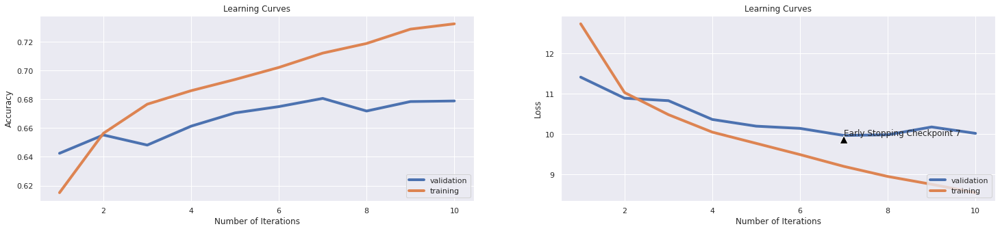

              precision    recall  f1-score
neutral        0.780665  0.705164  0.740997
antivax        0.539877  0.297297  0.383442
provax         0.613656  0.770901  0.683349
macro avg      0.644733  0.591121  0.602596
weighted avg   0.682029  0.678791  0.671352
Accuracy: 0.67879 

Total time: 12.80 seconds
Grid Search: 84, Layers: [220, 90], Optimizer: Nesterov, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: OneCycle
Training accuracy scores: [0.4903605408112168, 0.5688532799198798, 0.592513770655984, 0.6150475713570356, 0.6286304456685028, 0.6412744116174262, 0.6474712068102153, 0.6551702553830746, 0.6576740110165248, 0.6653730595893841, 0.6721331997996995, 0.6716950425638458, 0.6785803705558338, 0.6821482223335003, 0.6864672008012018, 0.6875312969454181, 0.6907861792689034, 0.6932899349023536, 0.6954807210816224, 0.7028668002003005, 0.7028668002003005, 0.7086254381572359, 0.7100025037556335, 0.7129444166249375, 0.7129444166249375, 0.7168878317476214, 0.72158237356

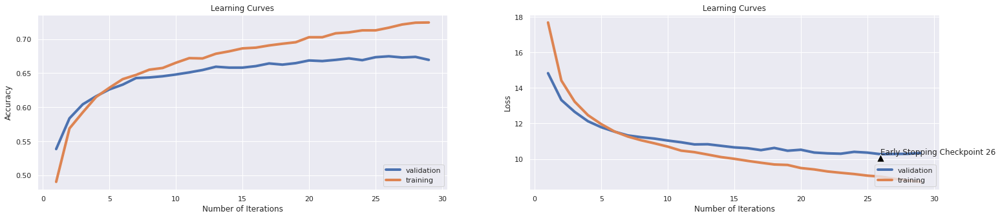

              precision    recall  f1-score
neutral        0.744361  0.743662  0.744011
antivax        0.548387  0.172297  0.262211
provax         0.608889  0.743757  0.669599
macro avg      0.633879  0.553239  0.558607
weighted avg   0.664265  0.669588  0.651484
Accuracy: 0.66959 

Total time: 35.89 seconds
Grid Search: 85, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.44310215322984475, 0.4936780170255383, 0.5222834251377065, 0.5385578367551327, 0.5552078117175764, 0.5673510265398097, 0.5727341011517276, 0.582436154231347, 0.5847521281922884, 0.5883199799699549, 0.5943915873810716, 0.5953930896344517, 0.6022158237356035, 0.6032799198798198, 0.6051577366049073, 0.6096019028542814, 0.6087881822734101, 0.6116675012518779, 0.6174887330996495, 0.6171131697546319, 0.6169879819729595, 0.6196795192789184, 0.6204306459689535, 0.6216825237856786, 0.625, 0.6256259389083625, 0.6268778167250876, 0.

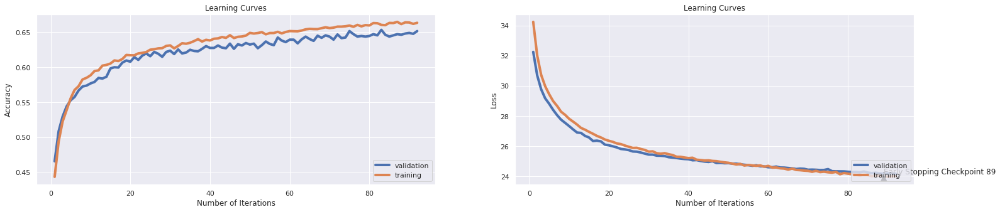

              precision    recall  f1-score
neutral        0.701599  0.741784  0.721132
antivax        0.530973  0.202703  0.293399
provax         0.610738  0.691640  0.648676
macro avg      0.614437  0.545375  0.554402
weighted avg   0.642796  0.651621  0.636408
Accuracy: 0.65162 

Total time: 124.19 seconds
Grid Search: 86, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.31609914872308464, 0.32836755132699047, 0.3324987481221833, 0.3423259889834752, 0.34626940410615925, 0.3545943915873811, 0.3611667501251878, 0.37512518778167253, 0.3801952929394091, 0.38632949424136204, 0.39327741612418626, 0.3992864296444667, 0.407486229344016, 0.414621932899349, 0.41499749624436655, 0.42582623935903857, 0.43189784677015525, 0.43421382073109666, 0.4419754631947922, 0.446607411116675, 0.45461942914371556, 0.4548072108162243, 0.46219328993490233, 0.46688783174762144, 0.46920380570856285, 0.47101902854281

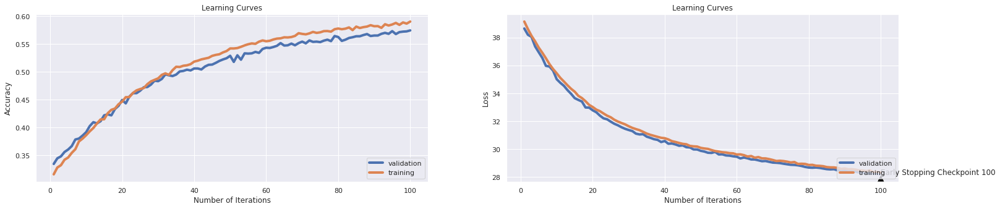

              precision    recall  f1-score
neutral        0.591073  0.770892  0.669112
antivax        0.750000  0.010135  0.020000
provax         0.547807  0.528773  0.538122
macro avg      0.629626  0.436600  0.409078
weighted avg   0.594225  0.574496  0.532048
Accuracy: 0.57450 

Total time: 135.12 seconds
Grid Search: 87, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.46663745618427643, 0.4655107661492238, 0.46688783174762144, 0.4650100150225338, 0.4651977966950426, 0.4654481722583876, 0.4656985478217326, 0.4669504256384577, 0.46463445167751627]
Validation accuracy scores: [0.46231375985977213, 0.46406660823838736, 0.4601226993865031, 0.46319018404907975, 0.4636283961437336, 0.4601226993865031, 0.4609991235758107, 0.4614373356704645, 0.45880806310254163]
Training f1 scores: [0.33463460539739814, 0.33381255750323047, 0.3362839946906761, 0.3339627720931662, 0.3354636728721587, 0.3343676

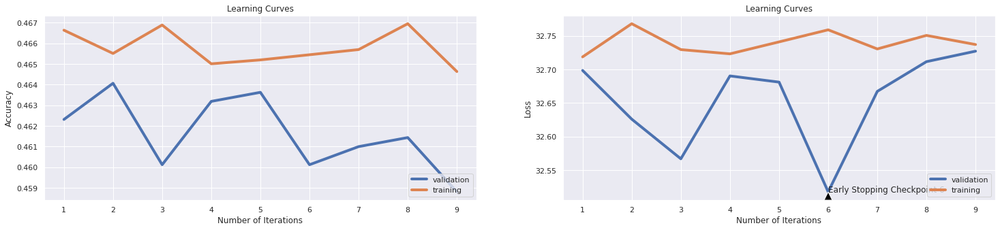

              precision    recall  f1-score
neutral        0.464104  0.940845  0.621588
antivax        0.250000  0.003378  0.006667
provax         0.369748  0.047774  0.084615
macro avg      0.361284  0.330666  0.237623
weighted avg   0.398251  0.458808  0.325108
Accuracy: 0.45881 

Total time: 12.85 seconds
Grid Search: 88, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.3578492739108663, 0.4151226840260391, 0.4528042063094642, 0.47684026039058586, 0.49499248873309964, 0.5020030045067602, 0.5156484727090636, 0.521657486229344, 0.5335503254882323, 0.5431271907861792, 0.5469454181271908, 0.5550200300450676, 0.5587756634952429, 0.5616549824737106, 0.5657861792689034, 0.5690410615923885, 0.5752378567851778, 0.5770530796194292, 0.5795568352528793, 0.5831872809213821, 0.5876940410615924, 0.5867551326990486, 0.588820731096645, 0.5938908362543815, 0.5947671507260891, 0.5965197796695042, 0.59939909864797

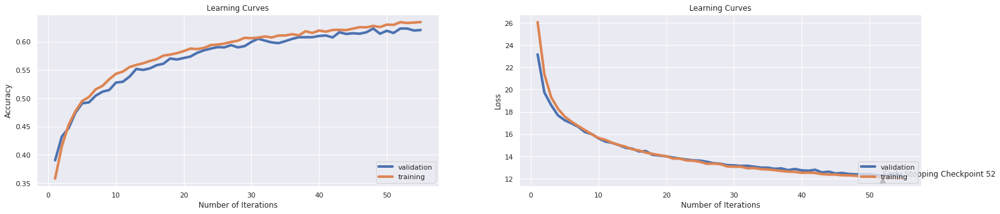

              precision    recall  f1-score
neutral        0.681368  0.710798  0.695772
antivax        0.428571  0.212838  0.284424
provax         0.582031  0.647123  0.612853
macro avg      0.563990  0.523586  0.531017
weighted avg   0.608486  0.620508  0.608950
Accuracy: 0.62051 

Total time: 74.21 seconds
Grid Search: 89, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.2693415122684026, 0.281735102653981, 0.2990110165247872, 0.31290686029043563, 0.3297446169253881, 0.3434526790185278, 0.35446920380570857, 0.37130696044066097, 0.3810716074111167, 0.3869554331497246, 0.40047571357035555, 0.407486229344016, 0.4190035052578868, 0.42595142714071105, 0.4313970956434652, 0.4381572358537807, 0.44335252879318976, 0.4506134201301953, 0.454243865798698, 0.4588132198297446, 0.4624436654982474, 0.4668252378567852, 0.474899849774662, 0.4736479719579369, 0.47990736104156234, 0.48165998998497744, 0.483350025

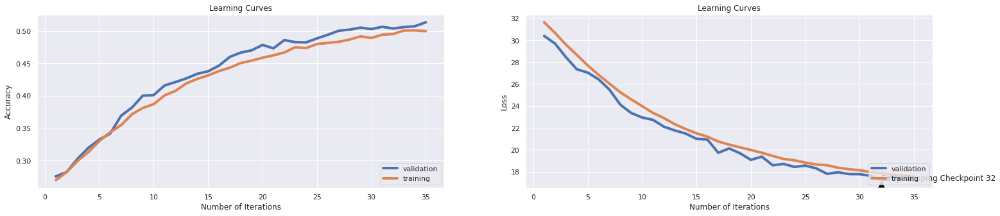

              precision    recall  f1-score
neutral        0.535088  0.687324  0.601726
antivax        0.206522  0.064189  0.097938
provax         0.512165  0.457112  0.483075
macro avg      0.417925  0.402875  0.394247
weighted avg   0.483218  0.513585  0.488493
Accuracy: 0.51358 

Total time: 47.18 seconds
Grid Search: 90, Layers: [220, 90], Optimizer: Adadelta, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.42939409113670507, 0.42695292939409113, 0.42707811717576366, 0.4261392088132198, 0.42682774161241865]
Validation accuracy scores: [0.42813321647677477, 0.4329535495179667, 0.43120070113935144, 0.43076248904469766, 0.4294478527607362]
Training f1 scores: [0.341086132423369, 0.33806569807950754, 0.33822646264428274, 0.337845298410756, 0.3376447572875851]
Validation f1 scores: [0.3359353783148496, 0.34597238262822066, 0.3391380028350264, 0.3477669252722213, 0.33961109578978055]
Training losses: [25.130985813140867, 25.2010367145538

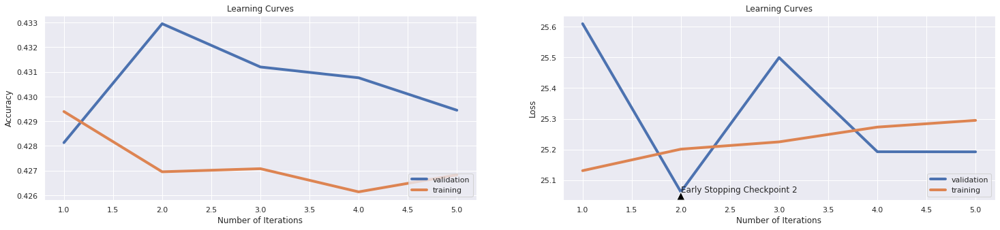

              precision    recall  f1-score
neutral        0.454545  0.835681  0.588819
antivax        0.127660  0.060811  0.082380
provax         0.393443  0.078176  0.130435
macro avg      0.325216  0.324889  0.267211
weighted avg   0.387484  0.429448  0.338128
Accuracy: 0.42945 

Total time: 7.44 seconds
Grid Search: 91, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.645405608412619, 0.693415122684026, 0.7143840761141712, 0.7230846269404106, 0.742363545317977, 0.7593264897346019]
Validation accuracy scores: [0.6673970201577564, 0.677475898334794, 0.6805433829973707, 0.6801051709027169, 0.689307624890447, 0.6971954425942156]
Training f1 scores: [0.6245445067283252, 0.6823855070041348, 0.7049926345947157, 0.7156558666944457, 0.7353224082080595, 0.7534039194221016]
Validation f1 scores: [0.6469176229645802, 0.660168141600931, 0.6719627394110416, 0.6722294897675992, 0.6761465711316424, 0.69501

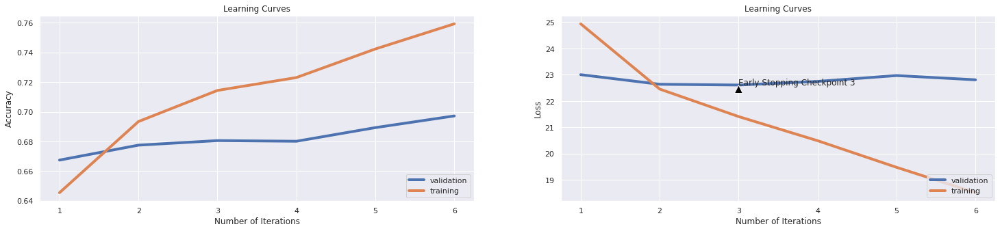

              precision    recall  f1-score
neutral        0.768720  0.761502  0.765094
antivax        0.543478  0.422297  0.475285
provax         0.656971  0.711183  0.683003
macro avg      0.656390  0.631661  0.641128
weighted avg   0.694403  0.697195  0.694372
Accuracy: 0.69720 

Total time: 8.80 seconds
Grid Search: 92, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5783675513269905, 0.6444041061592388, 0.6574236354531797, 0.6678768152228343, 0.6748247371056585, 0.6847771657486229, 0.6911617426139208, 0.6958562844266399, 0.7014271407110666, 0.7043690535803706, 0.7115673510265398, 0.7148848272408613, 0.7168252378567852, 0.721957936905358, 0.7277791687531296, 0.728092138207311, 0.7316599899849775, 0.7349148723084626, 0.7399849774661993, 0.7414872308462694, 0.7439909864797196, 0.74949924887331, 0.7520655983975963, 0.7565723585378067, 0.7572608913370055]
Validation accuracy scores: [0.632778

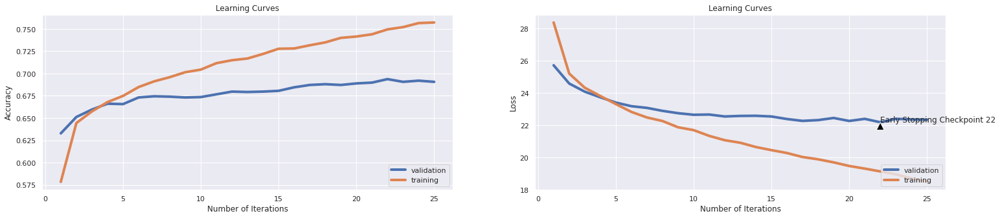

              precision    recall  f1-score
neutral        0.774634  0.745540  0.759809
antivax        0.525773  0.344595  0.416327
provax         0.639699  0.738328  0.685484
macro avg      0.646702  0.609487  0.620540
weighted avg   0.687895  0.690622  0.685258
Accuracy: 0.69062 

Total time: 34.07 seconds
Grid Search: 93, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.3902729093640461, 0.4009138708062093, 0.40704807210816224, 0.41399599399098647, 0.4225713570355533, 0.4275788683024537, 0.43164747120681024, 0.43834501752628946, 0.4475463194792188, 0.44779669504256386, 0.45299198798197293, 0.4574987481221833, 0.4659489233850776, 0.46663745618427643, 0.4695167751627441, 0.47608913370055084, 0.482035553329995, 0.4835378067100651, 0.4880445668502754, 0.4894842263395093, 0.49774661992989483, 0.5003755633450175, 0.5045067601402103, 0.5048823234852279, 0.5106409614421632, 0.510828743114672, 0.5121

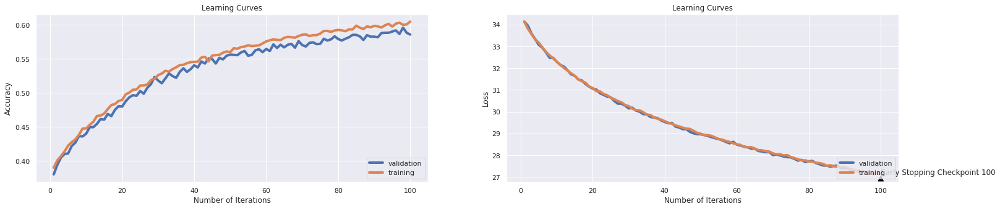

              precision    recall  f1-score
neutral        0.601279  0.794366  0.684466
antivax        0.333333  0.016892  0.032154
provax         0.563953  0.526602  0.544638
macro avg      0.499522  0.445953  0.420419
weighted avg   0.551459  0.585451  0.543420
Accuracy: 0.58545 

Total time: 133.49 seconds
Grid Search: 94, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.001, Schelduler: None
Training accuracy scores: [0.6349524286429644, 0.690473209814722, 0.71407110665999, 0.7273410115172759, 0.7406109163745619, 0.7570731096644967]
Validation accuracy scores: [0.6722173531989483, 0.686678352322524, 0.6888694127957932, 0.6871165644171779, 0.6862401402278703, 0.6818580192813322]
Training f1 scores: [0.6157825397990754, 0.6778139793477522, 0.7026972879491981, 0.7165252525723473, 0.7327723085788773, 0.7490843758528356]
Validation f1 scores: [0.6499206794836739, 0.6735571553617168, 0.6754782869380652, 0.679623234611765, 0.6754828164756355, 0.675422422

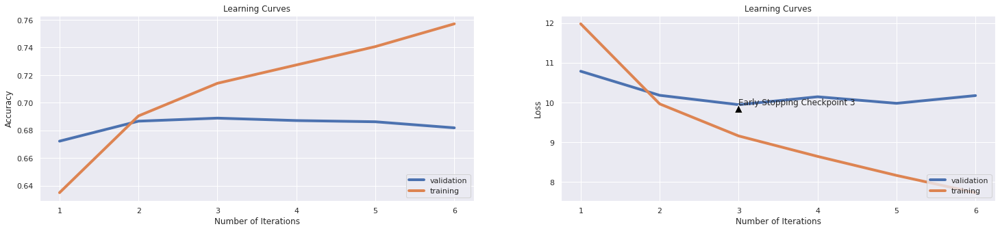

              precision    recall  f1-score
neutral        0.776074  0.712676  0.743025
antivax        0.531429  0.314189  0.394904
provax         0.623561  0.764387  0.686829
macro avg      0.643688  0.597084  0.608253
weighted avg   0.682787  0.681858  0.675190
Accuracy: 0.68186 

Total time: 9.01 seconds
Grid Search: 95, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 0.0001, Schelduler: None
Training accuracy scores: [0.5694166249374061, 0.6256259389083625, 0.6489108662994492, 0.6671256885327992, 0.6770781171757636, 0.6839008512769154, 0.6932899349023536, 0.7026164246369554, 0.703492739108663, 0.7164496745117677, 0.7232724086129194, 0.721457185778668, 0.7289058587881823, 0.7358537806710065, 0.7424887330996495]
Validation accuracy scores: [0.6042944785276073, 0.619193689745837, 0.635407537248028, 0.6380368098159509, 0.6489921121822962, 0.656441717791411, 0.6577563540753725, 0.6568799298860648, 0.6577563540753725, 0.6638913234005258, 0.66389132340052

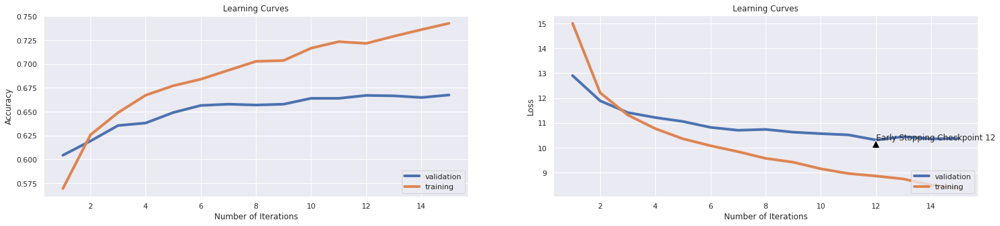

              precision    recall  f1-score
neutral        0.760364  0.706103  0.732230
antivax        0.508475  0.304054  0.380550
provax         0.610215  0.739414  0.668630
macro avg      0.626351  0.583190  0.593803
weighted avg   0.667092  0.667397  0.660945
Accuracy: 0.66740 

Total time: 20.61 seconds
Grid Search: 96, Layers: [220, 90], Optimizer: Adam, Activation: ReLU, Loss: Hinge, Learning Rate: 5e-07, Schelduler: None
Training accuracy scores: [0.1978592889334001, 0.21188032048072108, 0.22552578868302453, 0.24242613920881323, 0.2649599399098648, 0.2804832248372559, 0.30451927891837755, 0.32192038057085626, 0.3373810716074111, 0.35903855783675515, 0.3711817726589885, 0.3907736604907361, 0.4044817225838758, 0.41531046569854785, 0.43264897346019027, 0.4412869303955934, 0.45486980470706057, 0.46457185778668003, 0.47045568352528794, 0.47934401602403603, 0.48535302954431647, 0.49092388582874313, 0.4956810215322984, 0.5070105157736605, 0.5089509263895844, 0.513770655983976, 0.51740

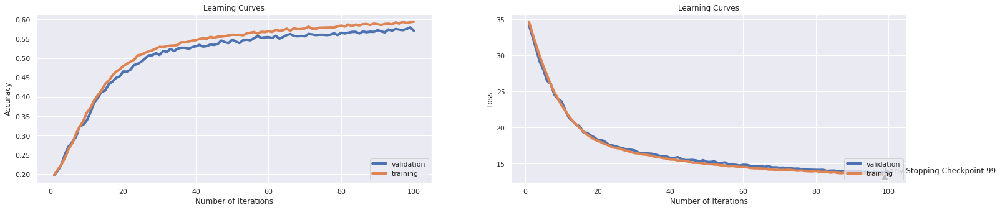

              precision    recall  f1-score
neutral        0.628893  0.682629  0.654660
antivax        0.333333  0.094595  0.147368
provax         0.525912  0.595005  0.558329
macro avg      0.496046  0.457410  0.453453
weighted avg   0.548993  0.570990  0.549980
Accuracy: 0.57099 

Total time: 132.14 seconds
Best grid is: Grid Search: 20, Layers: [75], Optimizer: Adam, Activation: SELU, Loss: CrossEntropy, Learning Rate: 0.0001, Schelduler: None


In [ ]:
param_grid = {
  'neurons': [[75], [220, 90]],
  'activation_functions': ['SELU', 'ReLU'],
  'optimizers': ['SGD', 'Nesterov', 'Adadelta', 'Adam'],
  'loss_functions': ['CrossEntropy', 'Hinge'],
  'learning_rates': [{'val': 1e-3, 'schelduler' : 'Exponential'}, {'val': 1e-4, 'schelduler' : None}, {'val' : 5e-7, 'schelduler' : 'OneCycle'}],
  'classes': ['neutral', 'antivax', 'provax'],
  'batch_size': 32,
  'epochs': 100,
  'early_stopping_patience': 3,
  'input_normalization' : True,
  'L2_reg': 1e-4,
  'accuracy_threshold': 0.68
}

customGridSearch(param_grid, glove_training_set, glove_validation_set)

## **Best GLoVe Model**

Training accuracy scores: [0.4405983975963946, 0.6026539809714572, 0.6304456685027542, 0.6379569354031046, 0.64421632448673, 0.6482849273910867, 0.6512894341512269, 0.6489108662994492, 0.6545443164747121, 0.6539183775663495, 0.6528542814221332, 0.653292438657987, 0.6572984476715072, 0.6606159238858288, 0.6617426139208813, 0.6594266399599399, 0.6618678017025539, 0.6625563345017527, 0.6618052078117176, 0.6633074611917876, 0.6670630946419629, 0.664621932899349, 0.6663119679519279, 0.6633074611917876, 0.6694416624937406, 0.6713820731096645, 0.6672508763144717, 0.6698172258387581, 0.6698798197295944, 0.6751377065598397, 0.6723209814722083, 0.6752628943415123, 0.6782048072108162, 0.6802078117175764, 0.6812093139709564, 0.6795818728092138, 0.6835252879318978, 0.6840260390585878, 0.6859038557836755, 0.6890961442163245, 0.6884076114171257, 0.6927891837756635, 0.6900976464697045, 0.6910365548322484, 0.6914121181772659, 0.6953555332999499, 0.6957936905358038, 0.697108162243365, 0.6982348522784176

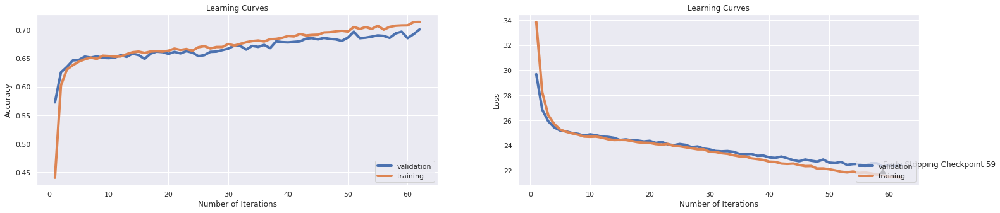

              precision    recall  f1-score
neutral        0.760000  0.767136  0.763551
antivax        0.587838  0.293919  0.391892
provax         0.656280  0.754615  0.702020
macro avg      0.668039  0.605223  0.619154
weighted avg   0.695808  0.700701  0.690510
Accuracy: 0.70070 






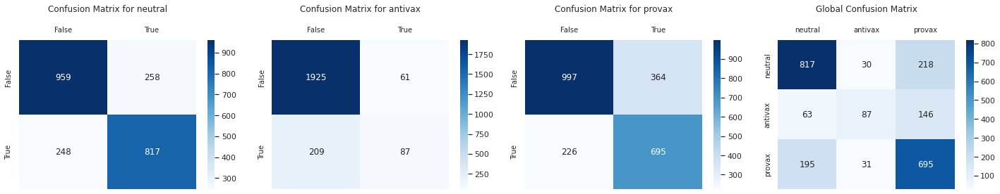

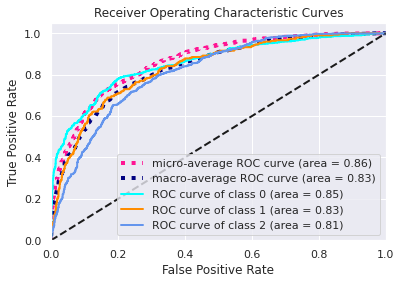

In [ ]:
# Grid Search: 3, Layers: [75], Optimizer: SGD, Activation: SELU, Loss: CrossEntropy, Learning Rate: 5e-07, Schelduler: OneCycle

# Hyperparameters
batch_size = 32
epochs = 100
early_stopping_patience = 3
L2_reg = 1e-4
learning_rate = 5e-07

activation_function = activation_functions['SELU']()
layers = [{'neurons': 75,  'activation_fun': activation_function},
          {'neurons': 3, 'activation_fun': None}
          ]

model = NeuralNet(layers, glove_training_set[0].shape[1], True)

optimizer = optimizers['SGD'](model.parameters(), learning_rate, L2_reg)
loss_function = loss_functions['CrossEntropy'](reduction = 'sum')
schelduler = {'name':  'OneCycle', 'schelduler': scheldulers['OneCycle'](optimizer, math.ceil(glove_training_set[0].shape[0] / batch_size), epochs, learning_rate * 100), 'epoch_step': False} 

model.trainNNWithOptions(glove_training_set, optimizer, loss_function, glove_validation_set, schelduler, stats = True, batch_size = batch_size, epochs = epochs, early_stopping_params = {'patience': early_stopping_patience})
scores = modelEvaluation(model, glove_validation_set, ['neutral', 'antivax', 'provax'], cm_plot = True, roc_plot = True)